In [1]:
import sys
from pathlib import Path
import duckdb
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.dates as mdates
from IPython.display import display, Markdown

_root = Path.cwd()
while not (_root / "analyst").exists() and _root != _root.parent:
    _root = _root.parent

sys.path.insert(0, str(_root))
sys.path.insert(0, str(_root / "src"))
from analyst.lib.table_formatting import format_analysis_table, display_analysis_table
import analyst.lib.plot_utils as pu

CQ_COLORS = {
    "blue":       "#1696d2",
    "black":      "#000000",
    "gray_dark":  "#353535",
    "gray":       "#696969",
    "gray_light": "#d2d2d2",
    "yellow":     "#fdbf11",
    "orange":     "#f15a24",
    "red":        "#ec008b",
}
CQ_SEQUENCE = [
    CQ_COLORS["blue"],
    CQ_COLORS["yellow"],
    CQ_COLORS["orange"],
    CQ_COLORS["gray"],
    CQ_COLORS["red"],
]

sns.set_theme(
    style="whitegrid",
    rc={
        "figure.figsize": (9, 5.5),
        "figure.dpi": 120,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.edgecolor": CQ_COLORS["gray"],
        "axes.labelcolor": CQ_COLORS["gray_dark"],
        "xtick.color": CQ_COLORS["gray_dark"],
        "ytick.color": CQ_COLORS["gray_dark"],
        "grid.color": CQ_COLORS["gray_light"],
        "grid.linewidth": 0.8,
        "axes.axisbelow": True,
        "legend.frameon": False,
    },
)
sns.set_palette(CQ_SEQUENCE)

# --- Adatbetöltés ---
MODEL_ID = "lgbm_solusdt_l_fw60_2101_2605"
TARGET = "long_mfe_fw60"
LAB_DB = str(_root / "database" / "solusdt" / "solusdt_lab.duckdb")

con = duckdb.connect(LAB_DB, read_only=True)
df = con.execute(
    f'SELECT open_time, {TARGET}, split FROM model."{MODEL_ID}__sample"'
).fetchdf()
con.close()

df["open_time"] = pd.to_datetime(df["open_time"])
df["segment"] = df["split"].map({0: "Train", 1: "Valid"})

VALID_START = df[df["segment"] == "Valid"]["open_time"].min()

## Cél

Ez a notebook a `lgbm_solusdt_l_fw60_2101_2605` long champion modell **sampling periódusát** vizsgálja.
Vizsgált területek: train/valid szétválasztás, megfigyelésszámok, dátumtartományok, átlagos target
(`long_mfe_fw60`) időbeli alakulása, és a target eloszlásának stabilitása train vs valid között.

**Kapcsolódó dokumentáció:**
- Módszertan: `_doc_/methodology_doc/5400_sampling.md`
- Kód-dokumentáció: `_doc_/database_and_code_doc/5300_create_sample.md`

**Asset:** SOLUSDT | **Granularitás:** 1m (óránkénti mintavétel) | **Dátum:** 2026-06-23

## 1. Train / Valid összesítő

**Mi ez.** Az összes sample-sor szétválasztva train (split=0) és valid (split=1) szerint.

**Forrás.** `model."lgbm_solusdt_l_fw60_2101_2605__sample"` tábla (`open_time`, `long_mfe_fw60`, `split`).

**Módszer.** Csoportosítás `split` szerint: megfigyelések száma, első és utolsó időpont, átlagos
`long_mfe_fw60` és pozitív arány (a target > 0 hányada).

**Értelmezés.** Megmutatja, arányos-e a train/valid felosztás, és van-e eltérés az átlagos target
szintjében a két periódus között.

In [2]:
#| label: tbl-train-valid-summary
#| tbl-cap: "Train és Valid összesítő — megfigyelésszám, időtartam, átlagos long_mfe_fw60, pozitív arány"

summary = (
    df.groupby("segment")
    .agg(
        n_obs=("open_time", "count"),
        min_date=("open_time", "min"),
        max_date=("open_time", "max"),
        avg_target=(TARGET, "mean"),
        positive_rate=(TARGET, lambda x: (x > 0).mean()),
    )
    .reset_index()
)
summary["min_date"] = summary["min_date"].dt.strftime("%Y-%m-%d")
summary["max_date"] = summary["max_date"].dt.strftime("%Y-%m-%d")
summary = summary.rename(columns={
    "segment": "Szegmens",
    "n_obs": "Megfigyelések (db)",
    "min_date": "Első adat",
    "max_date": "Utolsó adat",
    "avg_target": "Átlag long_mfe_fw60",
    "positive_rate": "Pozitív arány",
})
display_analysis_table(summary)

Szegmens,Megfigyelések (db),Első adat,Utolsó adat,Átlag long_mfe_fw60,Pozitív arány
Train,37939,2021-01-01,2025-04-30,0.008,0.925
Valid,9504,2025-05-01,2026-05-31,0.005,0.930


## 2. Havi target alakulása

**Mi ez.** A `long_mfe_fw60` havi átlaga és szórássávja a teljes mintavételi perióduson.

**Forrás.** `model."lgbm_solusdt_l_fw60_2101_2605__sample"` tábla, havi aggregáció.

**Módszer.** Havi bontású csoportosítás: átlag és szórás kiszámítása `long_mfe_fw60`-ra.
A vonal az átlagot, a sáv (±1σ) a szórást mutatja. A narancs terület jelöli a valid időszakot
(2025-05 –), a szaggatott vonal a train/valid határt.

**Értelmezés.** Megmutatja, hogy a target átlagos szintje stabil-e az időben, és van-e
rezsimváltás a train és valid periódus között.

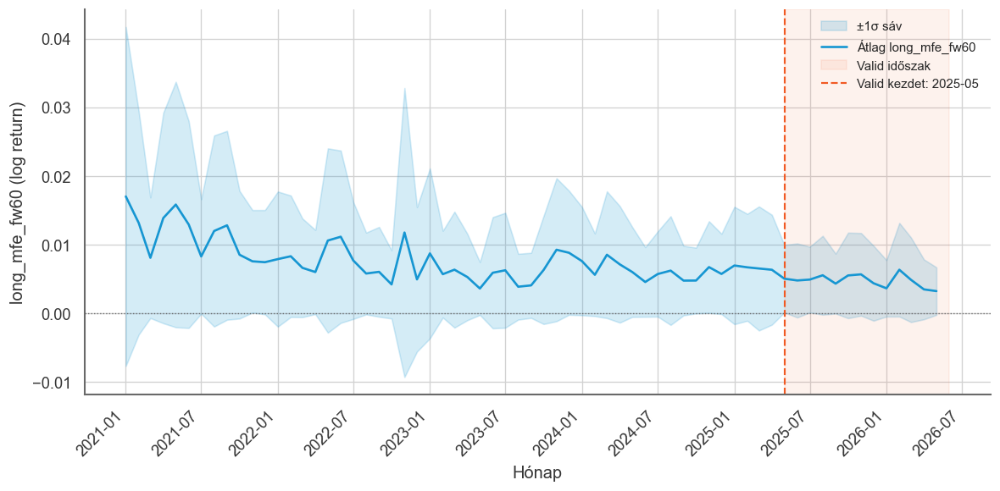

In [3]:
#| label: fig-monthly-target
#| fig-cap: "Havi átlagos long_mfe_fw60 és ±1σ szórássáv — train (kék) / valid (narancs terület)"
#| fig-alt: "Vonalas ábra, x: hónap (2021-01–2026-05), y: átlag long_mfe_fw60. Kék sáv = ±1σ. Narancs terület = valid időszak. Szaggatott vonal = train/valid határ."

df["month"] = df["open_time"].dt.to_period("M")
monthly = (
    df.groupby("month")
    .agg(avg_target=(TARGET, "mean"), std_target=(TARGET, "std"))
    .reset_index()
)
monthly["date"] = monthly["month"].dt.to_timestamp()
monthly["upper"] = monthly["avg_target"] + monthly["std_target"]
monthly["lower"] = monthly["avg_target"] - monthly["std_target"]

valid_start_month = VALID_START.replace(day=1)
plot_end = monthly["date"].max() + pd.DateOffset(months=1)

fig, ax = plt.subplots(figsize=(10, 5))

ax.fill_between(
    monthly["date"], monthly["lower"], monthly["upper"],
    alpha=0.18, color=CQ_COLORS["blue"], label="±1σ sáv"
)
ax.plot(
    monthly["date"], monthly["avg_target"],
    color=CQ_COLORS["blue"], linewidth=1.6, label="Átlag long_mfe_fw60"
)
ax.axvspan(
    valid_start_month, plot_end,
    alpha=0.08, color=CQ_COLORS["orange"], label="Valid időszak"
)
ax.axvline(
    valid_start_month, color=CQ_COLORS["orange"],
    linewidth=1.3, linestyle="--",
    label=f"Valid kezdet: {VALID_START.strftime('%Y-%m')}"
)
ax.axhline(0, color=CQ_COLORS["gray"], linewidth=0.8, linestyle=":")

ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 7]))
plt.xticks(rotation=45, ha="right")
ax.set_xlabel("Hónap")
ax.set_ylabel("long_mfe_fw60 (log return)")
ax.legend(loc="upper right", fontsize=9)
plt.tight_layout()
plt.show()

## 3. Target eloszlása (Train vs Valid)

**Mi ez.** A `long_mfe_fw60` eloszlásának összehasonlítása train és valid periódus között.

**Forrás.** `model."lgbm_solusdt_l_fw60_2101_2605__sample"`, `split` szegmens szerint szétválasztva.

**Módszer.** (a) KDE sűrűségbecslés: train és valid eloszlás egymáson; (b) boxplot: train és
valid egymás mellett — medián, IQR és outlier-ek vizualizálva.

**Értelmezés.** Az eloszlások hasonlósága jelzi, hogy a valid periódus reprezentatív-e
a train mintához képest. Jelentős eltolódás rezsimváltást vagy distribution shift-et jelez.

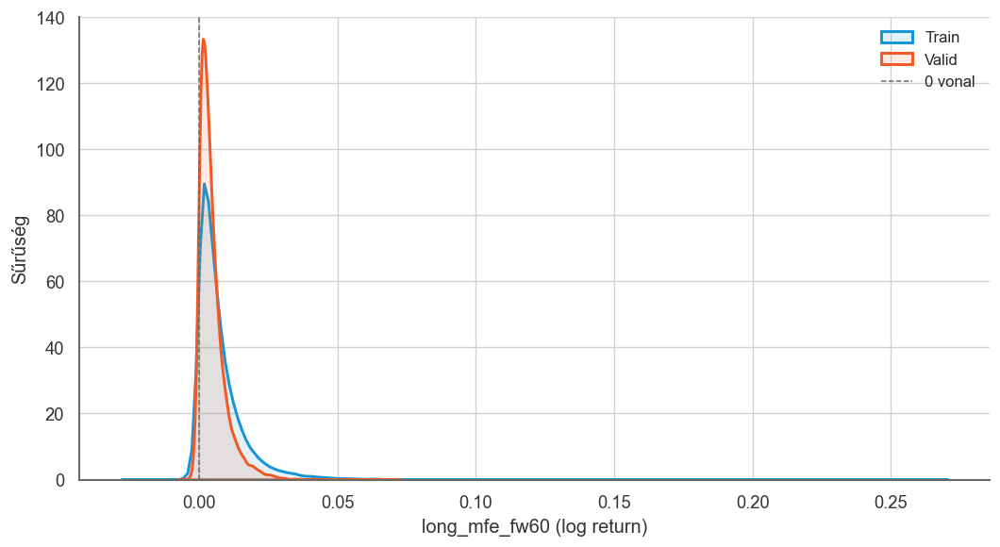

In [4]:
#| label: fig-distribution-kde
#| fig-cap: "long_mfe_fw60 eloszlása — Train (kék) és Valid (narancs) KDE egymáson"
#| fig-alt: "KDE sűrűségábra. Train eloszlás kék, valid narancs, egymáson ábrázolva. Szaggatott 0 vonal."

train_data = df[df["segment"] == "Train"][TARGET]
valid_data = df[df["segment"] == "Valid"][TARGET]

fig, ax = plt.subplots(figsize=(9, 5))
sns.kdeplot(
    train_data, ax=ax,
    color=CQ_COLORS["blue"], label="Train",
    linewidth=1.8, fill=True, alpha=0.12
)
sns.kdeplot(
    valid_data, ax=ax,
    color=CQ_COLORS["orange"], label="Valid",
    linewidth=1.8, fill=True, alpha=0.12
)
ax.axvline(0, color=CQ_COLORS["gray"], linewidth=0.9, linestyle="--", label="0 vonal")
ax.set_xlabel("long_mfe_fw60 (log return)")
ax.set_ylabel("Sűrűség")
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

C:\Users\eross\AppData\Local\Temp\ipykernel_2092\1595340954.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


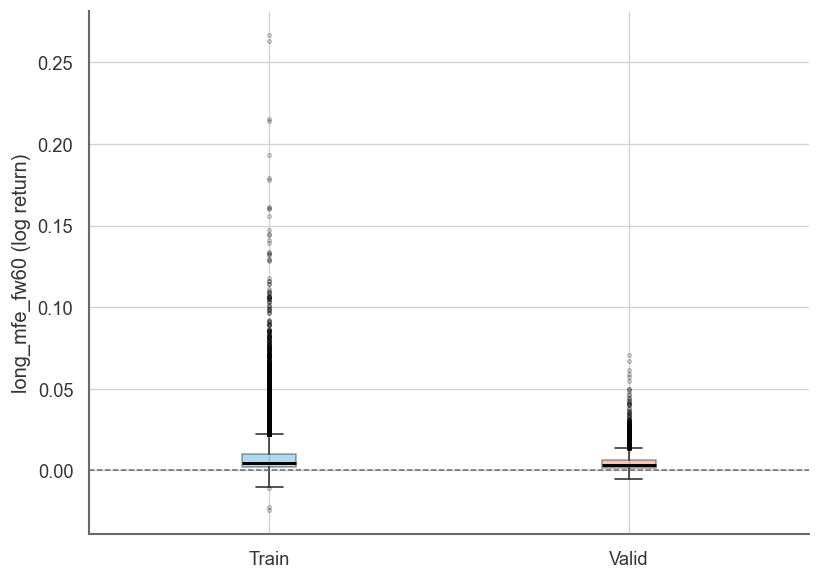

In [5]:
#| label: fig-distribution-boxplot
#| fig-cap: "long_mfe_fw60 boxplot — Train és Valid egymás mellett"
#| fig-alt: "Boxplot. Train (kék) és Valid (narancs) egymás mellett. Medián, IQR és outlier-ek jelölve."

segments = ["Train", "Valid"]
colors_bp = [CQ_COLORS["blue"], CQ_COLORS["orange"]]
data_by_seg = [train_data.values, valid_data.values]

fig, ax = plt.subplots(figsize=(7, 5))
bp = ax.boxplot(
    data_by_seg,
    labels=segments,
    patch_artist=True,
    medianprops=dict(color=CQ_COLORS["black"], linewidth=1.8),
    whiskerprops=dict(linewidth=1.0, color=CQ_COLORS["gray_dark"]),
    capprops=dict(linewidth=1.0, color=CQ_COLORS["gray_dark"]),
    flierprops=dict(marker="o", markersize=2, alpha=0.25, color=CQ_COLORS["gray"]),
    showfliers=True,
)
for patch, color in zip(bp["boxes"], colors_bp):
    patch.set_facecolor(color)
    patch.set_alpha(0.35)

ax.axhline(0, color=CQ_COLORS["gray"], linewidth=0.9, linestyle="--")
ax.set_ylabel("long_mfe_fw60 (log return)")
plt.tight_layout()
plt.show()

## Értelmezés

In [6]:
#| label: tbl-interp-metrics
#| tbl-cap: "Összehasonlító metrikák — Train vs Valid"

rows = []
for seg, data in [("Train", train_data), ("Valid", valid_data)]:
    rows.append({
        "Szegmens": seg,
        "Medián": data.median(),
        "Átlag": data.mean(),
        "Szórás (σ)": data.std(),
        "IQR": data.quantile(0.75) - data.quantile(0.25),
        "Pozitív arány": (data > 0).mean(),
    })
interp_df = pd.DataFrame(rows)
display_analysis_table(interp_df)

Szegmens,Medián,Átlag,Szórás (σ),IQR,Pozitív arány
Train,0.005,0.008,0.011,0.008,0.925
Valid,0.003,0.005,0.005,0.005,0.930


## 4. Top10 decilis havi bontásban — Train és Valid

**Struktúra.** Train és Valid hónapjai egyetlen táblában, éves összesítő sorokkal. A top10
küszöböt szegmensenkéből külön számoljuk: **P90 (train)** és **P90 (valid)** — az egyes szegmensek
belső rangsorán alapul, így nem torzít a két periódus eltérő volatilitásszintje.

**Tábla.** Szegmens / Időszak / N sample / N top10 / Top10 avg target / Top10 / hét / Top10 / nap —
az éves összesítő sorok dőlten szedve. A P90 értékek és a teljes szegmens-átlagok külön összehasonlító
táblában jelennek meg.

**Ábra.** Havi "top10 / nap" trend — Train (kék) és Valid (narancs) külön sorozatként, az éves
összesítőkből számítva, az eredeti havi felbontással. Narancs terület jelöli a valid periódust.

In [7]:
#| label: tbl-top10-summary
#| tbl-cap: "Top10 decilis összehasonlítás — Train vs Valid (szegmensenkénti P90)"

train_df = df[df["segment"] == "Train"][["open_time", TARGET]].copy()
valid_df = df[df["segment"] == "Valid"][["open_time", TARGET]].copy()

p90_train = np.percentile(train_df[TARGET].dropna(), 90)
p90_valid = np.percentile(valid_df[TARGET].dropna(), 90)

t10_train_avg = train_df[train_df[TARGET] >= p90_train][TARGET].mean()
t10_valid_avg = valid_df[valid_df[TARGET] >= p90_valid][TARGET].mean()
global_avg    = valid_df[TARGET].mean()

# P90 + top10 avg referenciatábla
ref_df = pd.DataFrame([
    {"Metrika": "P90 küszöb (szegmensenkénti)",        "Train": f"{p90_train:.5f}", "Valid": f"{p90_valid:.5f}"},
    {"Metrika": "Top10 avg target",                     "Train": f"{t10_train_avg:.5f}", "Valid": f"{t10_valid_avg:.5f}"},
    {"Metrika": "Teljes szegmens avg target",           "Train": f"{train_df[TARGET].mean():.5f}", "Valid": f"{valid_df[TARGET].mean():.5f}"},
    {"Metrika": "Lift (top10_avg / segment_avg)",       "Train": f"{t10_train_avg / train_df[TARGET].mean():.3f}x", "Valid": f"{t10_valid_avg / valid_df[TARGET].mean():.3f}x"},
])
display_analysis_table(ref_df)

# Heti grid a teljes adatperióduson
all_start = df["open_time"].min().normalize()
all_end   = df["open_time"].max().normalize() + pd.Timedelta(days=1)
week_starts_all = pd.date_range(start=all_start, end=all_end, freq="7D")

# Havi + éves aggregátum build
monthly_rows = []
for seg_label, seg_df, p90 in [("Train", train_df, p90_train), ("Valid", valid_df, p90_valid)]:
    sd = seg_df.copy()
    sd["top10"] = sd[TARGET] >= p90
    sd["ym"]    = sd["open_time"].dt.to_period("M")
    sd["year"]  = sd["open_time"].dt.year

    for year, ydf in sd.groupby("year"):
        for ym, mdf in ydf.groupby("ym"):
            n_s = len(mdf)
            n_t = int(mdf["top10"].sum())
            n_d = ym.days_in_month
            n_w = sum(1 for ws in week_starts_all if ws.strftime("%Y-%m") == str(ym))
            t_avg = mdf[mdf["top10"]][TARGET].mean() if n_t else np.nan
            monthly_rows.append({
                "_order": 0,
                "Szegmens": seg_label,
                "Időszak":  str(ym),
                "N sample": n_s,
                "N top10":  n_t,
                "Top10 avg target": round(t_avg, 5) if not np.isnan(t_avg) else None,
                "Top10 / hét":      round(n_t / n_w, 1) if n_w else None,
                "Top10 / nap":      round(n_t / n_d, 2),
            })

        # Éves összesítő
        n_sy = len(ydf); n_ty = int(ydf["top10"].sum())
        n_dy = (ydf["open_time"].dt.date.max() - ydf["open_time"].dt.date.min()).days + 1
        t_avg_y = ydf[ydf["top10"]][TARGET].mean() if n_ty else np.nan
        monthly_rows.append({
            "_order": 1,
            "Szegmens": f"{seg_label} {year} ▶",
            "Időszak":  f"{year} összesen",
            "N sample": n_sy,
            "N top10":  n_ty,
            "Top10 avg target": round(t_avg_y, 5) if not np.isnan(t_avg_y) else None,
            "Top10 / hét":      None,
            "Top10 / nap":      round(n_ty / n_dy, 2),
        })

combined_df = pd.DataFrame(monthly_rows).drop(columns=["_order"])
display_analysis_table(combined_df)

Metrika,Train,Valid
P90 küszöb (szegmensenkénti),0.01766,0.01074
Top10 avg target,0.03079,0.01694
Teljes szegmens avg target,0.00771,0.00471
Lift (top10_avg / segment_avg),3.993x,3.593x


Szegmens,Időszak,N sample,N top10,Top10 avg target,Top10 / hét,Top10 / nap
Train,2021-01,740,215,0.042,43.000,6.940
Train,2021-02,672,165,0.035,41.200,5.890
Train,2021-03,744,81,0.028,20.200,2.610
Train,2021-04,720,191,0.033,38.200,6.370
Train,2021-05,744,219,0.037,54.800,7.060
Train,2021-06,720,177,0.032,44.200,5.900
Train,2021-07,744,84,0.026,16.800,2.710
Train,2021-08,744,151,0.032,37.800,4.870
Train,2021-09,720,166,0.032,41.500,5.530
Train,2021-10,744,94,0.028,18.800,3.030


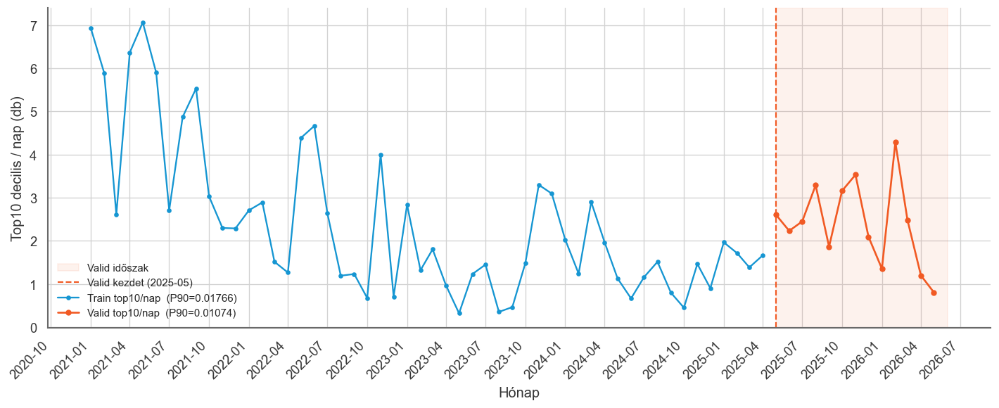

In [8]:
#| label: fig-top10-monthly-trend
#| fig-cap: "Havi átlagos top10 decilis / nap — Train (kék) és Valid (narancs), szegmensenkénti P90"
#| fig-height: 5

# Havi plot adatok (a tábla cellából: p90_train, p90_valid, train_df, valid_df már definiált)
plot_rows = []
for seg_label, seg_df, p90 in [("Train", train_df, p90_train), ("Valid", valid_df, p90_valid)]:
    sd = seg_df.copy()
    sd["top10"] = sd[TARGET] >= p90
    sd["ym"]    = sd["open_time"].dt.to_period("M")
    for ym, mdf in sd.groupby("ym"):
        n_t = int(mdf["top10"].sum())
        plot_rows.append({
            "segment":      seg_label,
            "date":         ym.to_timestamp(),
            "top10_per_day": n_t / ym.days_in_month,
        })

plot_df      = pd.DataFrame(plot_rows)
train_plot   = plot_df[plot_df["segment"] == "Train"]
valid_plot   = plot_df[plot_df["segment"] == "Valid"]

valid_start_dt = valid_df["open_time"].min().replace(day=1)
plot_end_dt    = valid_df["open_time"].max().replace(day=1) + pd.DateOffset(months=1)

fig, ax = plt.subplots(figsize=(12, 5))

ax.axvspan(valid_start_dt, plot_end_dt,
           alpha=0.08, color=CQ_COLORS["orange"], label="Valid időszak")
ax.axvline(valid_start_dt, color=CQ_COLORS["orange"], linewidth=1.3, linestyle="--",
           label=f"Valid kezdet ({valid_start_dt.strftime('%Y-%m')})")

ax.plot(train_plot["date"], train_plot["top10_per_day"],
        color=CQ_COLORS["blue"], linewidth=1.4, marker="o", markersize=3,
        label=f"Train top10/nap  (P90={p90_train:.5f})")
ax.plot(valid_plot["date"], valid_plot["top10_per_day"],
        color=CQ_COLORS["orange"], linewidth=1.6, marker="o", markersize=4,
        label=f"Valid top10/nap  (P90={p90_valid:.5f})")

ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 4, 7, 10]))
plt.xticks(rotation=45, ha="right")
ax.set_xlabel("Hónap")
ax.set_ylabel("Top10 decilis / nap (db)")
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

## 5. Top 10 lift ábrák — Train és Valid

Vizuális áttekintés arról, hogy **mikor és milyen close árfolyam mellett** jelennek meg a top 10%
decilisbe eső target (`long_mfe_fw60`) megfigyelések. A piros szaggatott függőleges vonalak
mindkét panelen jelzik a top decilis x-pozícióit.

- **Train:** éves alfejezetek, minden évben havi tabset (1 fül = 1 naptári hónap). P90 küszöb:
  a teljes train halmaz 90. percentilise.
- **Valid:** havi alfejezetek, minden hónapban heti tabset (1 fül = 7 nap). P90 küszöb:
  a teljes valid halmaz 90. percentilise.

### Train — éves bontás, havi tabset


#### 2021

::: {.panel-tabset}

## Jan



C:\Users\eross\AppData\Local\Temp\ipykernel_2092\2142883767.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()




## Feb


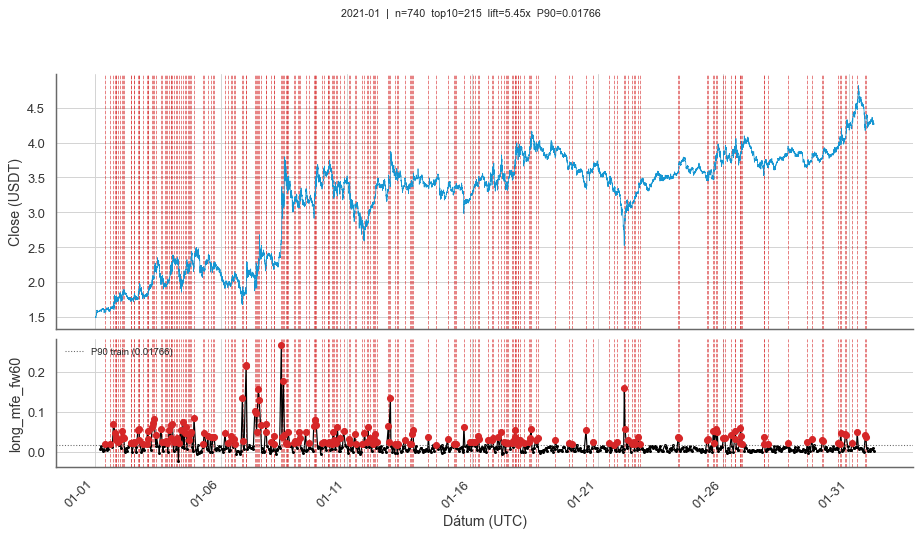



## Mar


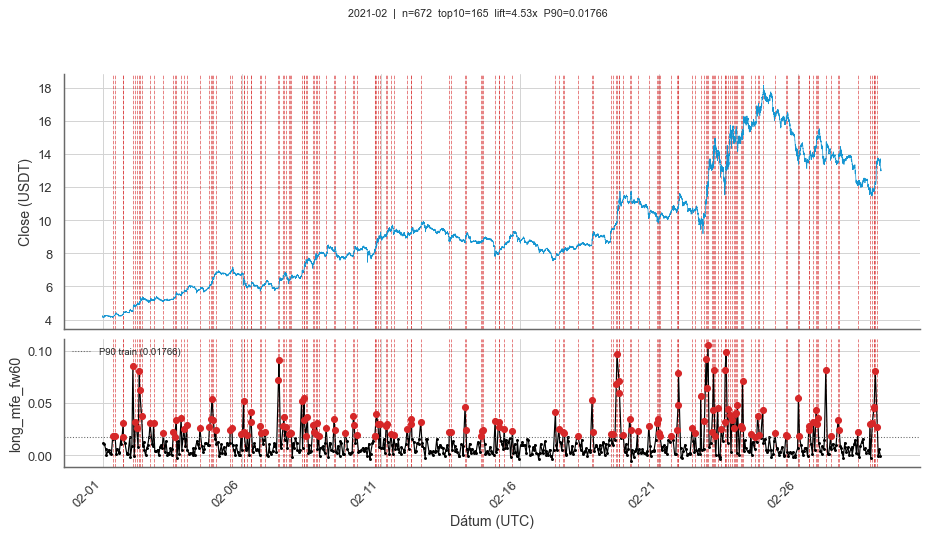



## Apr


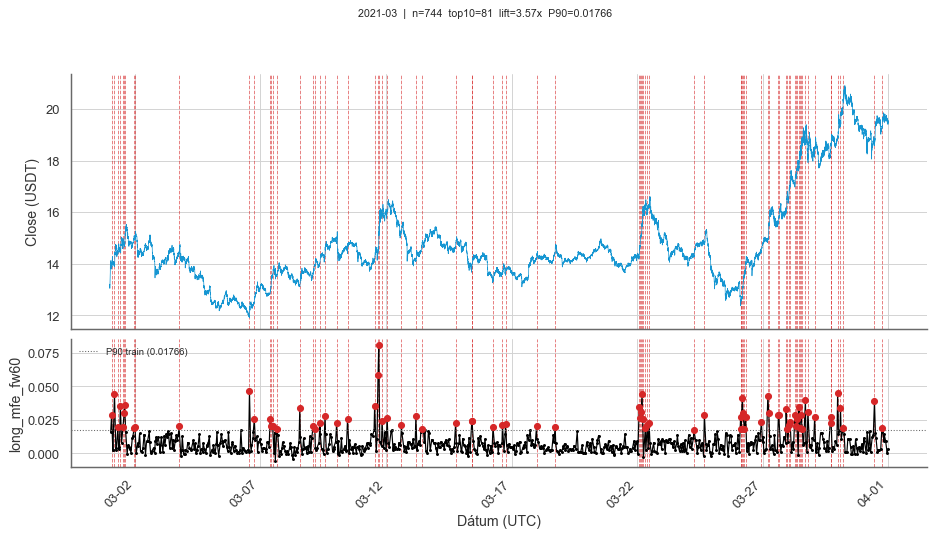



## May


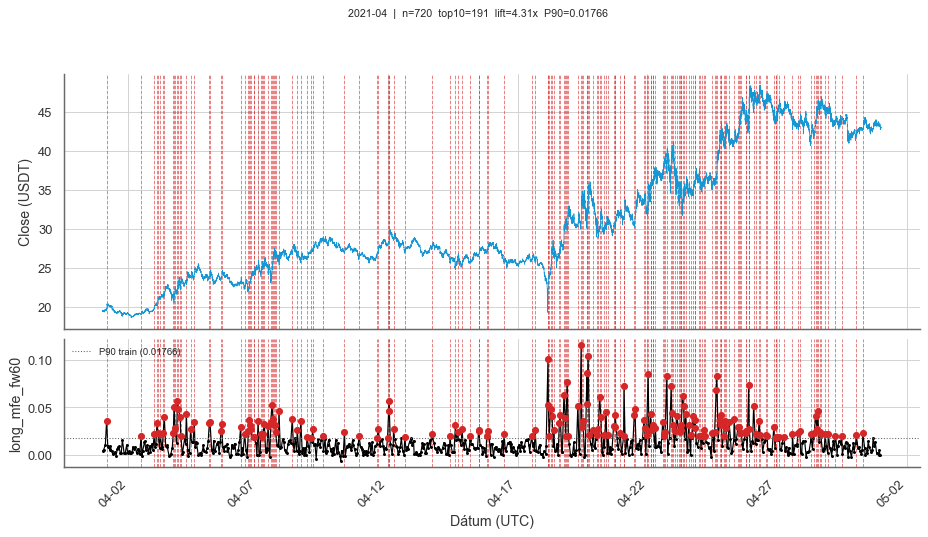



## Jun


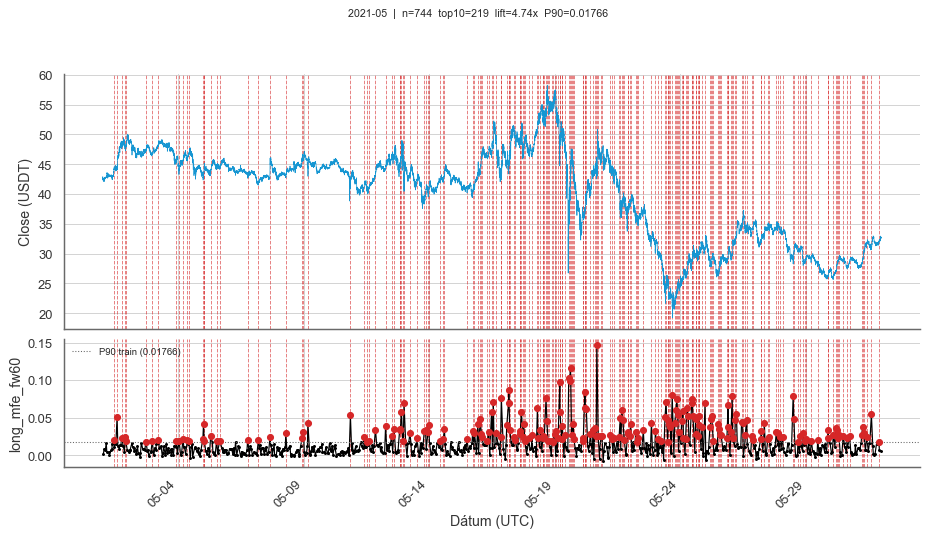



## Jul


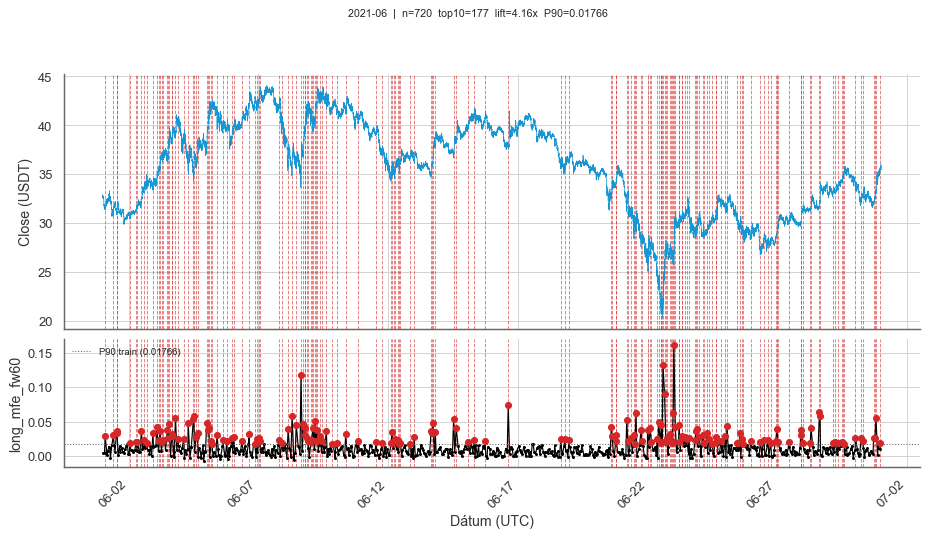



## Aug


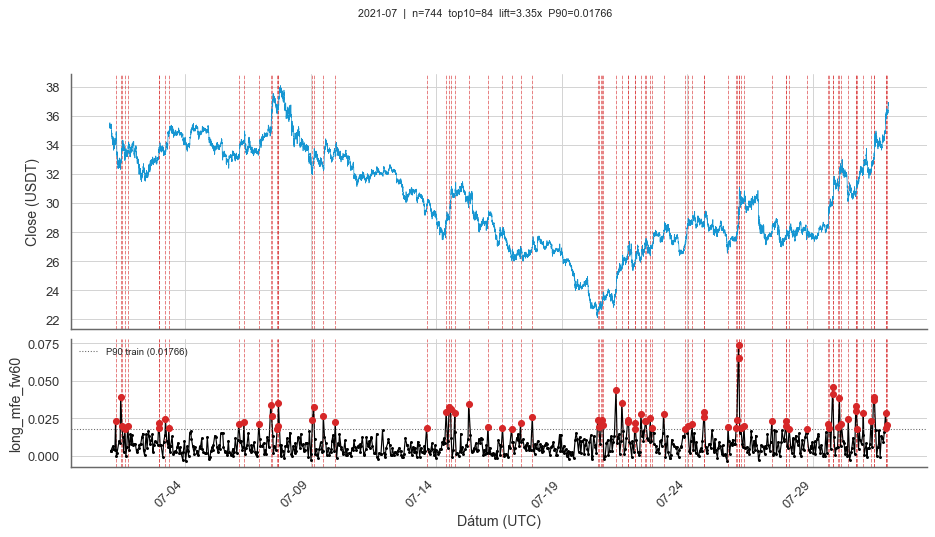



## Sep


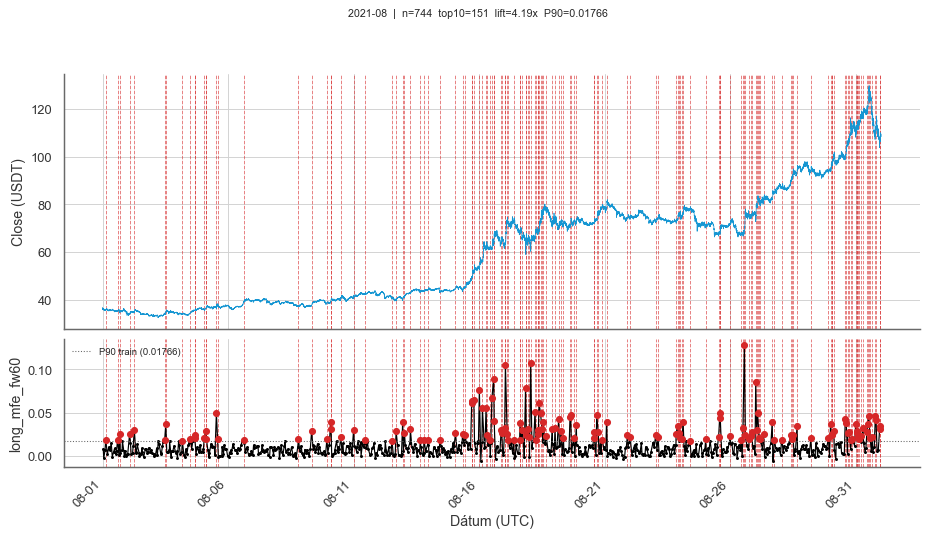



## Oct


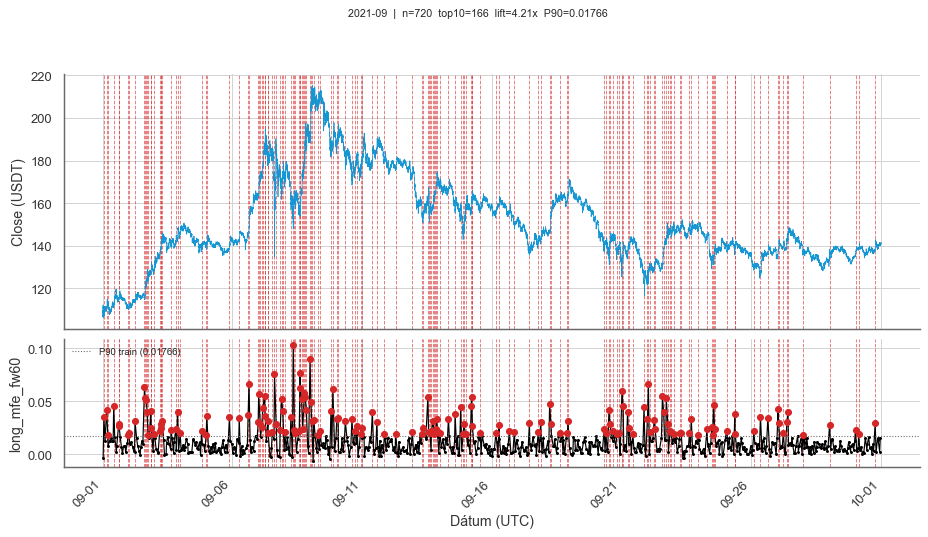



## Nov


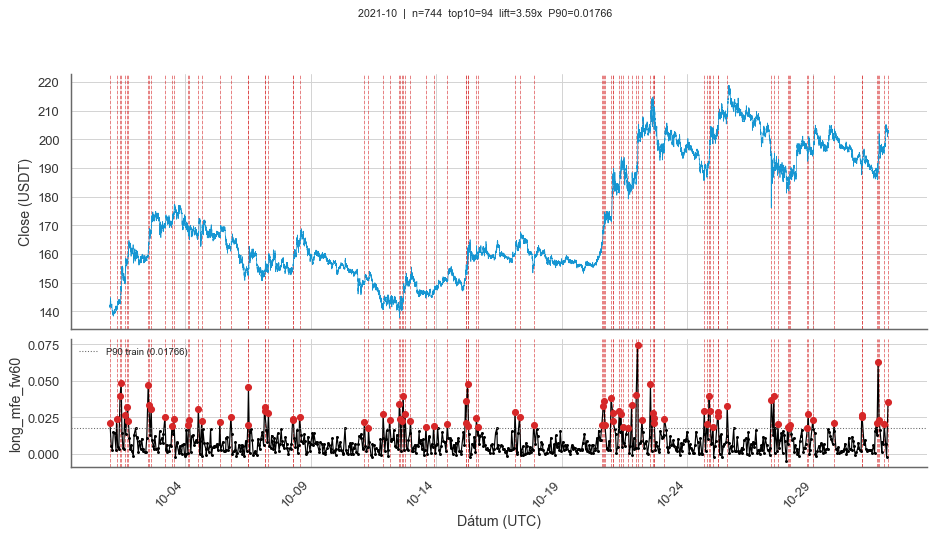



## Dec


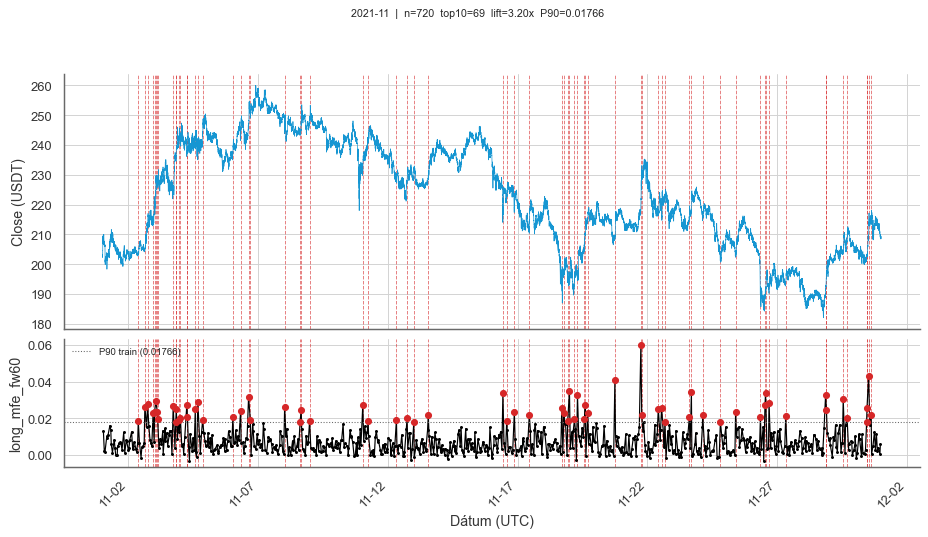



:::


#### 2022

::: {.panel-tabset}

## Jan


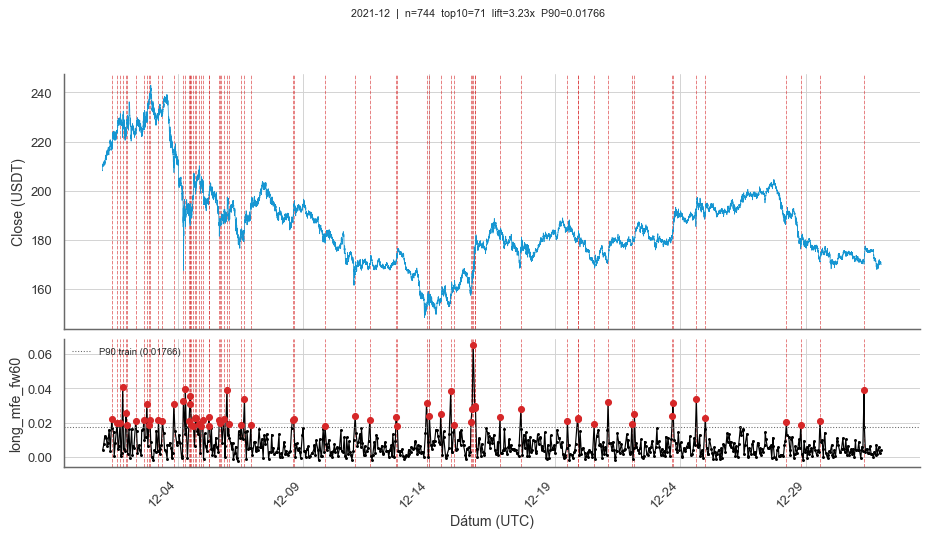



## Feb


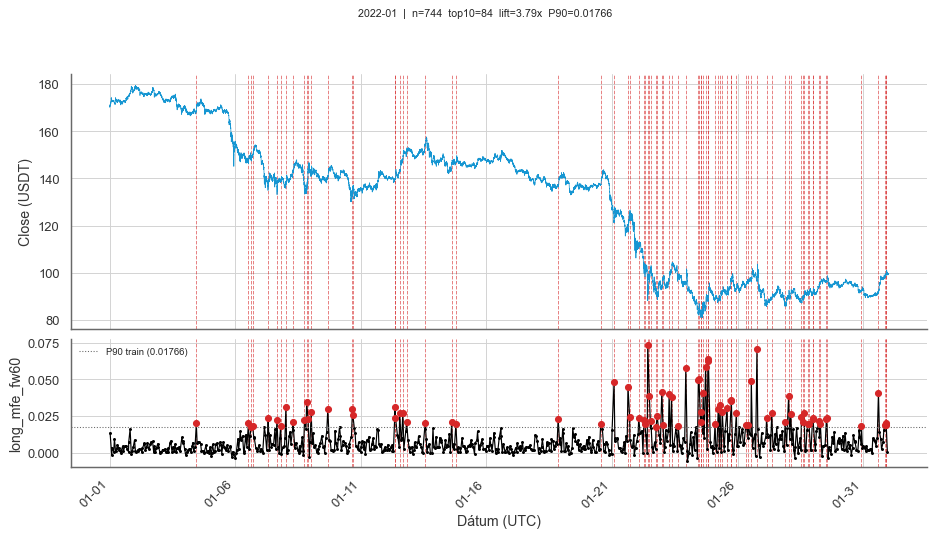



## Mar


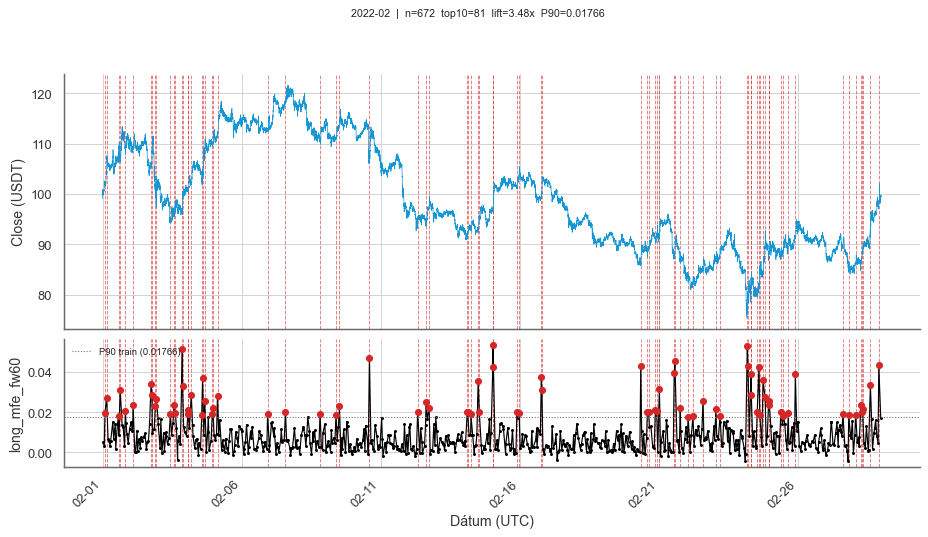



## Apr


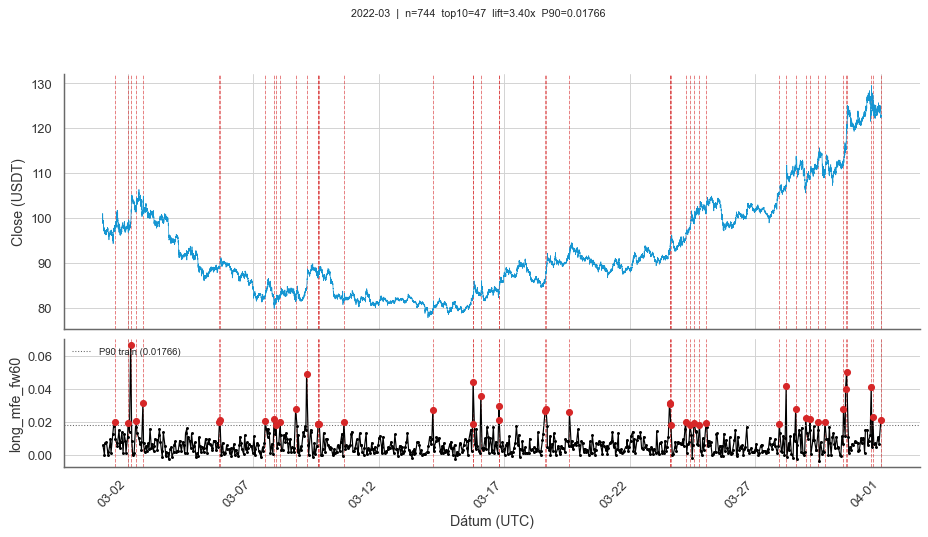



## May


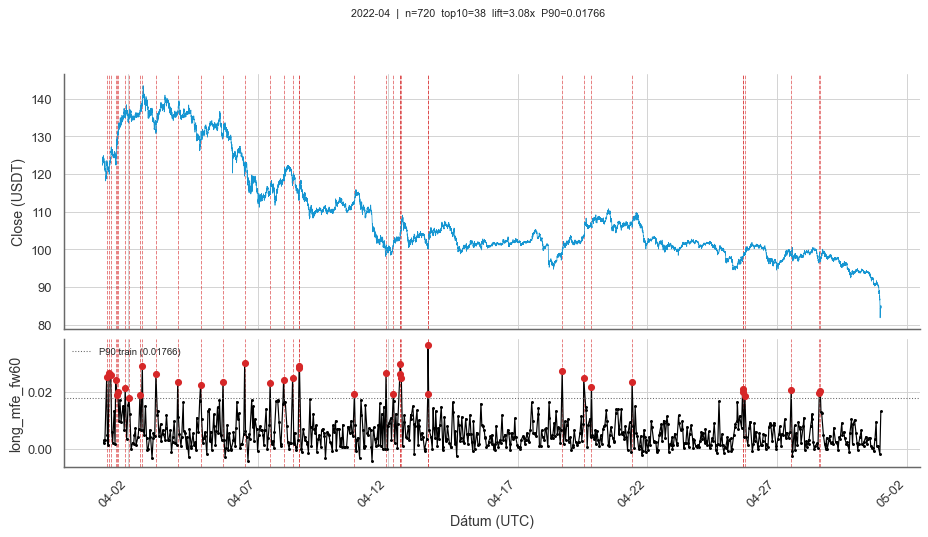



## Jun


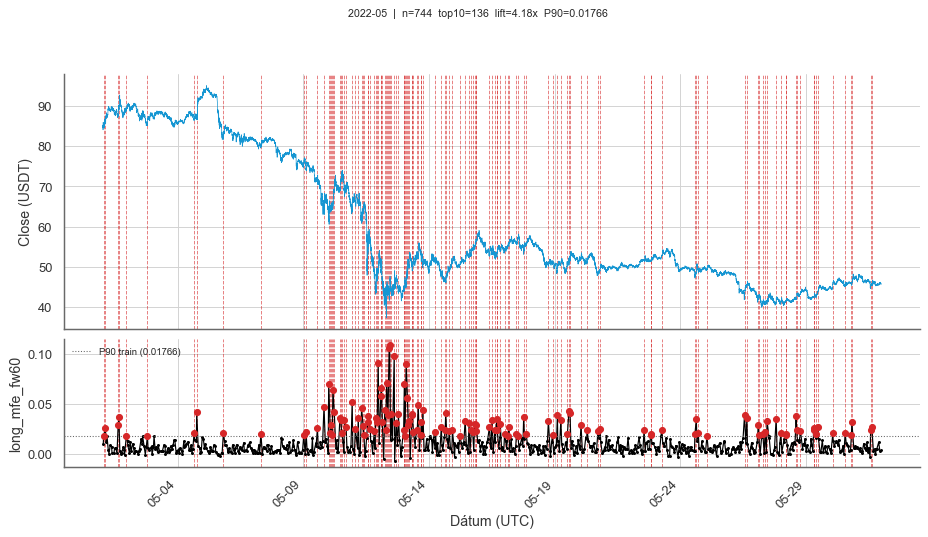



## Jul


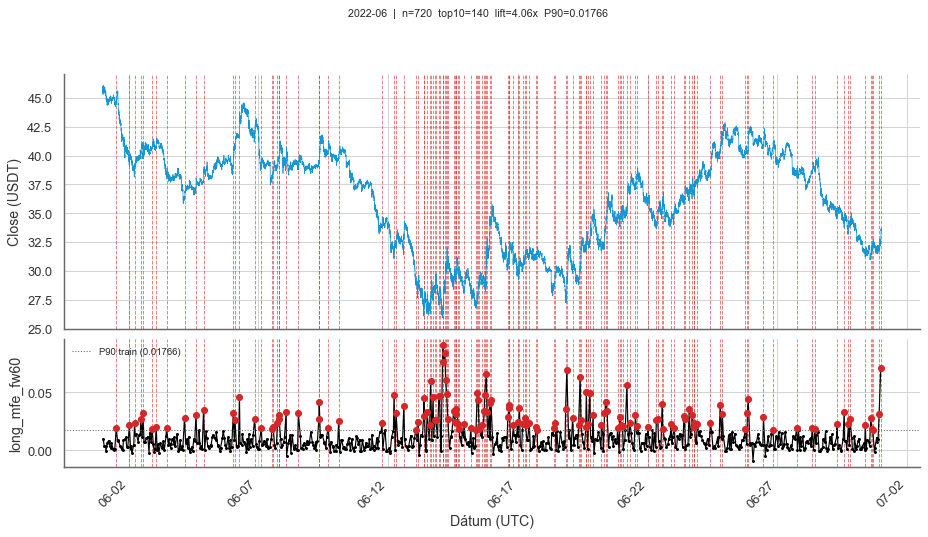



## Aug


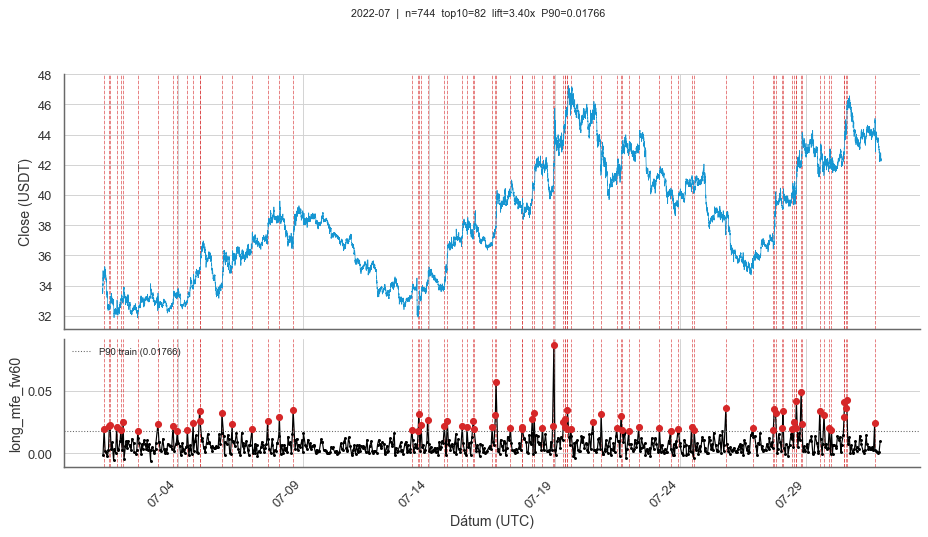



## Sep


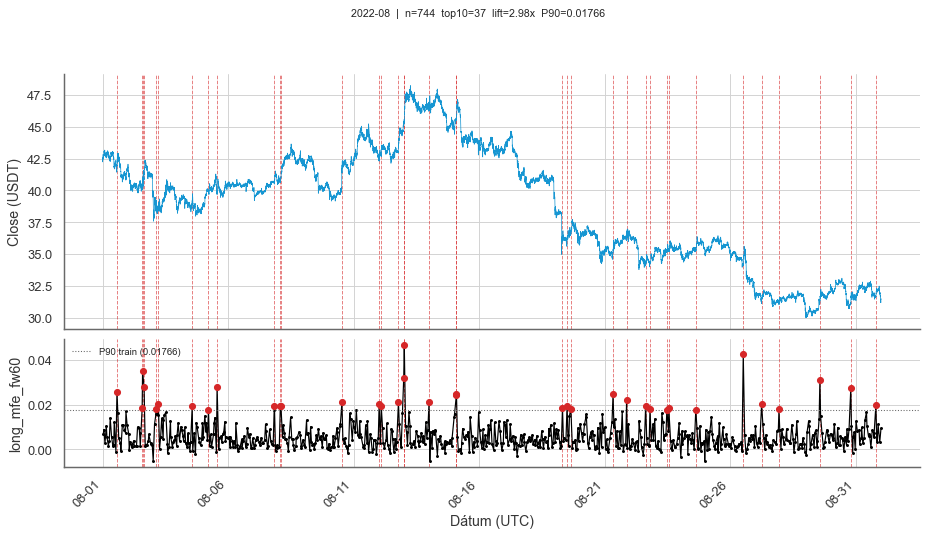



## Oct


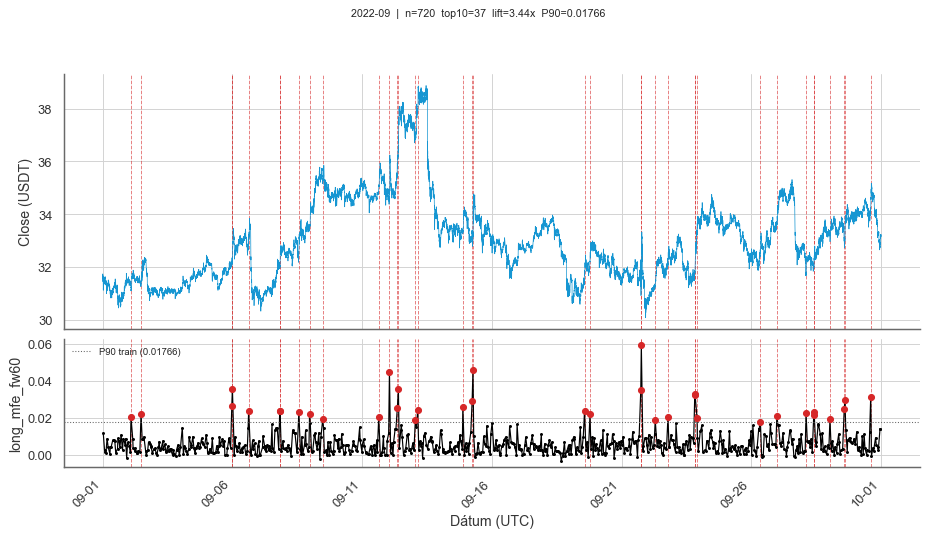



## Nov


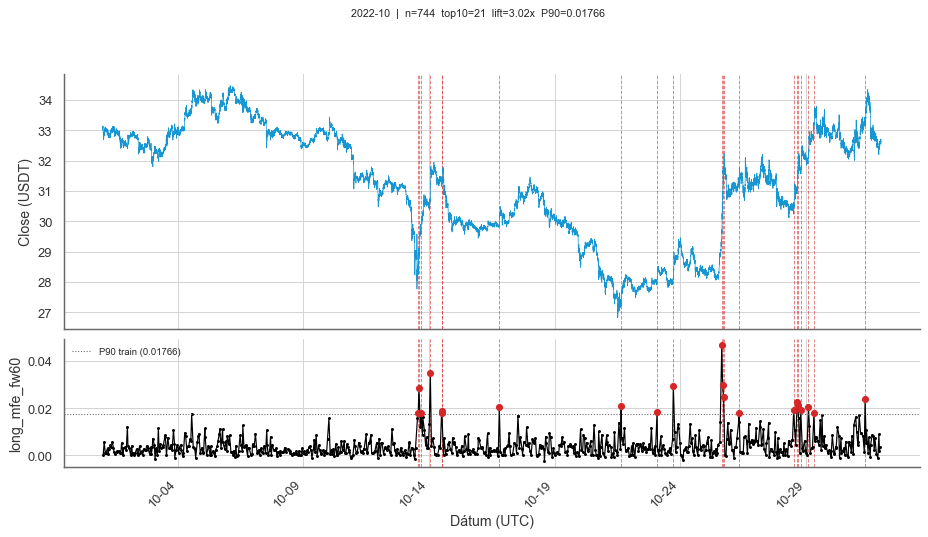



## Dec


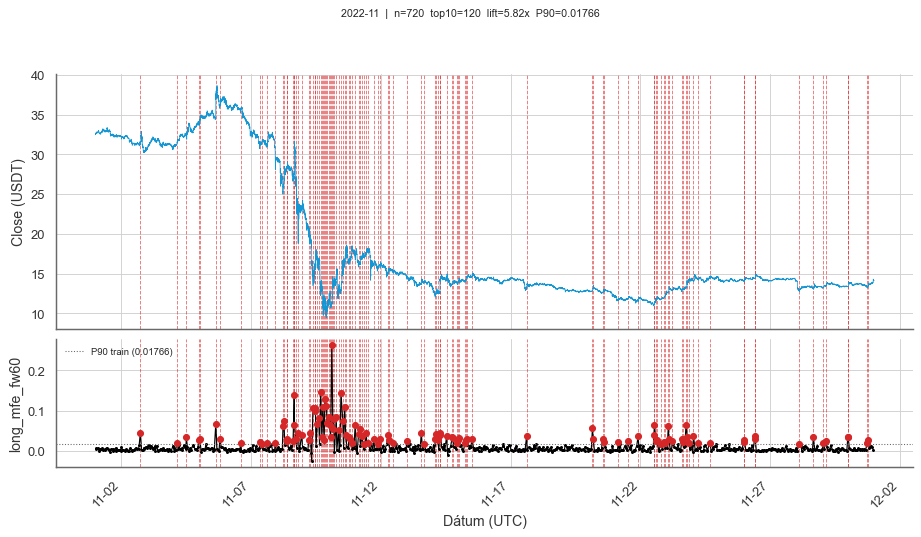



:::


#### 2023

::: {.panel-tabset}

## Jan


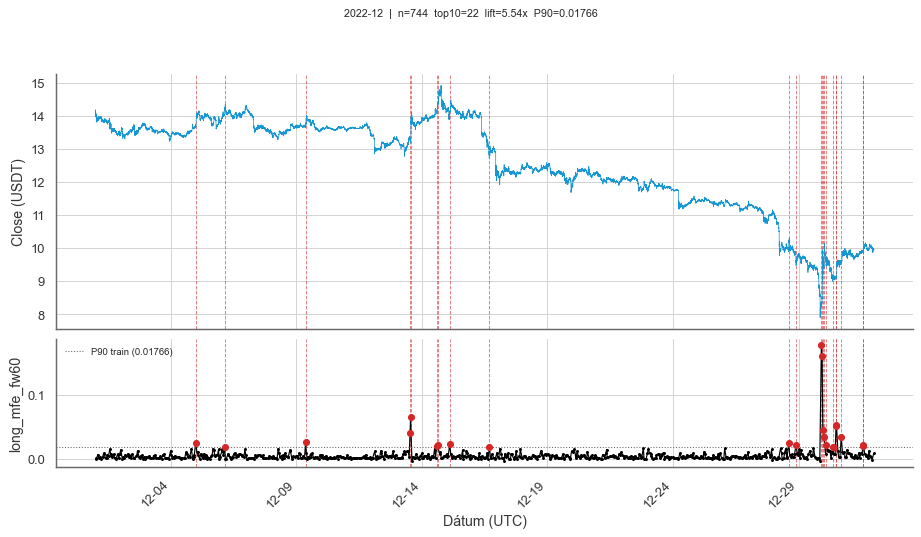



## Feb


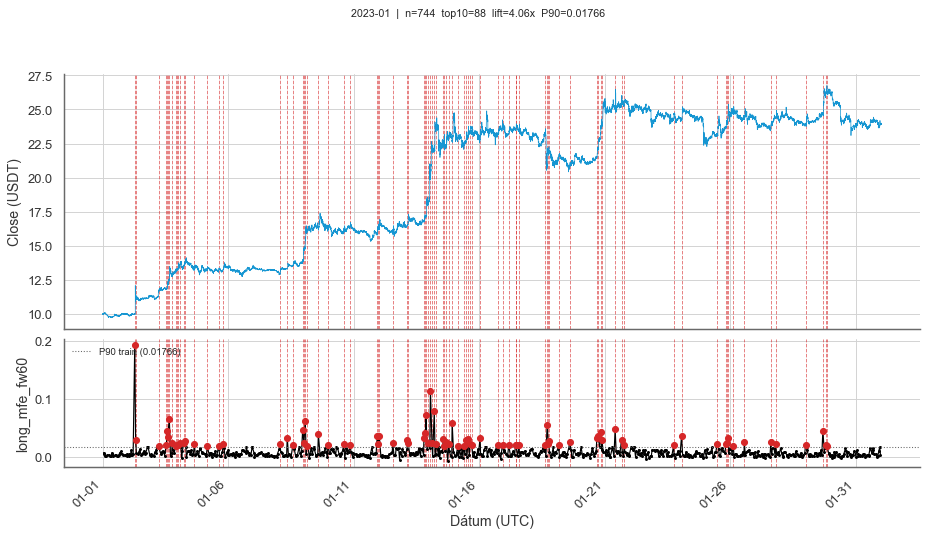



## Mar


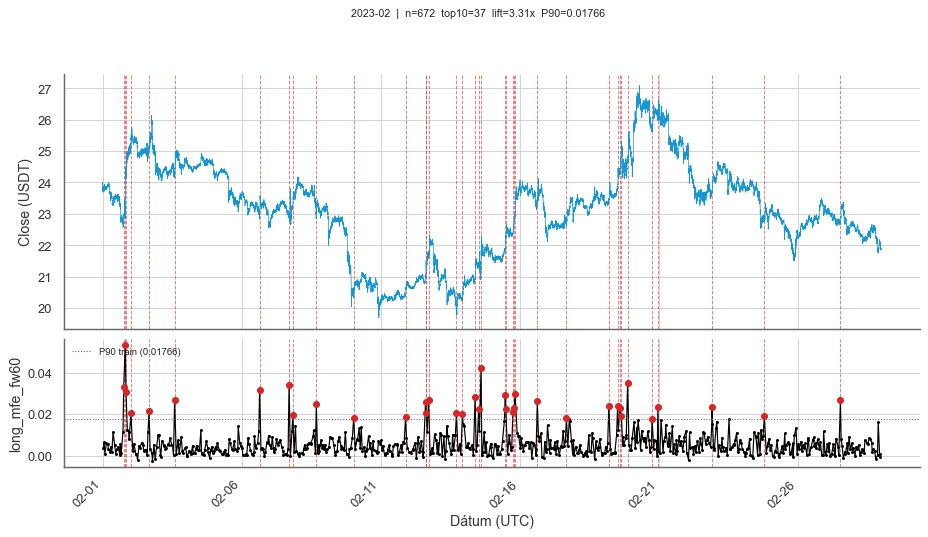



## Apr


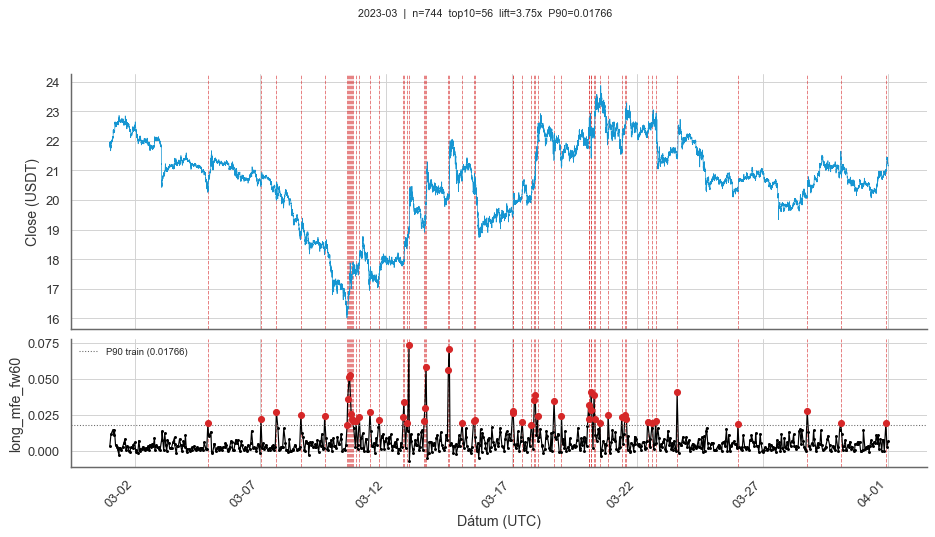



## May


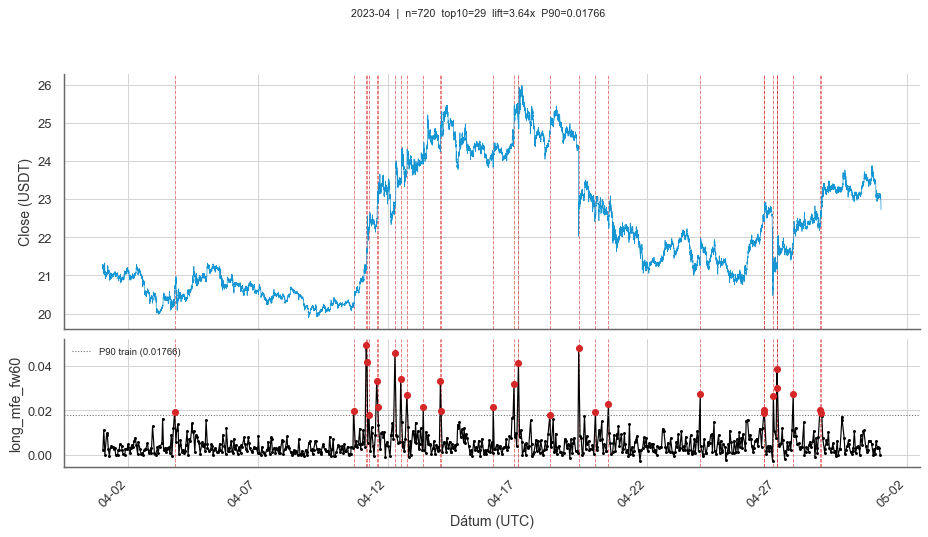



## Jun


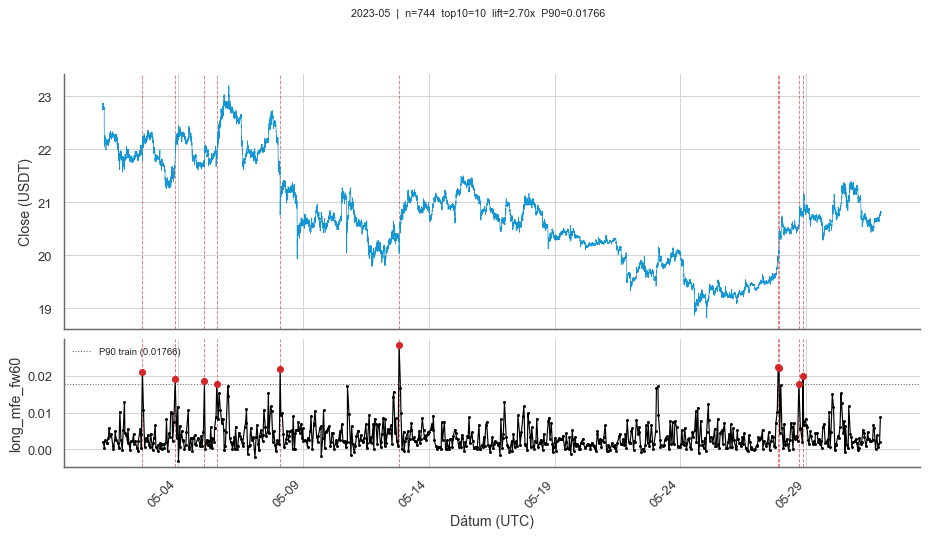



## Jul


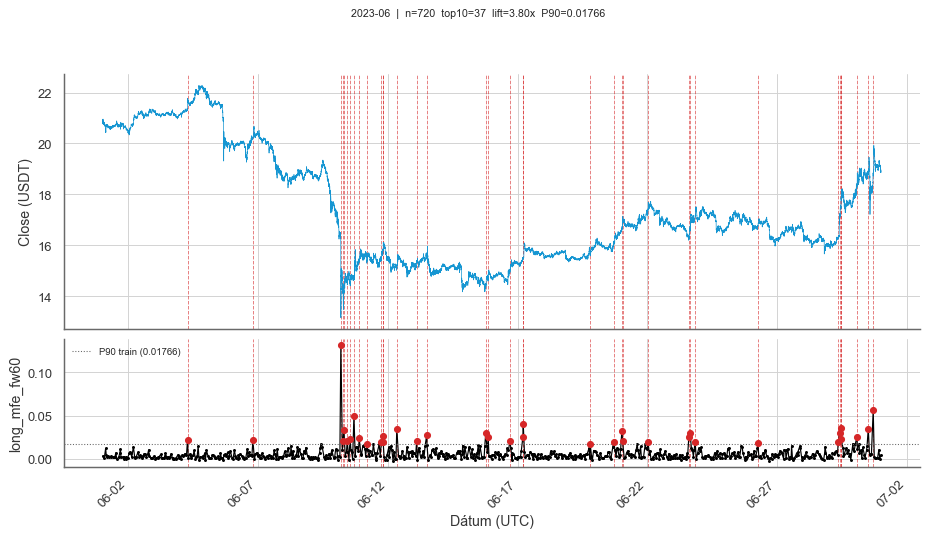



## Aug


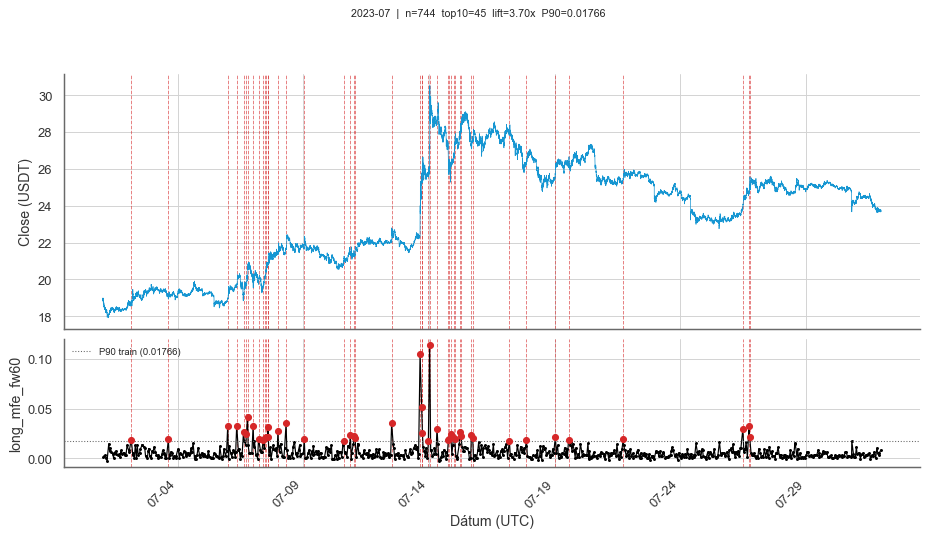



## Sep


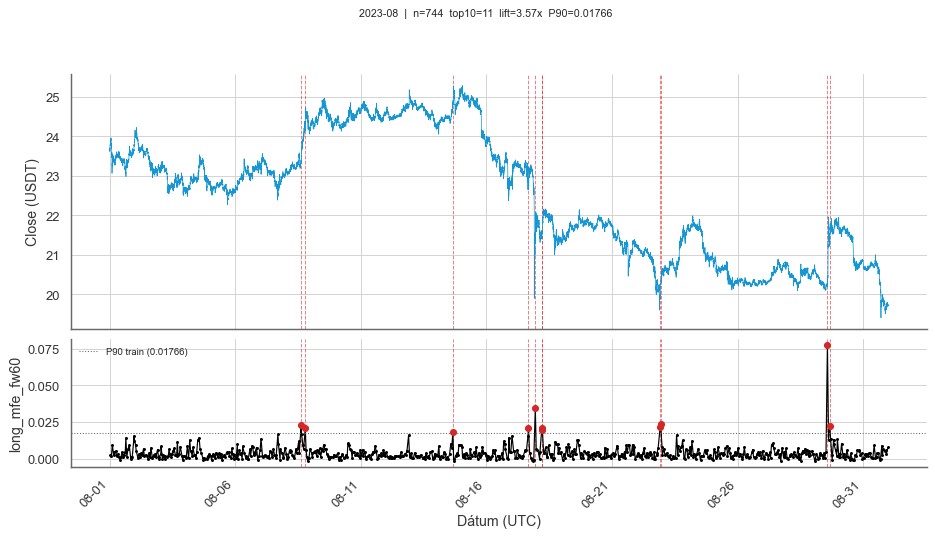



## Oct


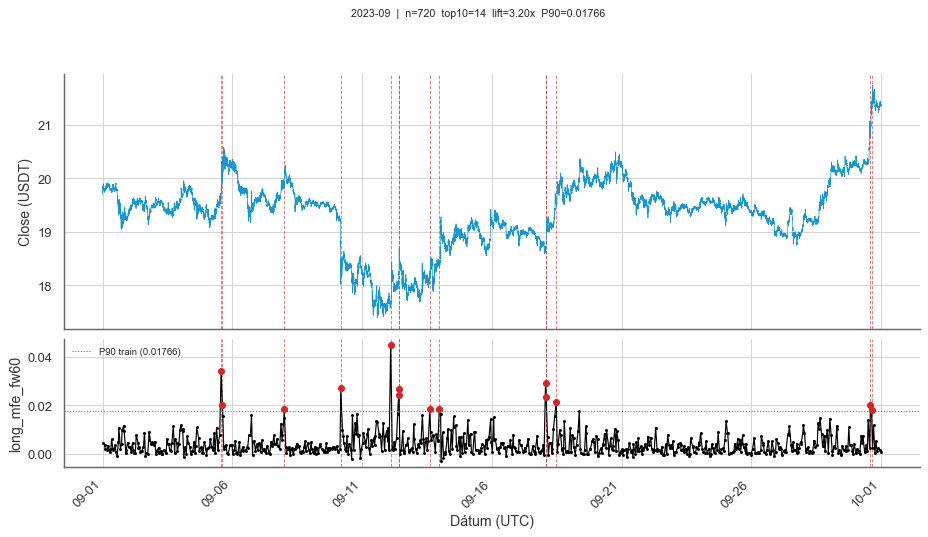



## Nov


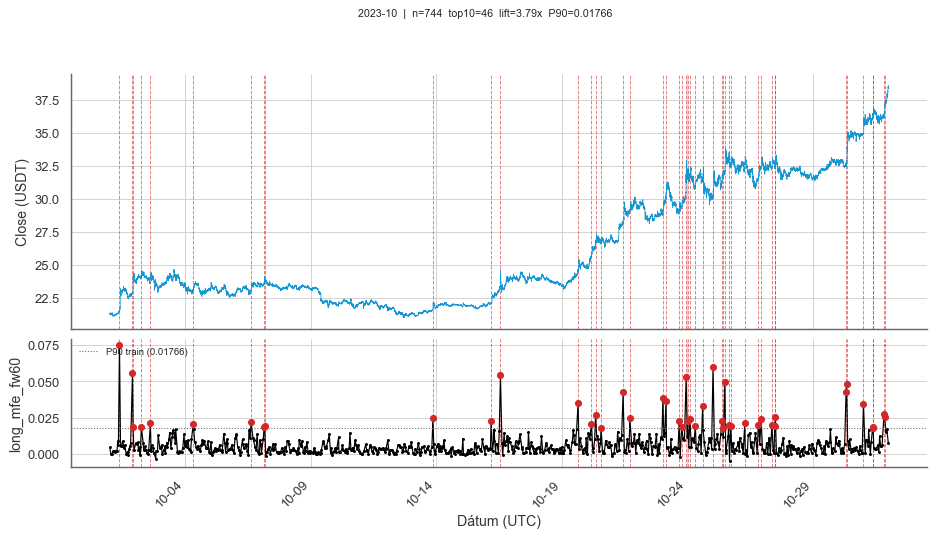



## Dec


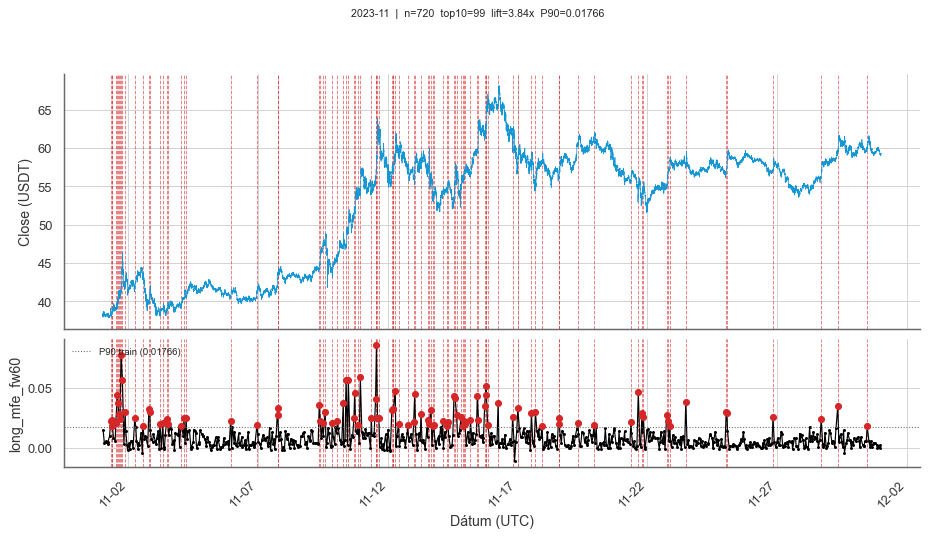



:::


#### 2024

::: {.panel-tabset}

## Jan


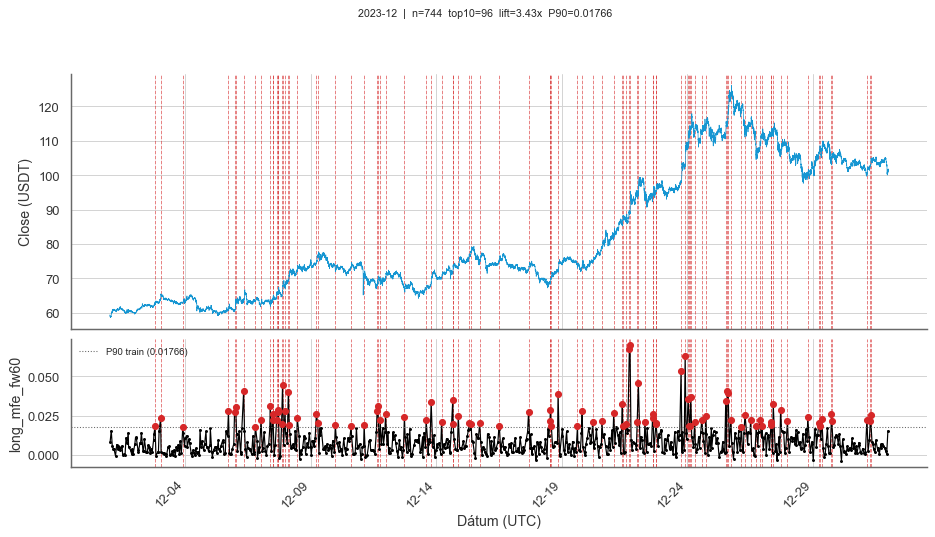



## Feb


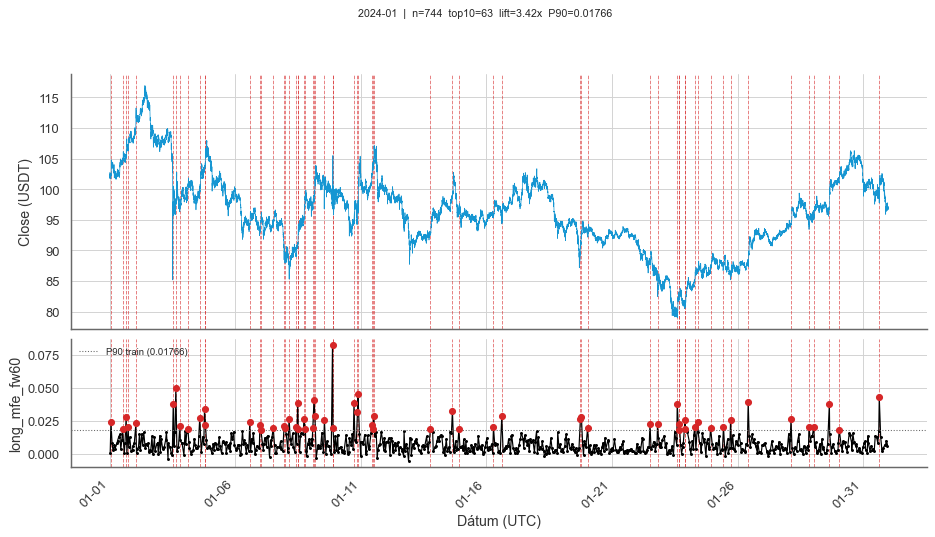



## Mar


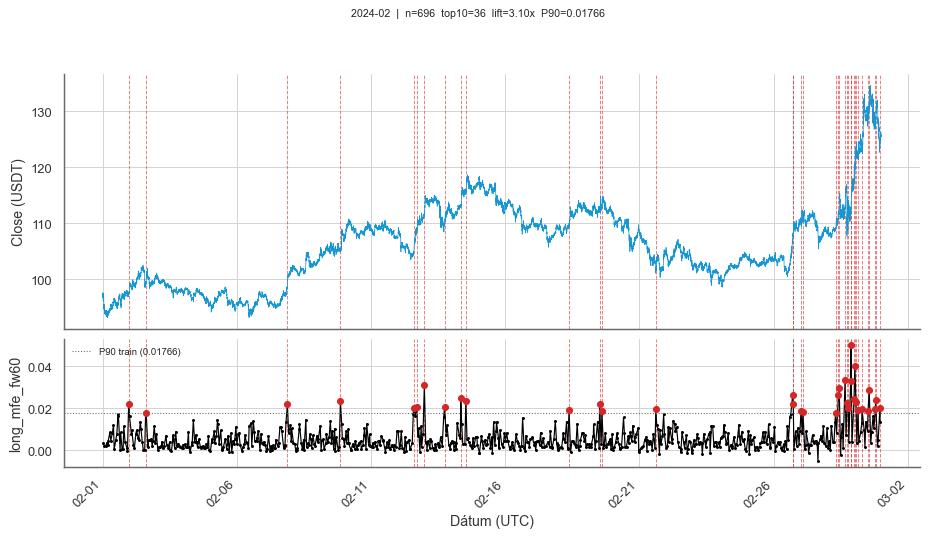



## Apr


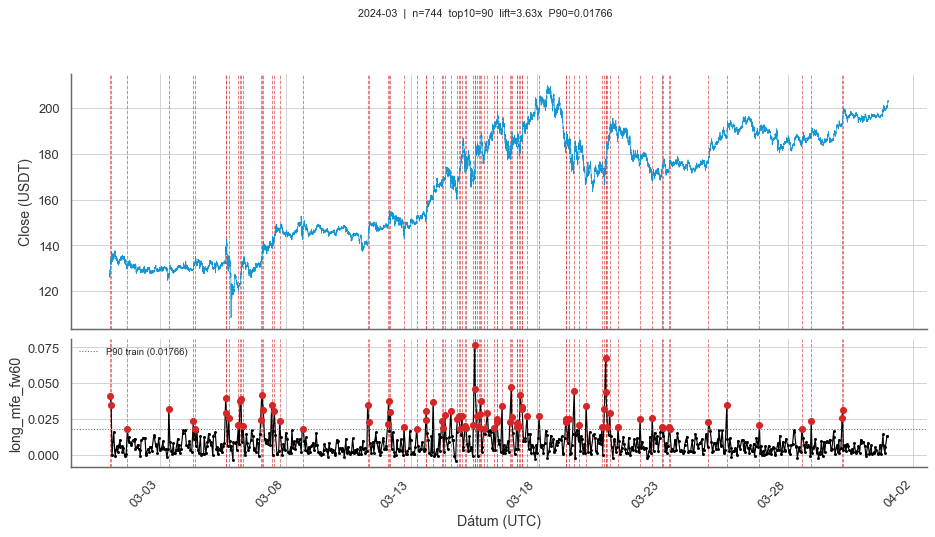



## May


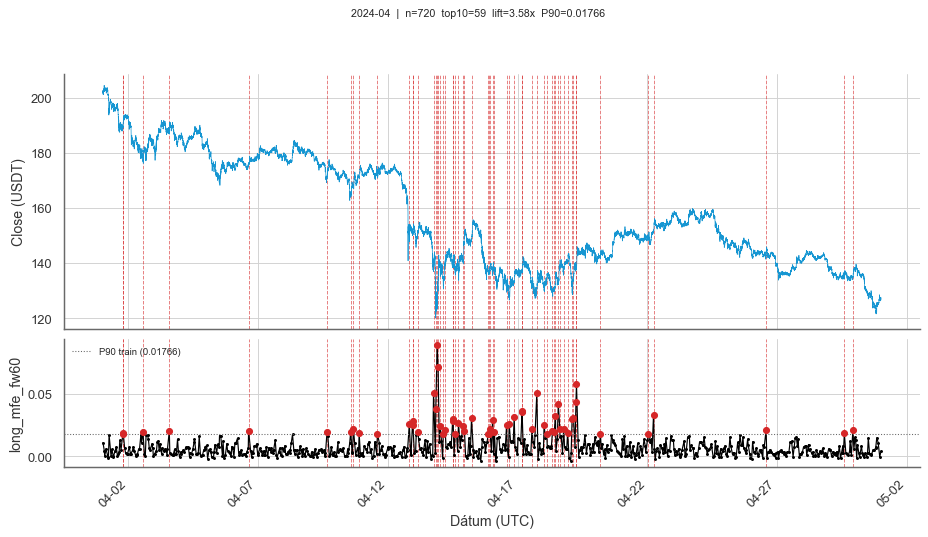



## Jun


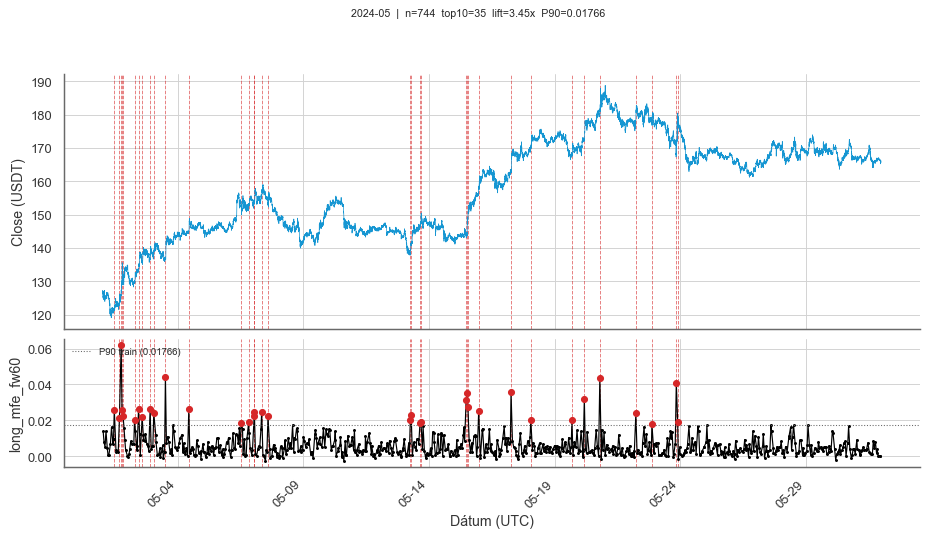



## Jul


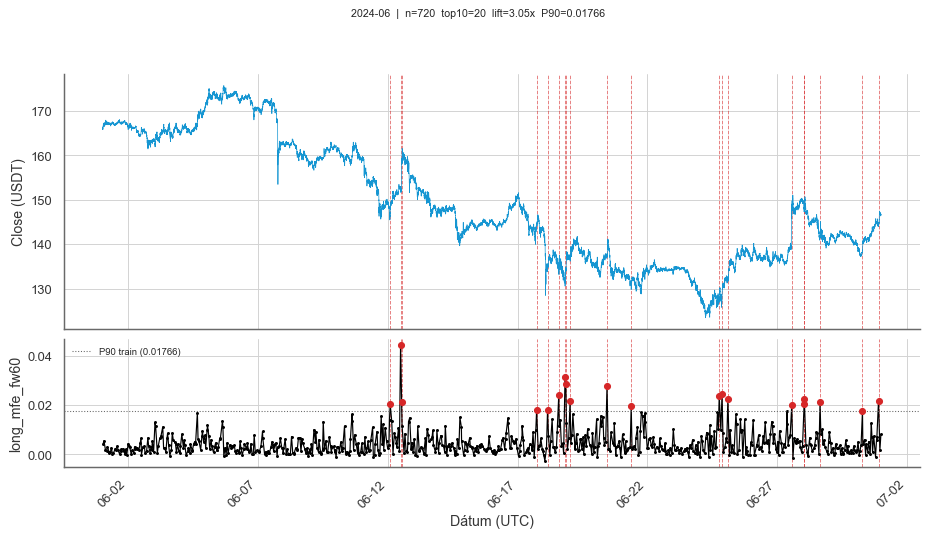



## Aug


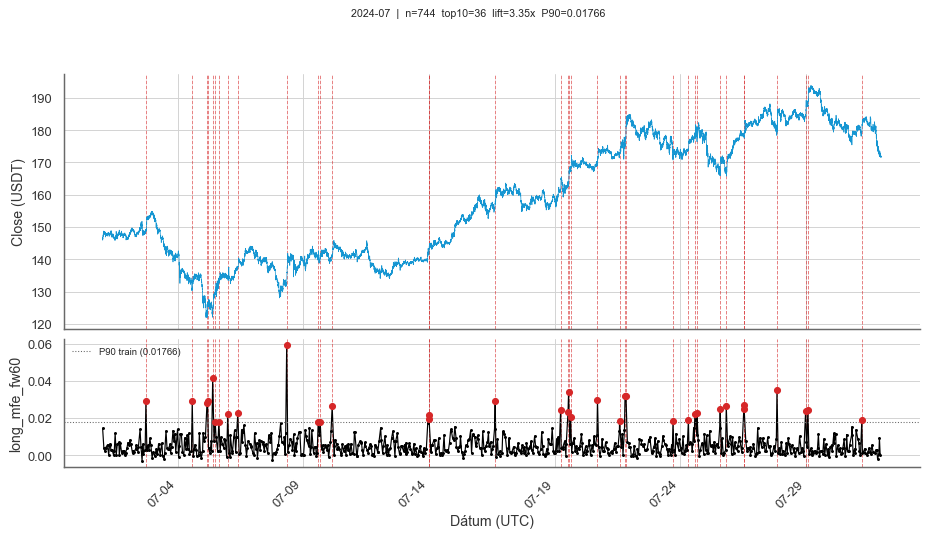



## Sep


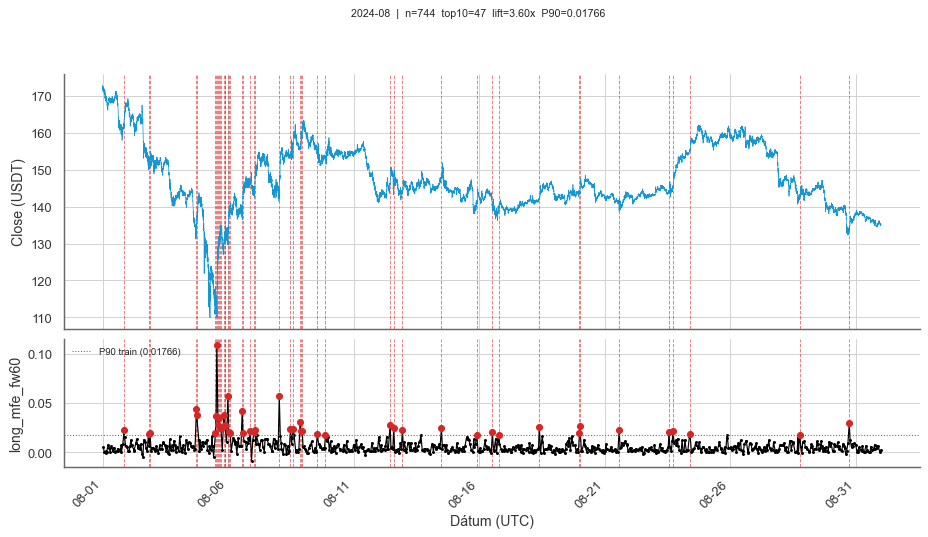



## Oct


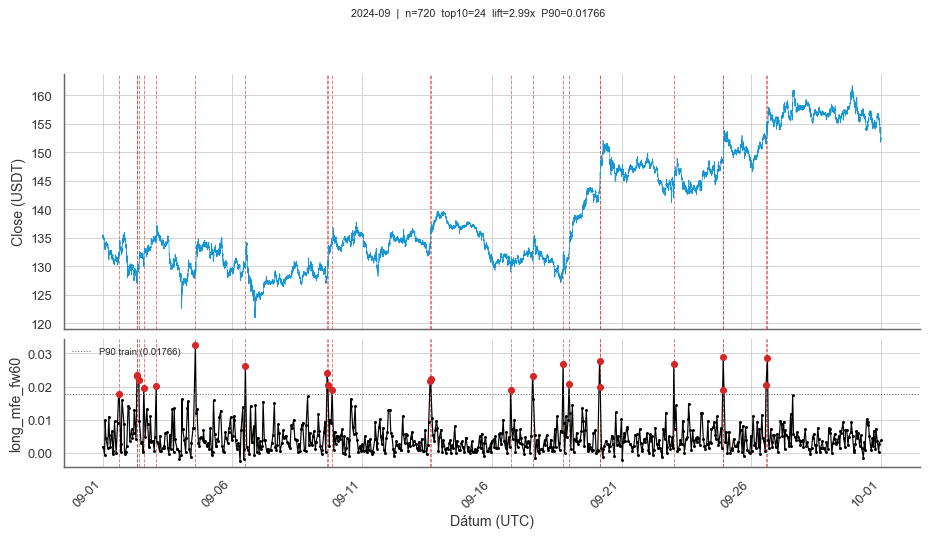



## Nov


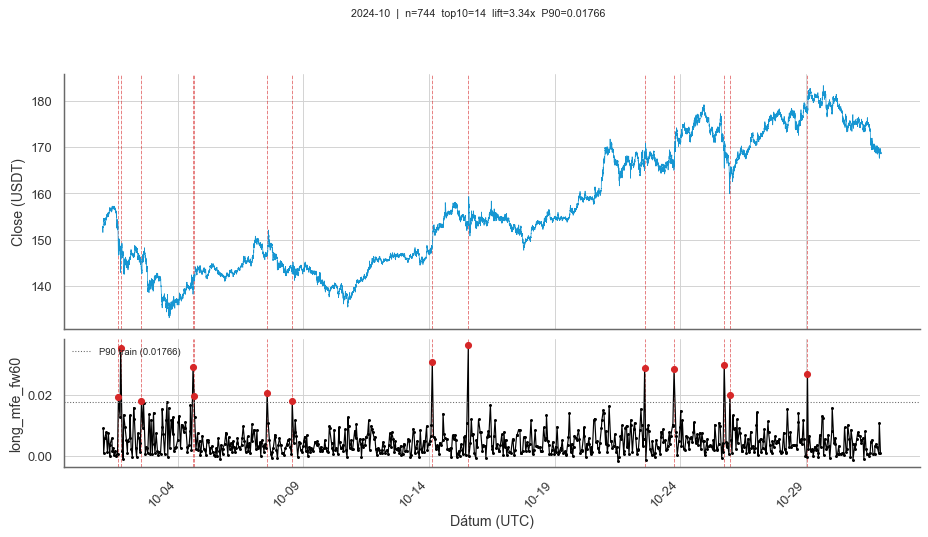



## Dec


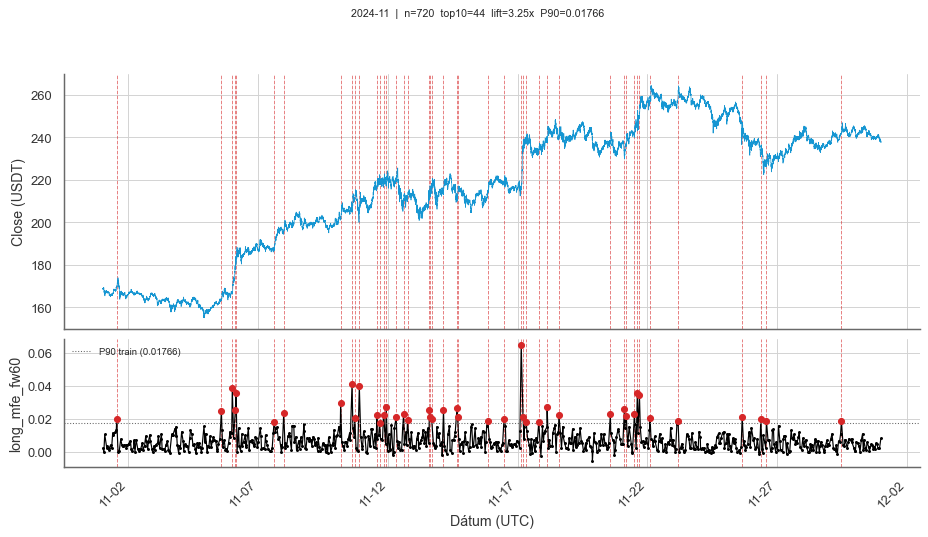



:::


#### 2025

::: {.panel-tabset}

## Jan


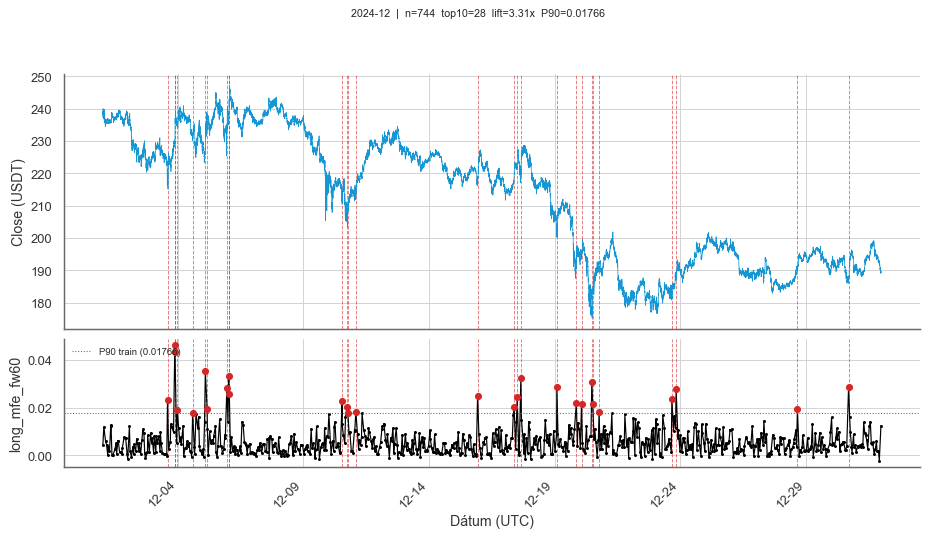



## Feb


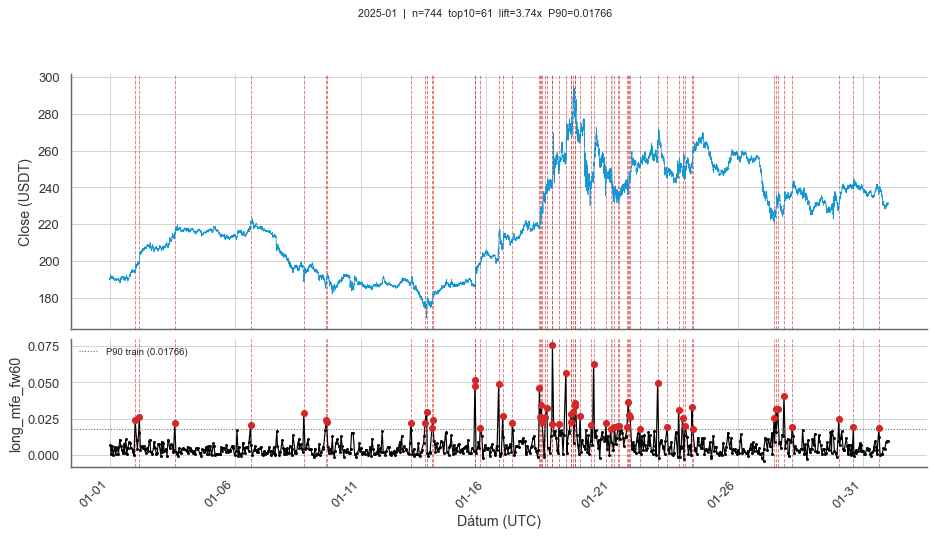



## Mar


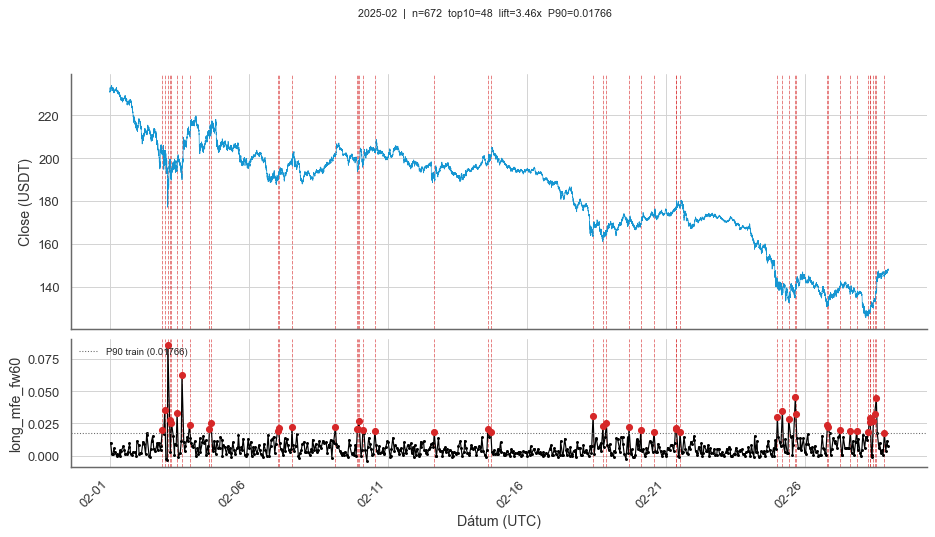



## Apr


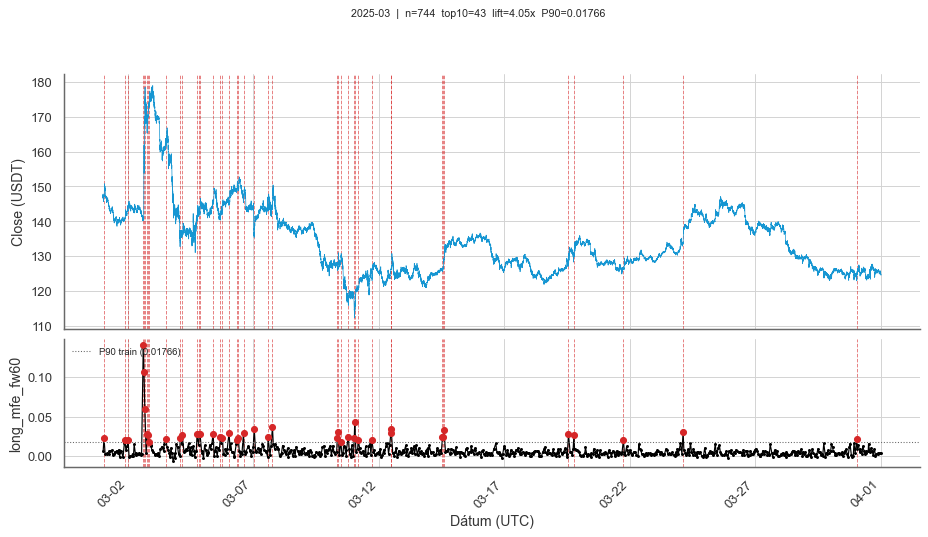



:::


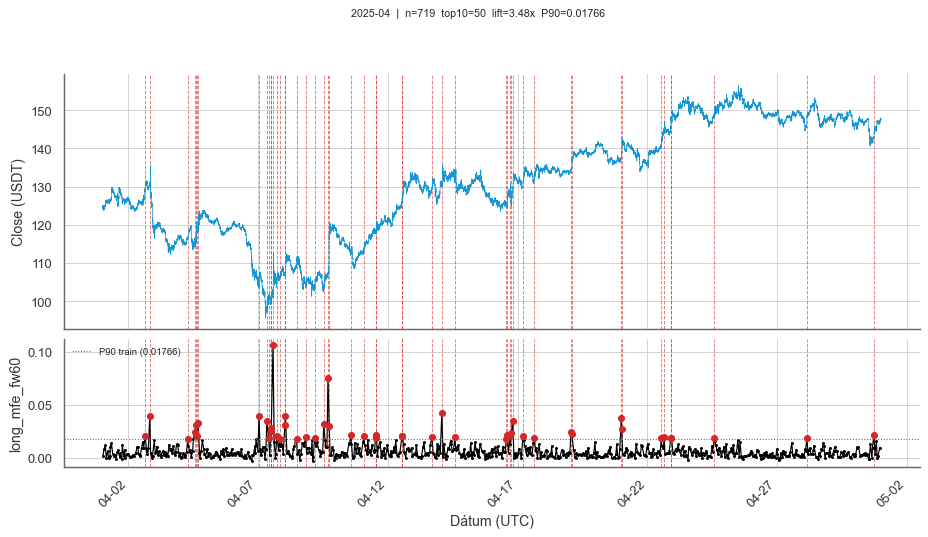

In [9]:
#| label: fig-train-yearly-tabsets
#| output: asis
#| warning: false
#| echo: false

import base64, io, calendar

TOP_DECILE_COLOR = "#d62728"
TABSET_OPEN  = "::: {.panel-tabset}"
TABSET_CLOSE = ":::"

# p90_train, train_df definiálva a tbl-top10-summary cellában
train_start = train_df["open_time"].min().normalize()
train_end   = train_df["open_time"].max().normalize() + pd.Timedelta(days=1)
train_avg   = train_df[TARGET].mean()

LIVE_DB = str(_root / "database" / "solusdt" / "solusdt.duckdb")
con_live = duckdb.connect(LIVE_DB, read_only=True)
ohlcv_train = con_live.execute(
    f"SELECT open_time, close FROM ohlcv "
    f"WHERE open_time >= '{train_start}' AND open_time < '{train_end}' "
    f"ORDER BY open_time"
).fetchdf()
con_live.close()
ohlcv_train["open_time"] = pd.to_datetime(ohlcv_train["open_time"])

train_full2 = train_df.copy()
train_full2["top_decile"] = train_full2[TARGET] >= p90_train
train_full2["ym"]   = train_full2["open_time"].dt.to_period("M")
train_full2["year"] = train_full2["open_time"].dt.year

for year, ydf in train_full2.groupby("year"):
    print(f"\n#### {year}\n")
    print(TABSET_OPEN + "\n")

    for ym, mdf in ydf.groupby("ym"):
        m_start  = ym.to_timestamp()
        m_end    = (ym + 1).to_timestamp()
        ohlcv_m  = ohlcv_train[(ohlcv_train["open_time"] >= m_start) & (ohlcv_train["open_time"] < m_end)]
        top_rows  = mdf[mdf["top_decile"]]
        top_times = top_rows["open_time"].tolist()

        print(f"## {calendar.month_abbr[ym.month]}\n")

        fig, (ax1, ax2) = plt.subplots(
            2, 1, sharex=True, figsize=(13, 6),
            gridspec_kw={"height_ratios": [2, 1], "hspace": 0.05}
        )

        for t in top_times:
            ax1.axvline(t, color=TOP_DECILE_COLOR, linewidth=0.8, linestyle="--", alpha=0.6, zorder=1)
            ax2.axvline(t, color=TOP_DECILE_COLOR, linewidth=0.8, linestyle="--", alpha=0.6, zorder=1)

        if len(ohlcv_m):
            ax1.plot(ohlcv_m["open_time"], ohlcv_m["close"],
                     color=CQ_COLORS["blue"], linewidth=0.6, zorder=2)
        ax1.set_ylabel("Close (USDT)")
        ax1.tick_params(axis="x", labelbottom=False)

        if len(mdf):
            ax2.plot(mdf["open_time"], mdf[TARGET],
                     color=CQ_COLORS["black"], linewidth=1.0,
                     marker="o", markersize=1.5, zorder=3)
        if len(top_rows):
            ax2.scatter(top_rows["open_time"], top_rows[TARGET],
                        color=TOP_DECILE_COLOR, s=25, zorder=4)
        ax2.axhline(p90_train, color=CQ_COLORS["gray"], linewidth=0.9, linestyle=":",
                    label=f"P90 train ({p90_train:.5f})", zorder=3)
        ax2.set_ylabel("long_mfe_fw60")
        ax2.set_xlabel("Dátum (UTC)")
        ax2.legend(loc="upper left", fontsize=8)

        ax2.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
        ax2.xaxis.set_major_locator(mdates.DayLocator(interval=5))
        plt.setp(ax2.get_xticklabels(), rotation=45, ha="right")

        n_t = len(top_rows)
        t_avg = top_rows[TARGET].mean() if n_t else np.nan
        lift  = t_avg / train_avg if n_t else np.nan
        lift_str = f"lift={lift:.2f}x" if not np.isnan(lift) else "lift=n/a"
        fig.suptitle(
            f"{ym}  |  n={len(mdf)}  top10={n_t}  {lift_str}  P90={p90_train:.5f}",
            fontsize=9, y=1.01
        )
        plt.tight_layout()

        buf = io.BytesIO()
        fig.savefig(buf, format="png", dpi=85, bbox_inches="tight")
        buf.seek(0)
        img_b64 = base64.b64encode(buf.read()).decode()
        plt.close(fig)

        print(f"![](data:image/png;base64,{img_b64})\n")

    print(TABSET_CLOSE + "\n")

### Valid — havi bontás, heti tabset


#### May 2025

::: {.panel-tabset}

## 05-01–05-07



C:\Users\eross\AppData\Local\Temp\ipykernel_2092\4274576124.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()




## 05-08–05-14


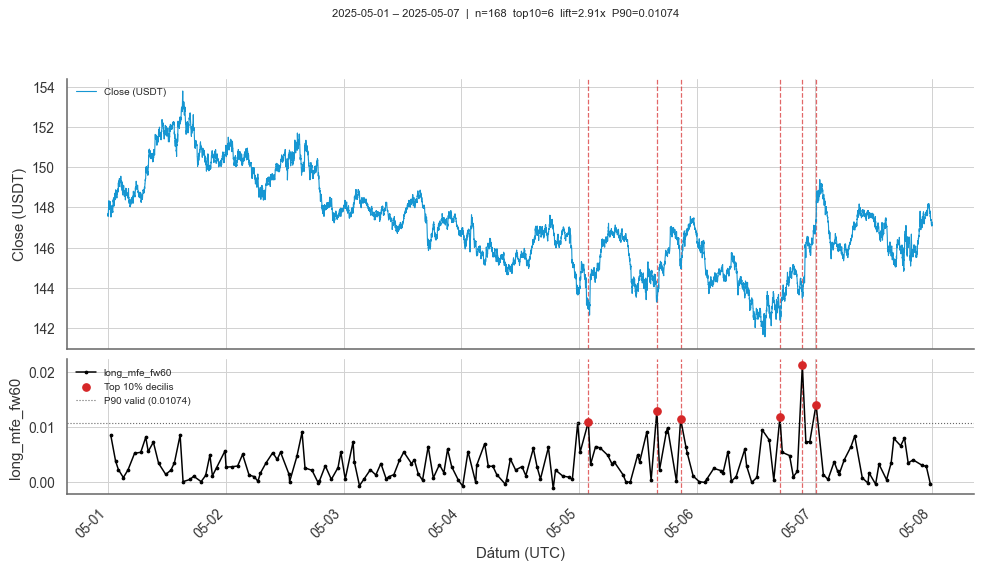



## 05-15–05-21


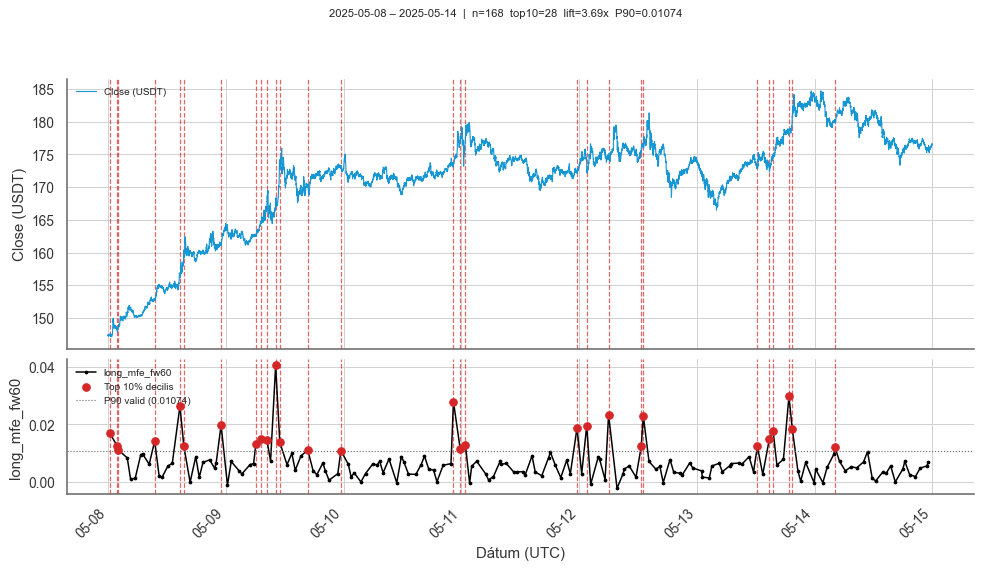



## 05-22–05-28


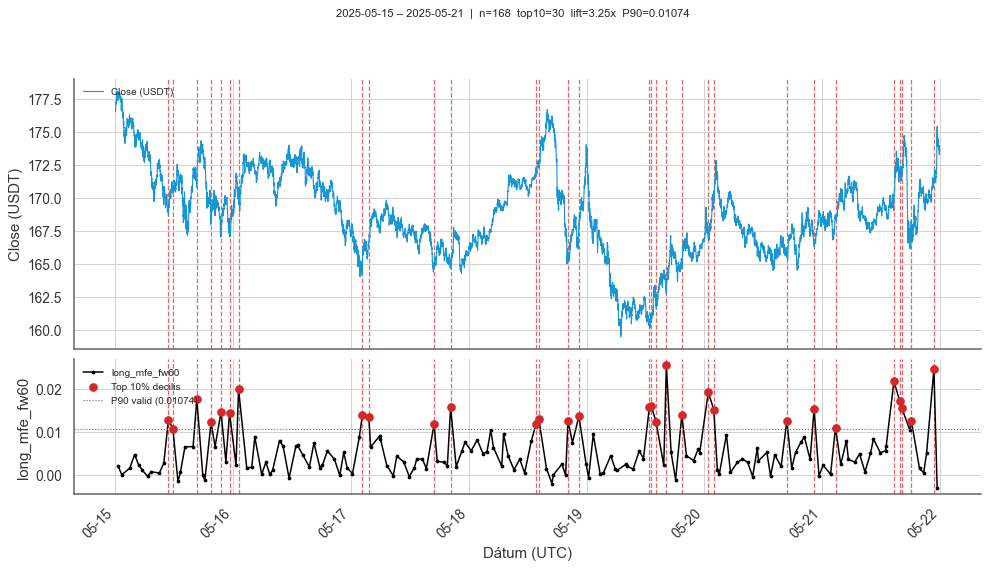



## 05-29–06-04


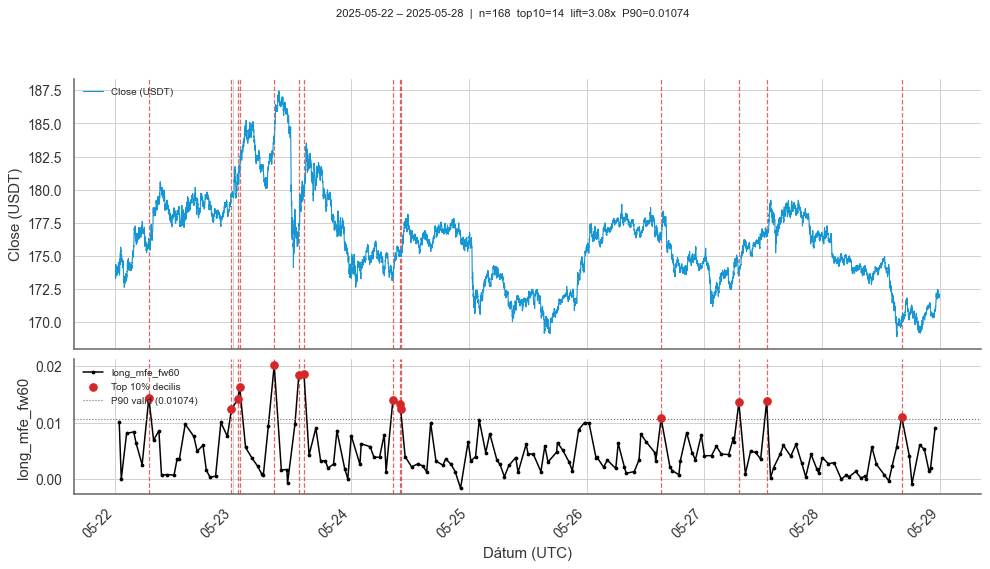



:::


#### Jun 2025

::: {.panel-tabset}

## 06-05–06-11


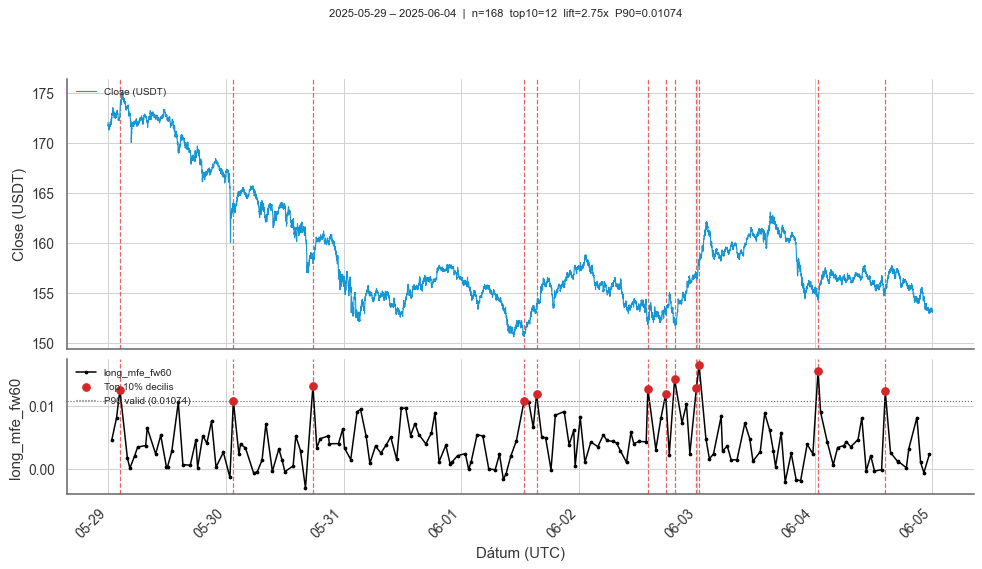



## 06-12–06-18


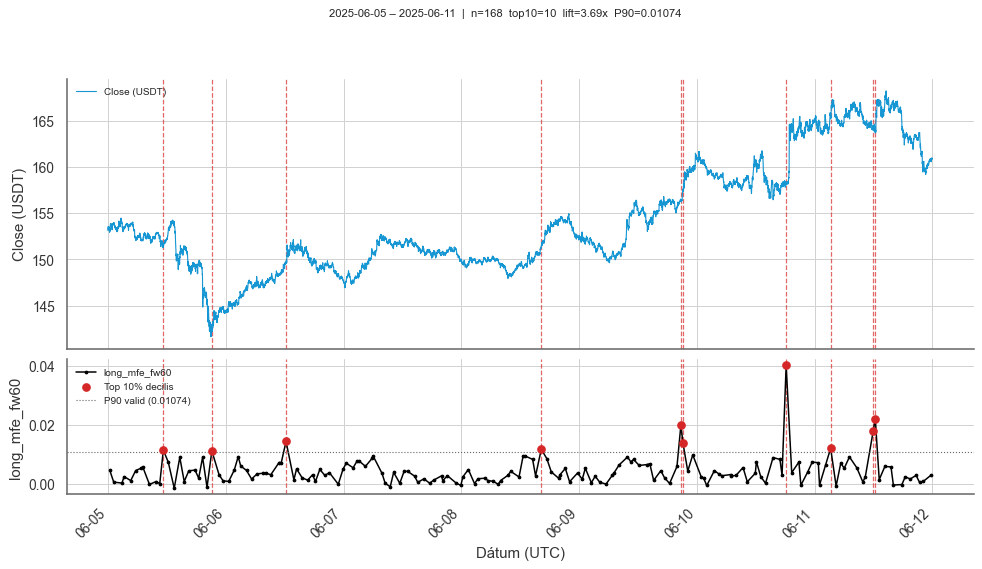



## 06-19–06-25


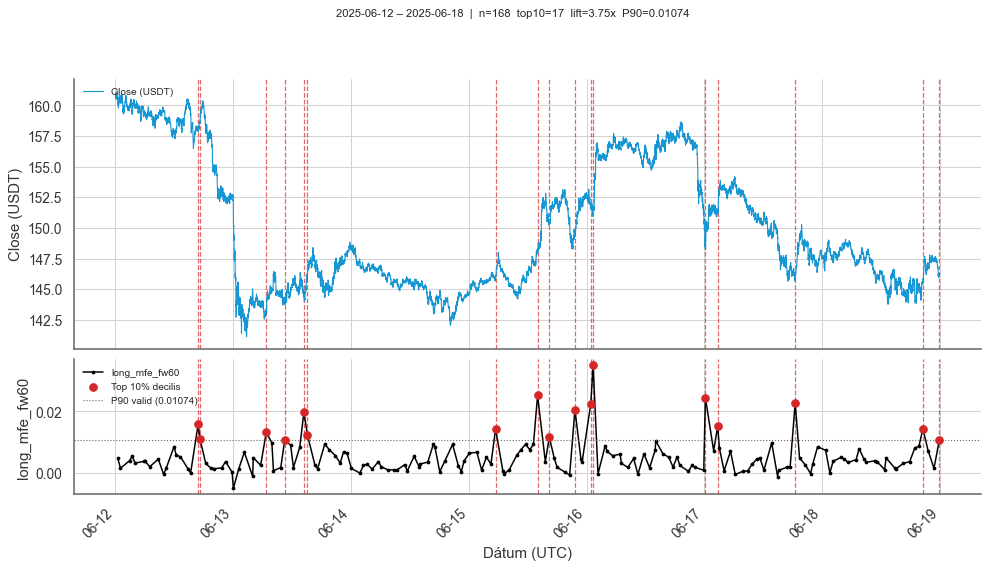



## 06-26–07-02


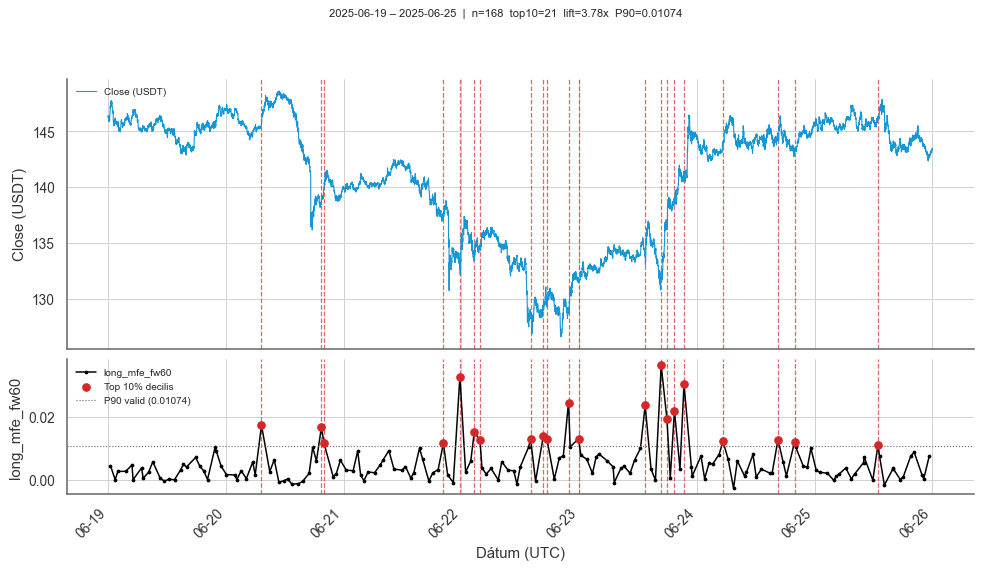



:::


#### Jul 2025

::: {.panel-tabset}

## 07-03–07-09


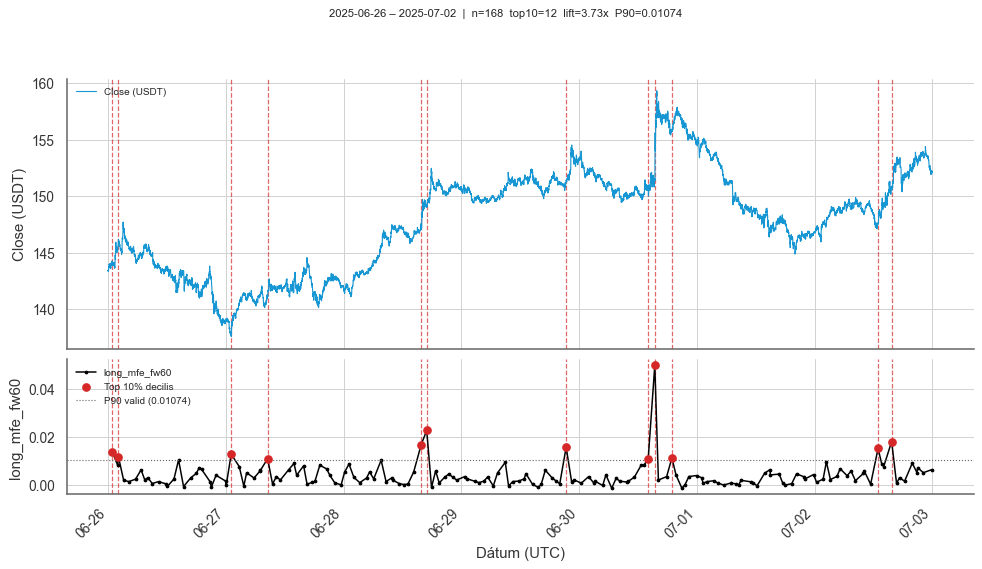



## 07-10–07-16


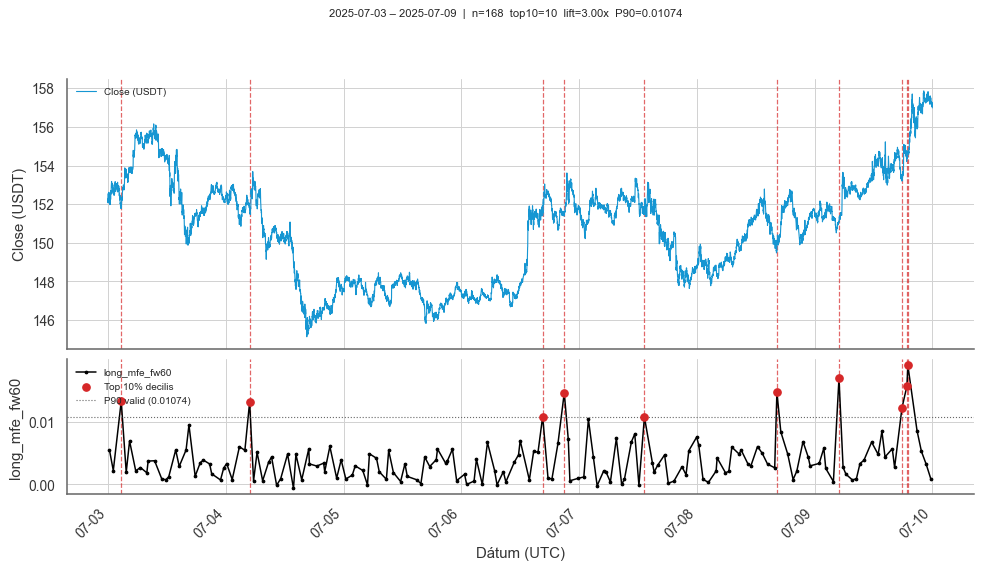



## 07-17–07-23


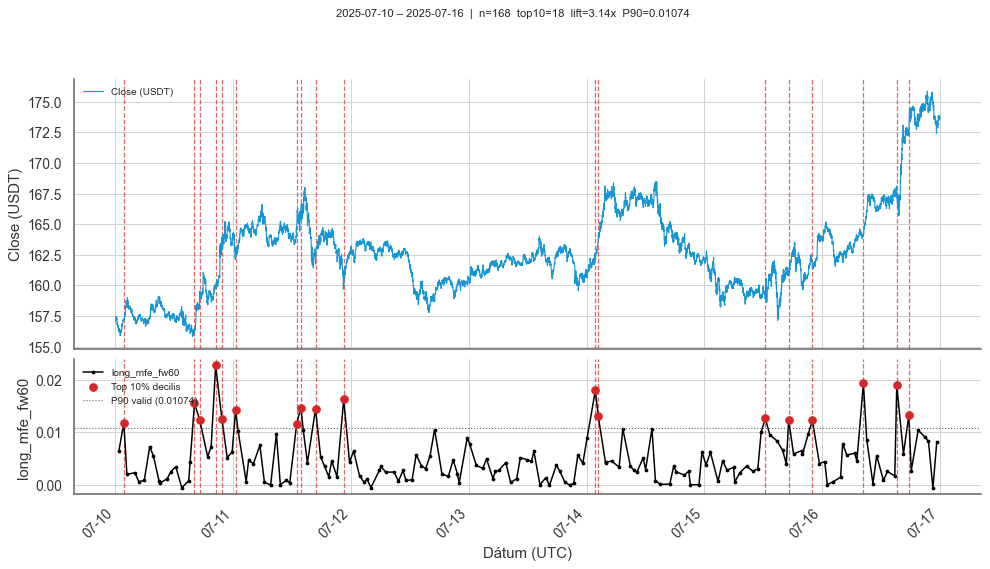



## 07-24–07-30


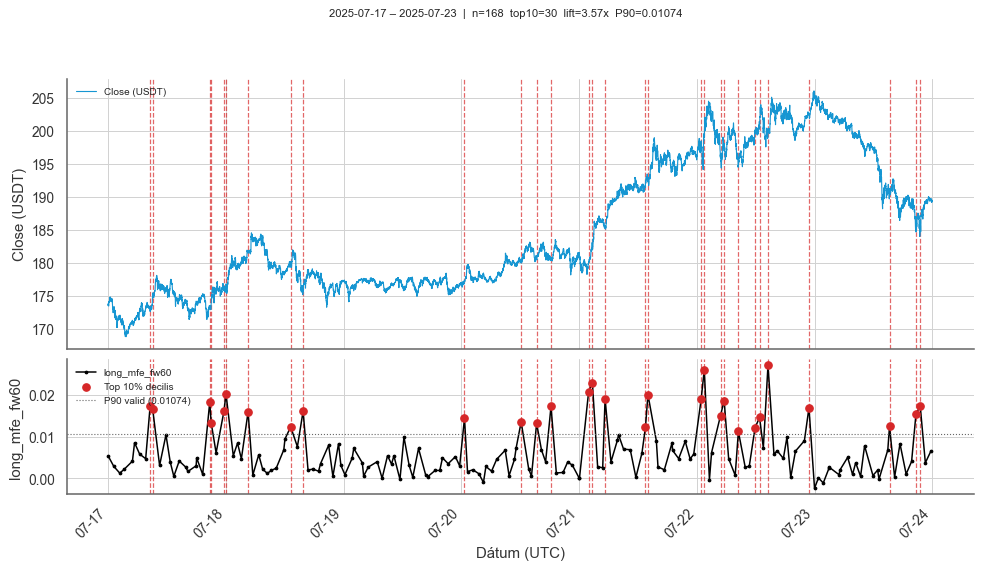



## 07-31–08-06


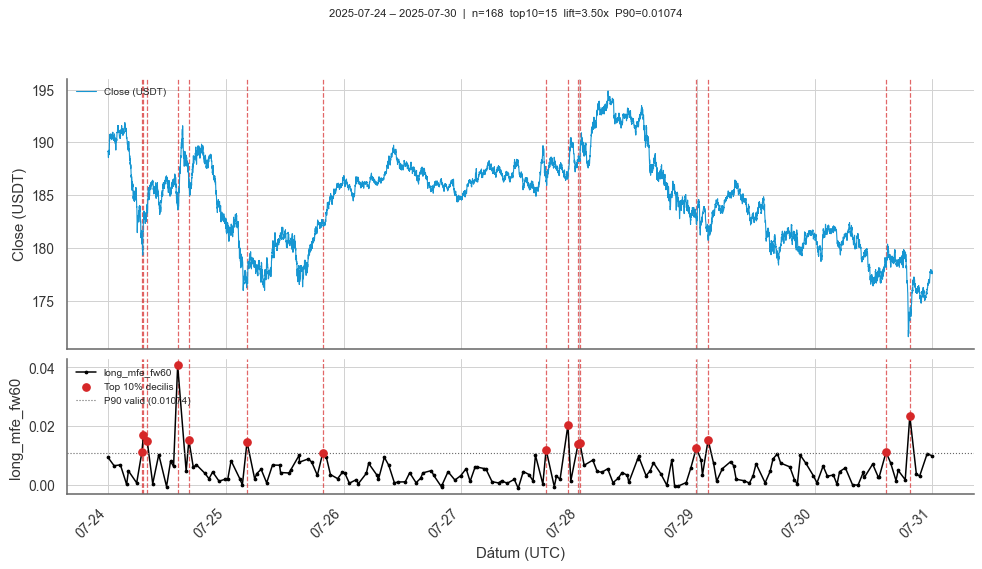



:::


#### Aug 2025

::: {.panel-tabset}

## 08-07–08-13


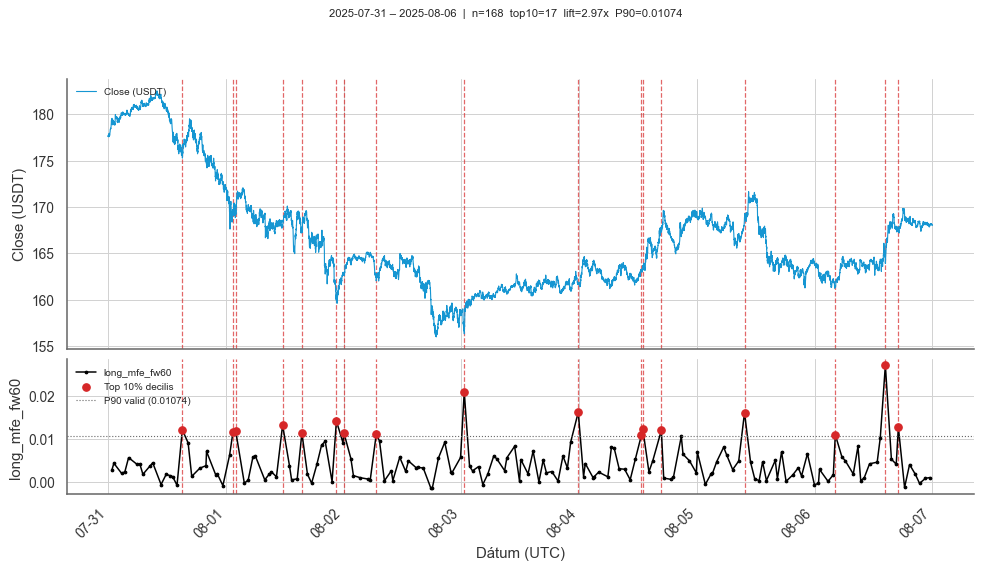



## 08-14–08-20


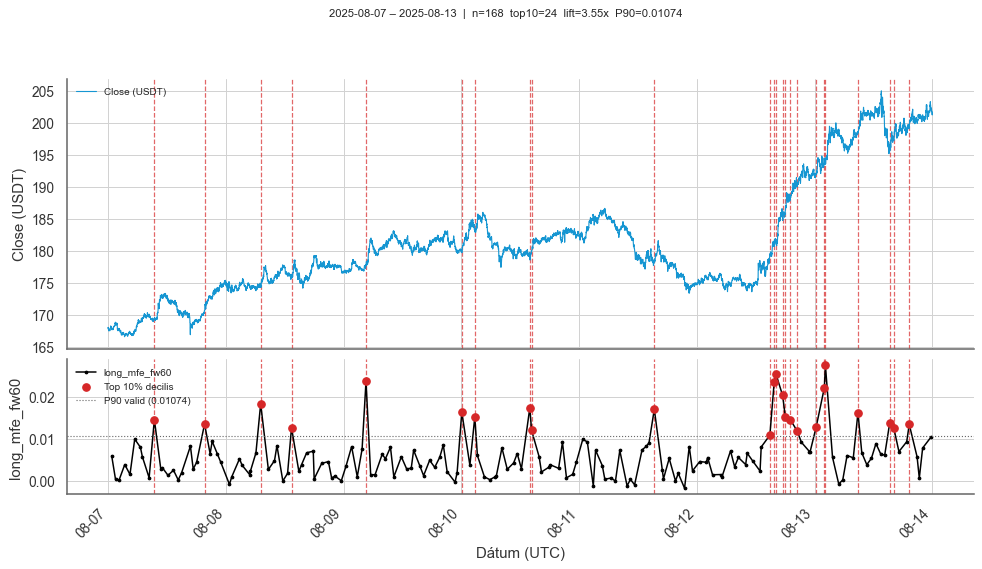



## 08-21–08-27


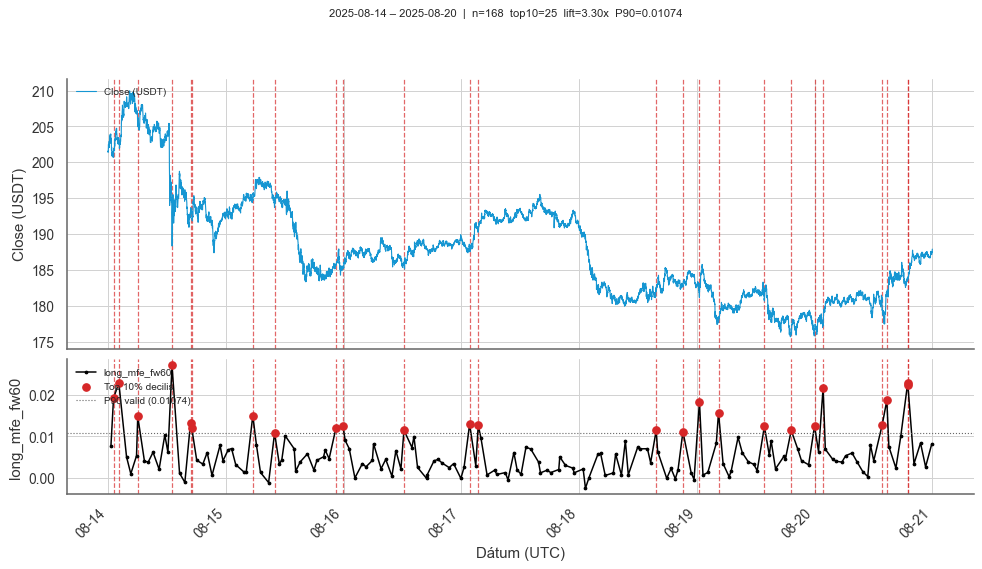



## 08-28–09-03


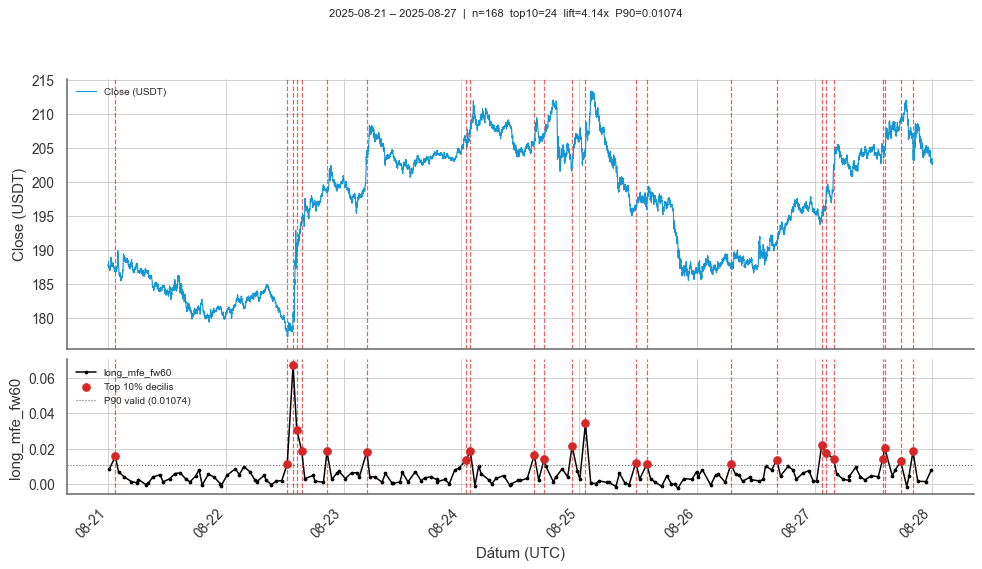



:::


#### Sep 2025

::: {.panel-tabset}

## 09-04–09-10


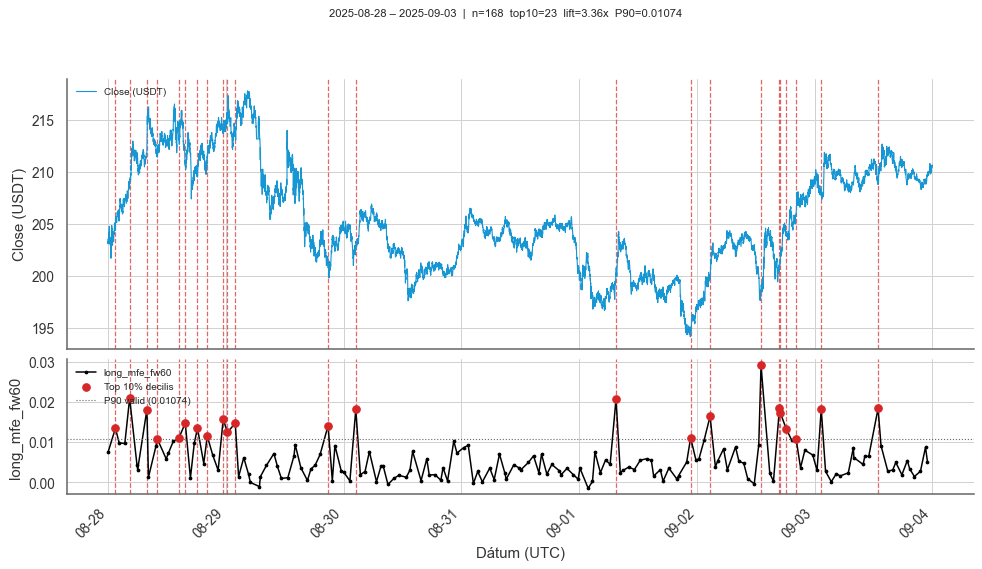



## 09-11–09-17


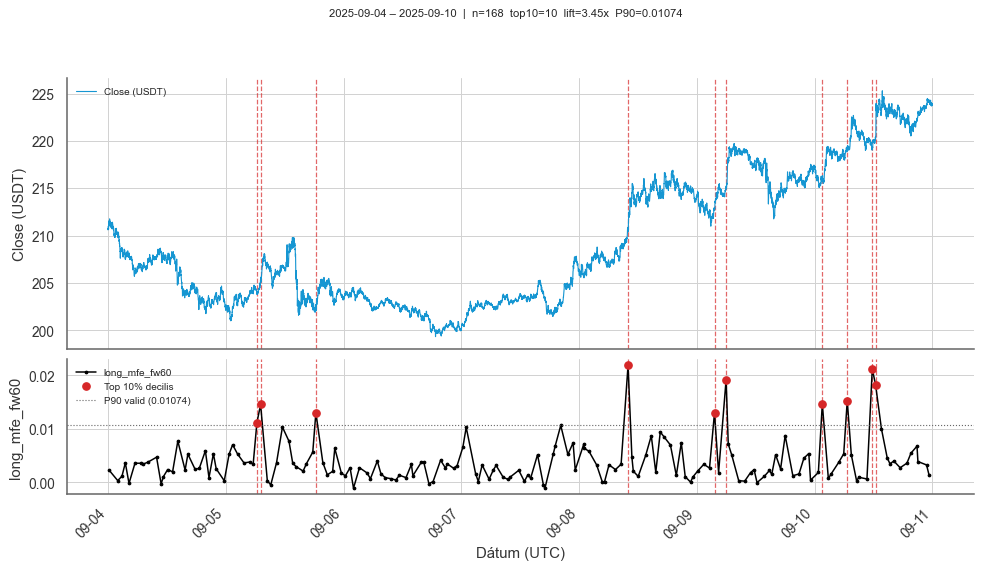



## 09-18–09-24


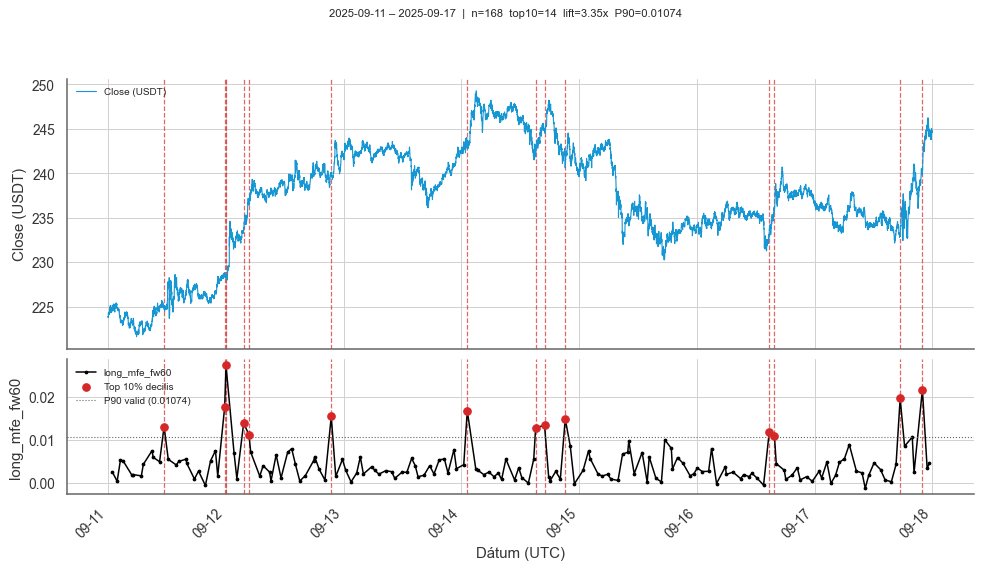



## 09-25–10-01


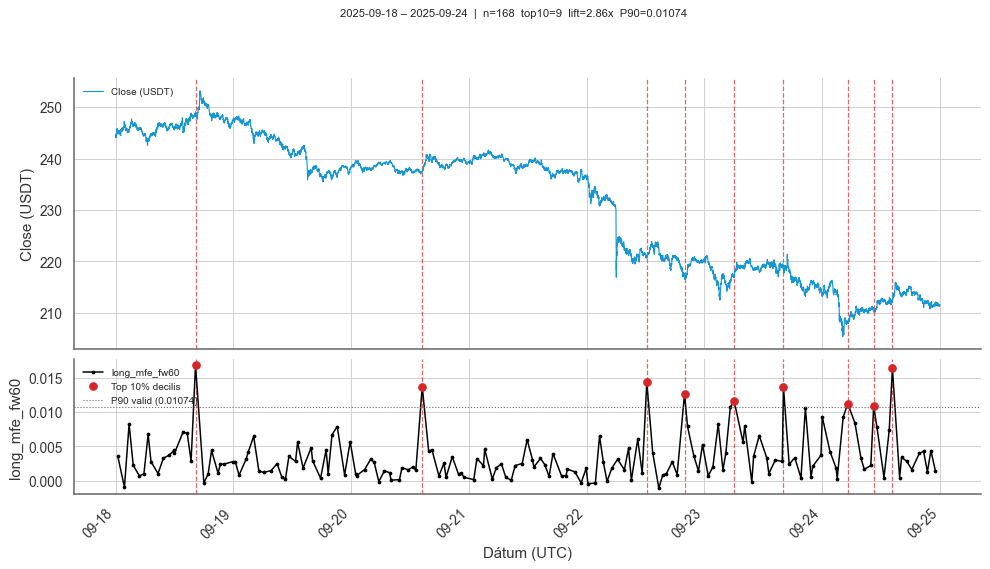



:::


#### Oct 2025

::: {.panel-tabset}

## 10-02–10-08


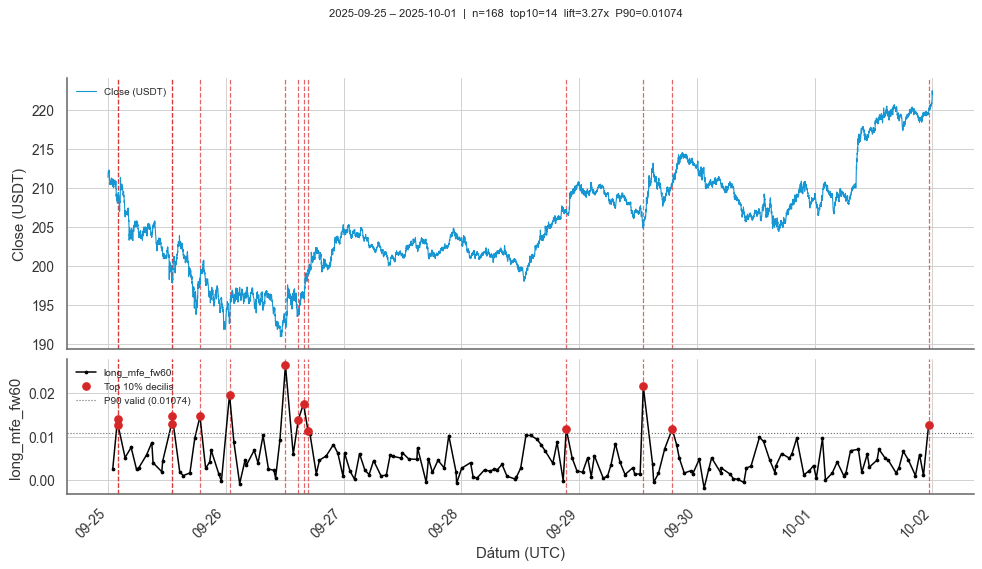



## 10-09–10-15


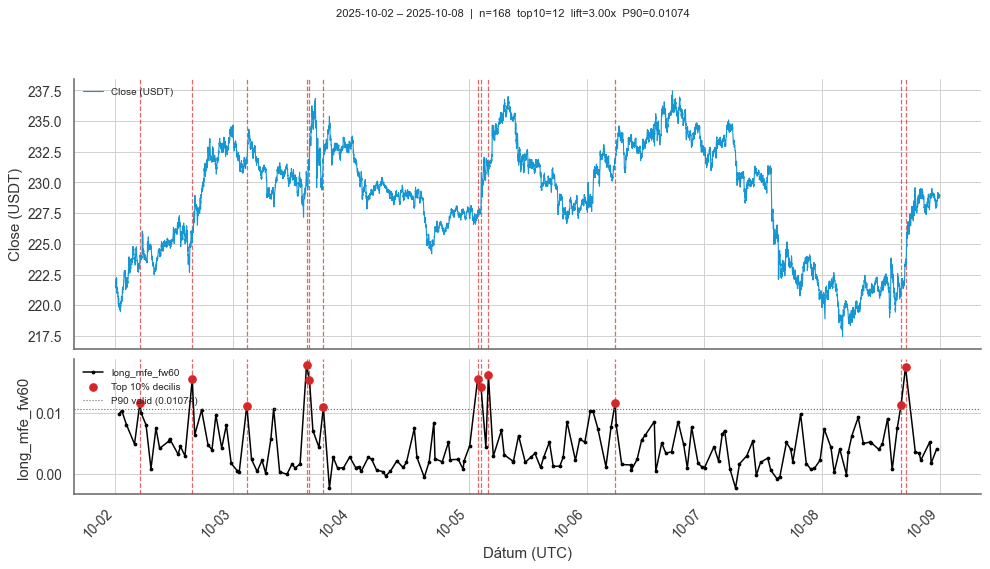



## 10-16–10-22


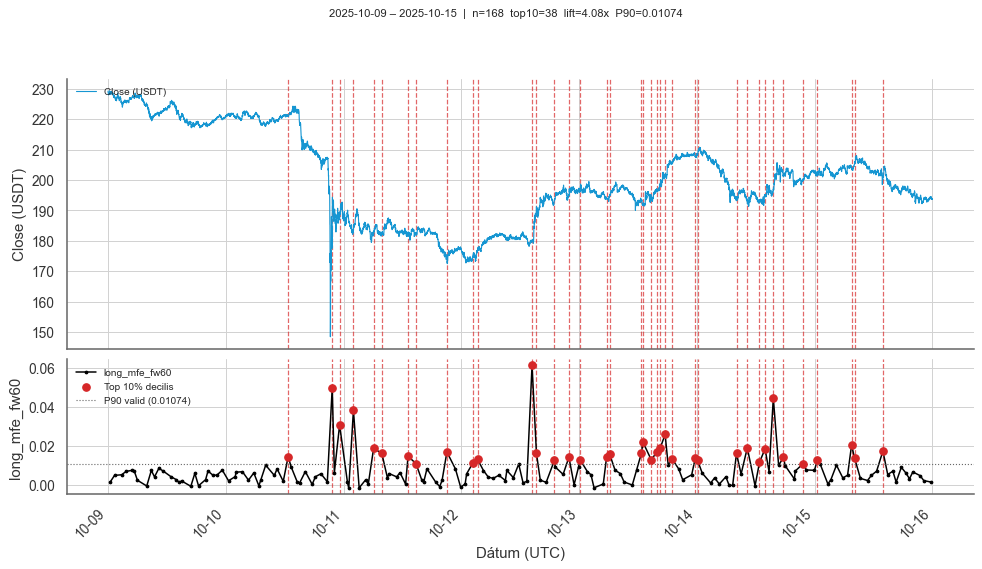



## 10-23–10-29


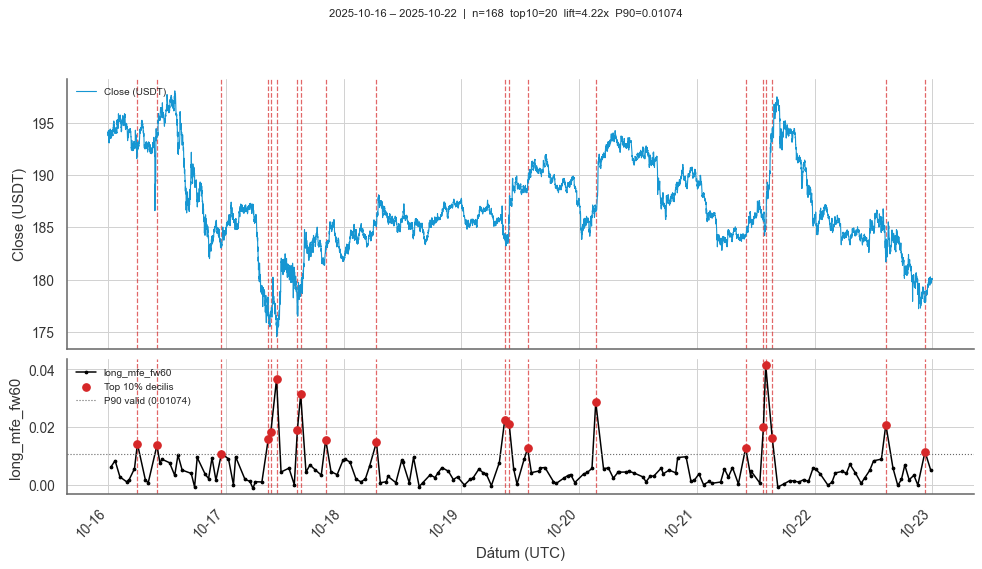



## 10-30–11-05


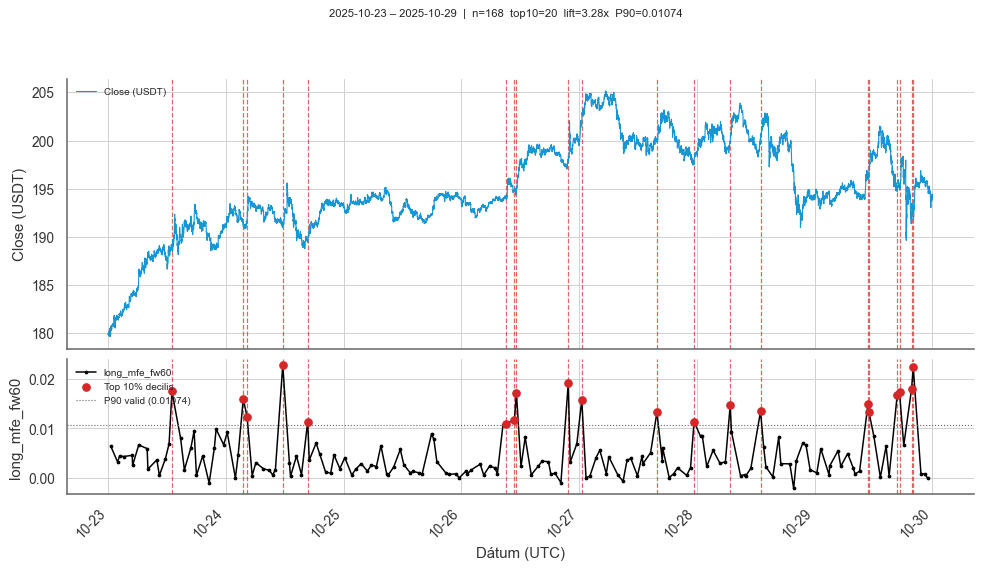



:::


#### Nov 2025

::: {.panel-tabset}

## 11-06–11-12


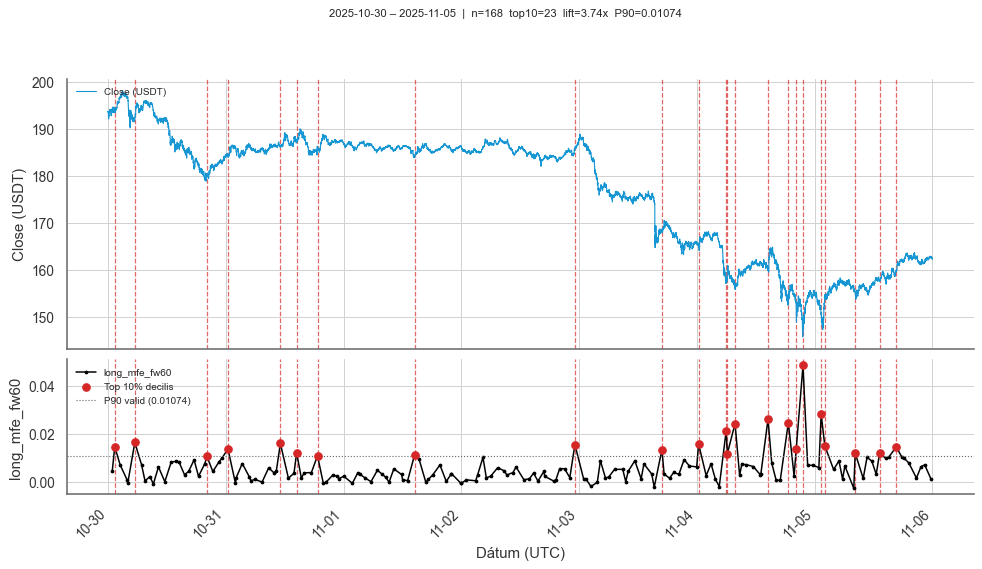



## 11-13–11-19


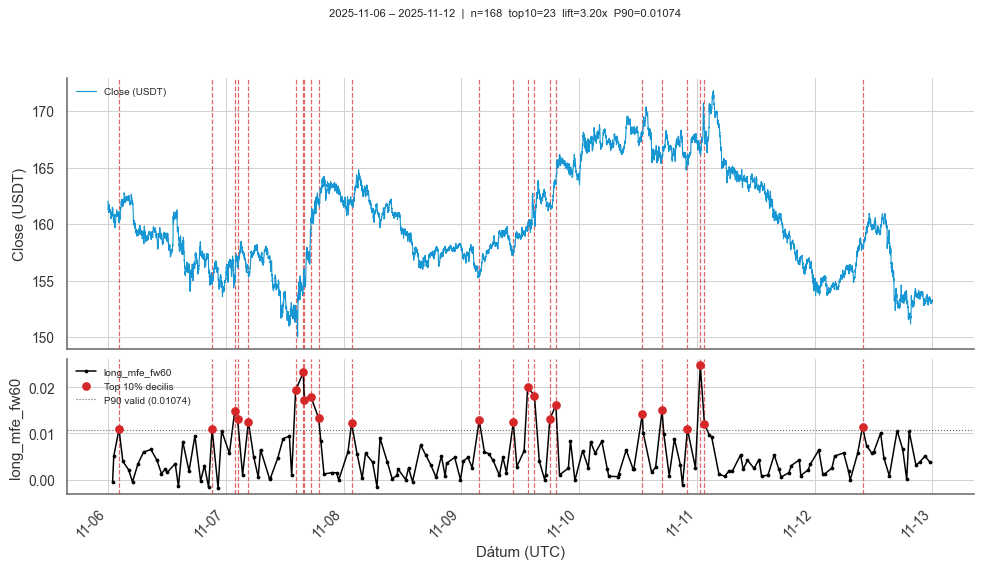



## 11-20–11-26


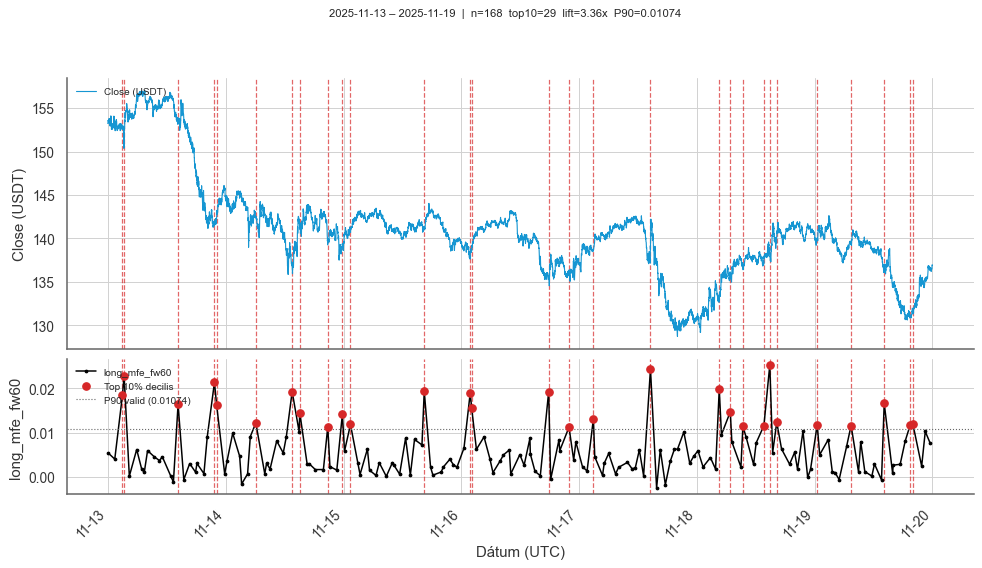



## 11-27–12-03


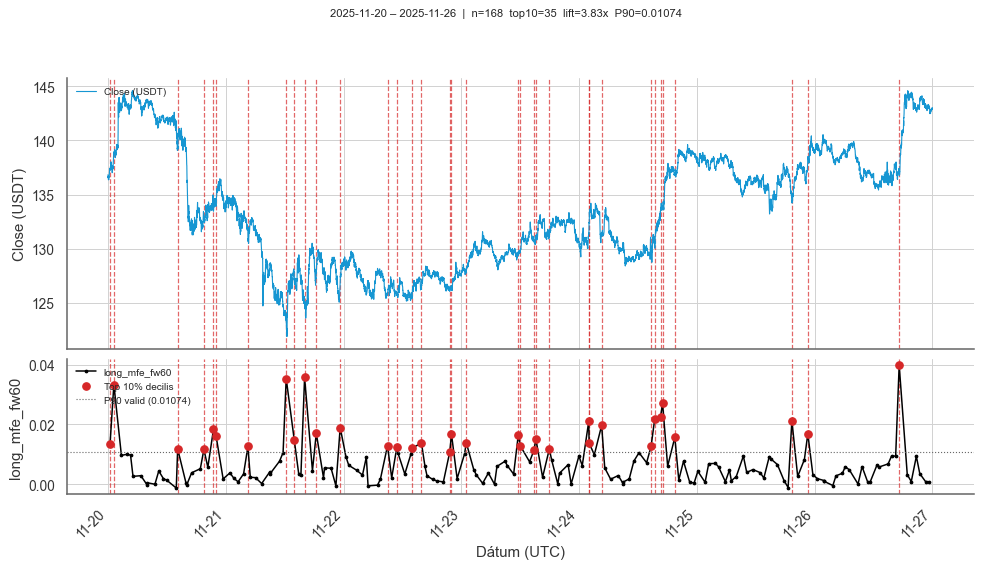



:::


#### Dec 2025

::: {.panel-tabset}

## 12-04–12-10


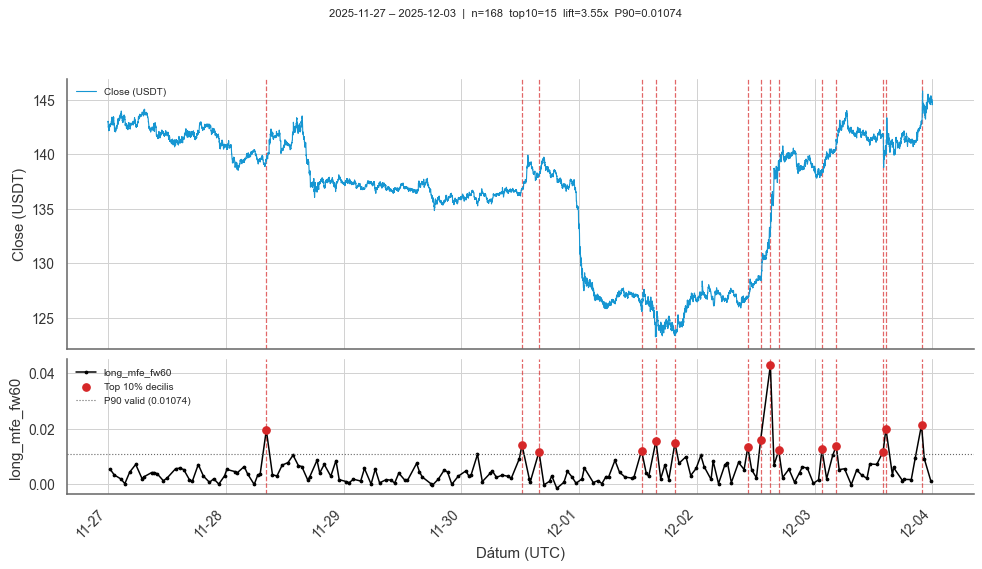



## 12-11–12-17


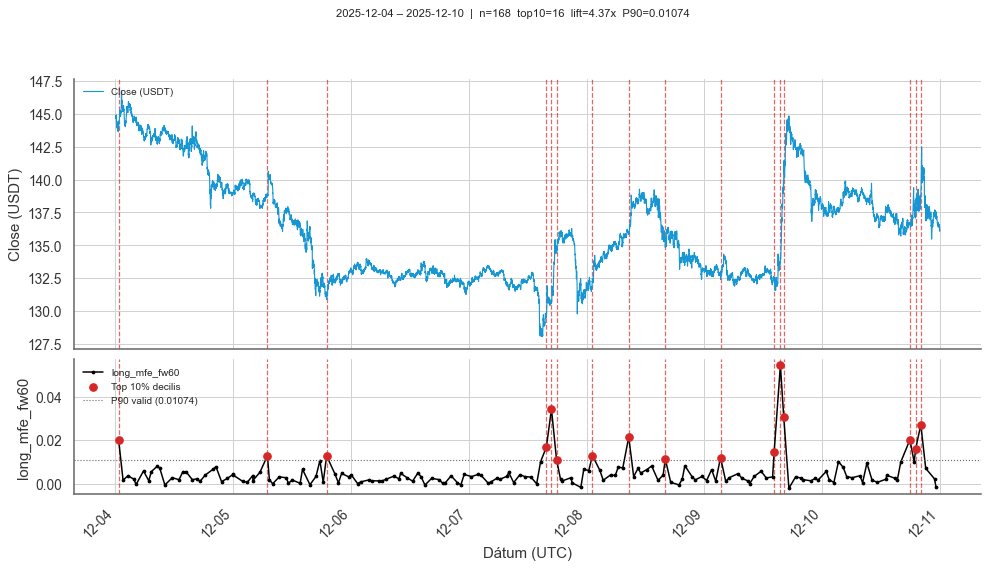



## 12-18–12-24


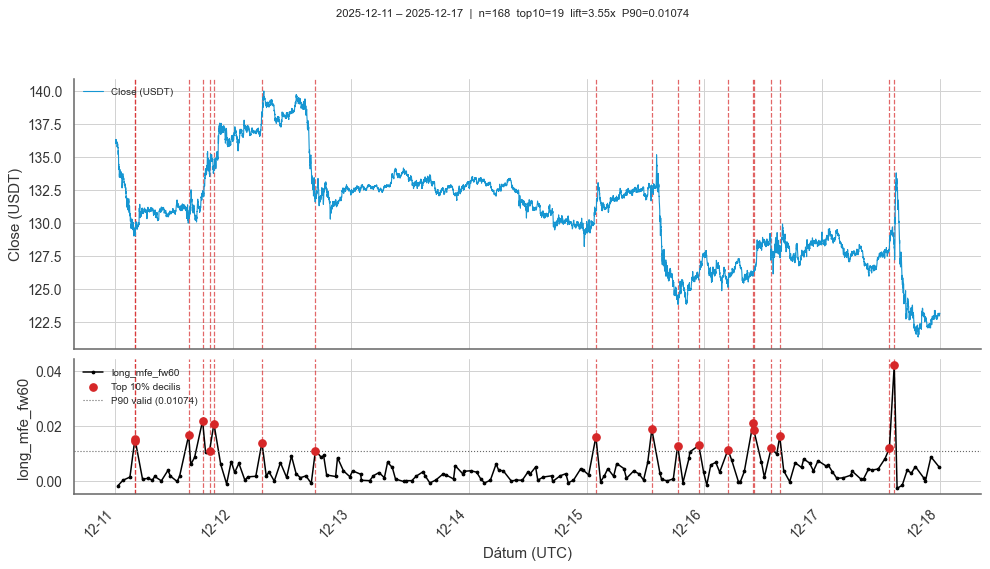



## 12-25–12-31


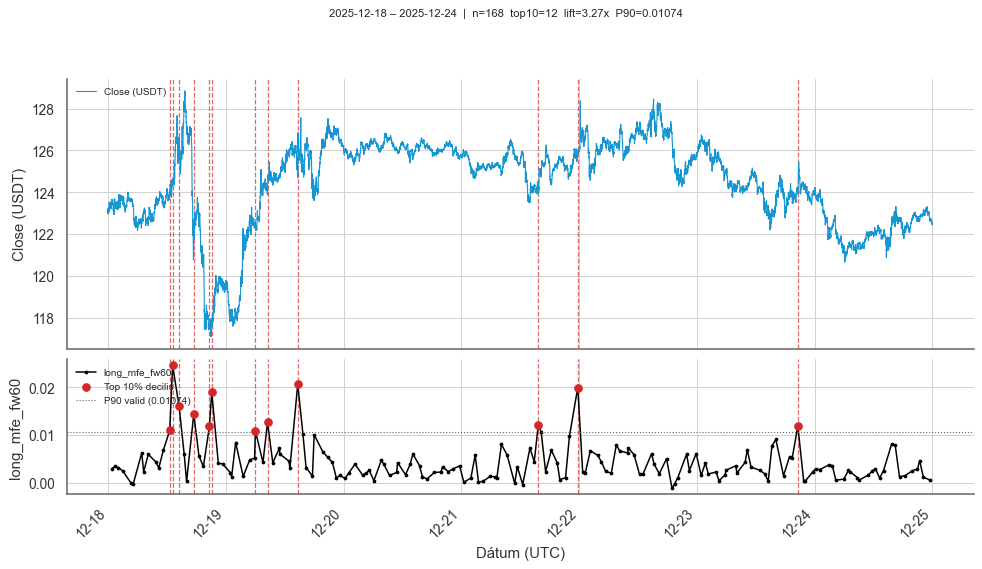



:::


#### Jan 2026

::: {.panel-tabset}

## 01-01–01-07


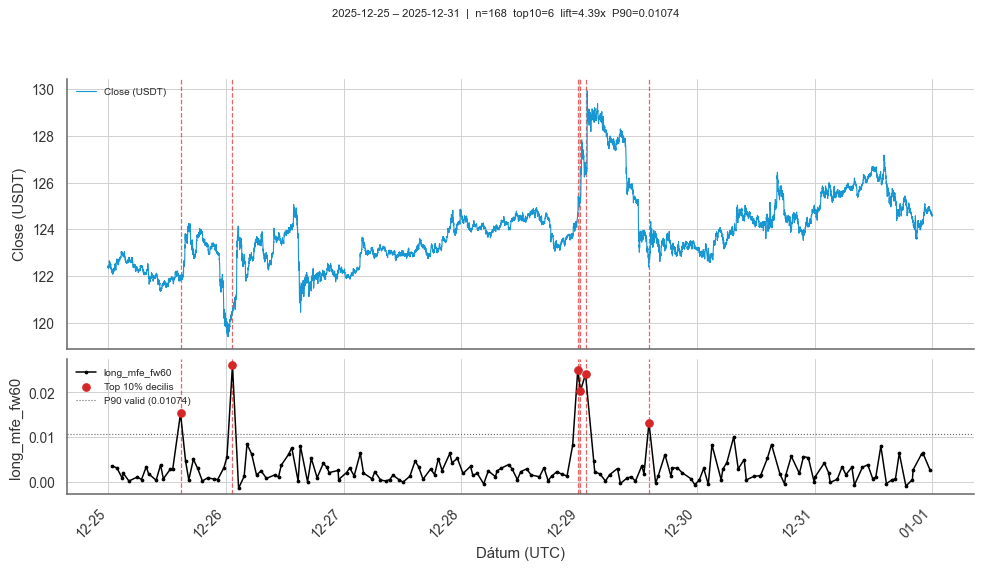



## 01-08–01-14


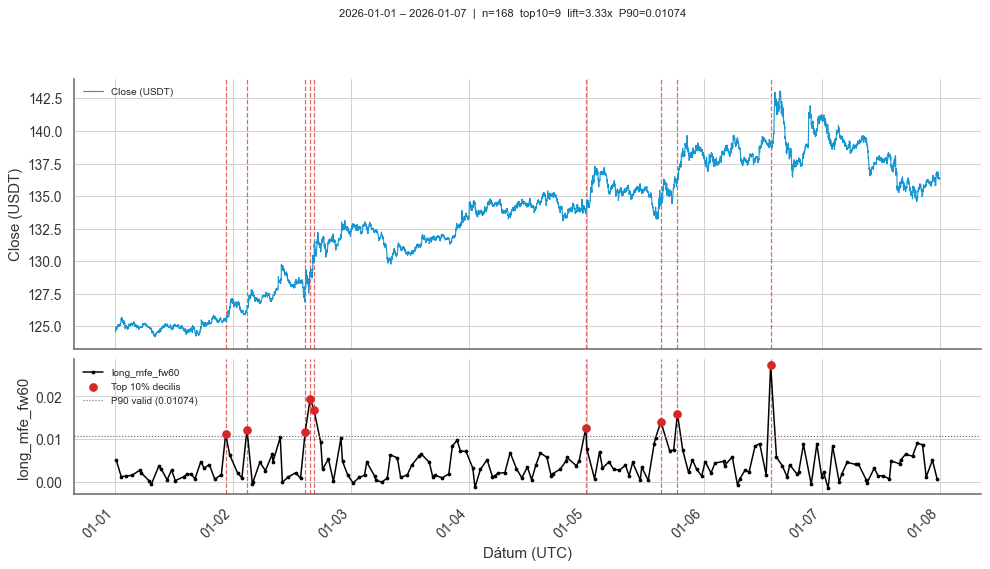



## 01-15–01-21


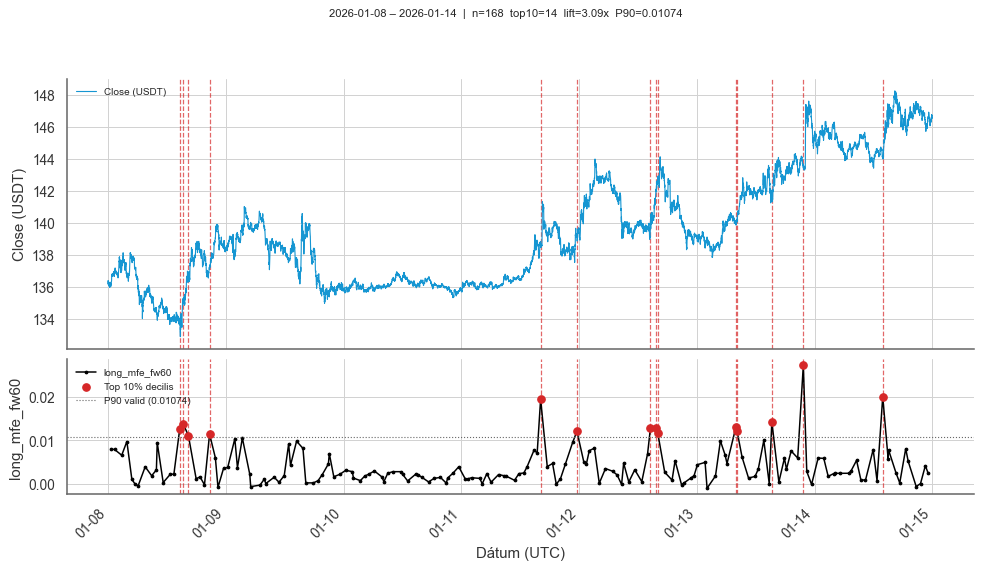



## 01-22–01-28


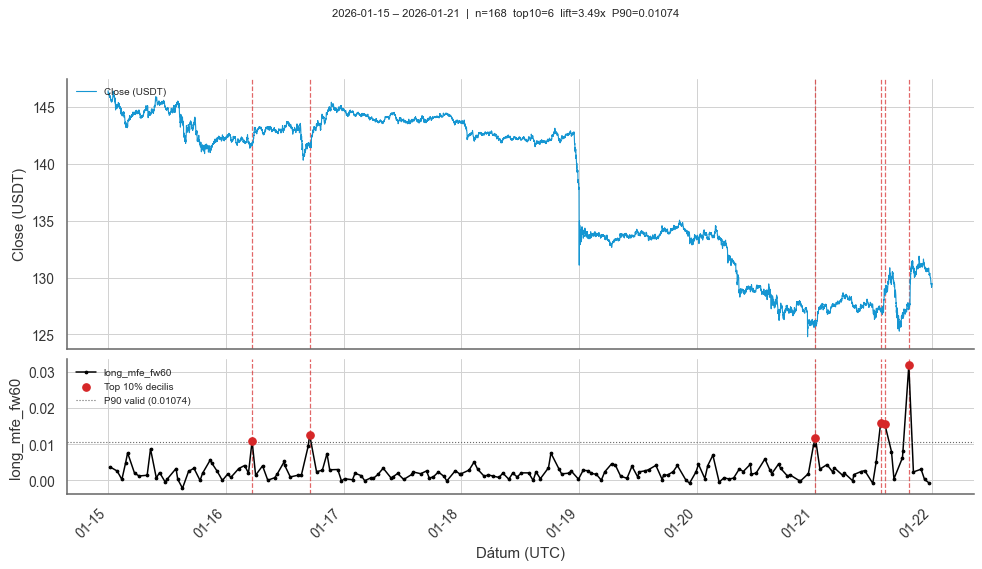



## 01-29–02-04


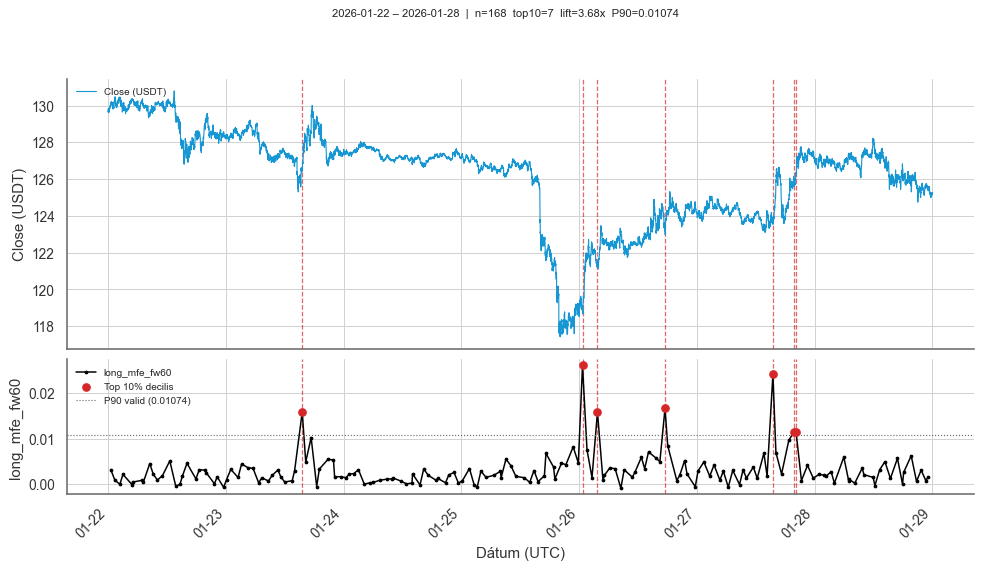



:::


#### Feb 2026

::: {.panel-tabset}

## 02-05–02-11


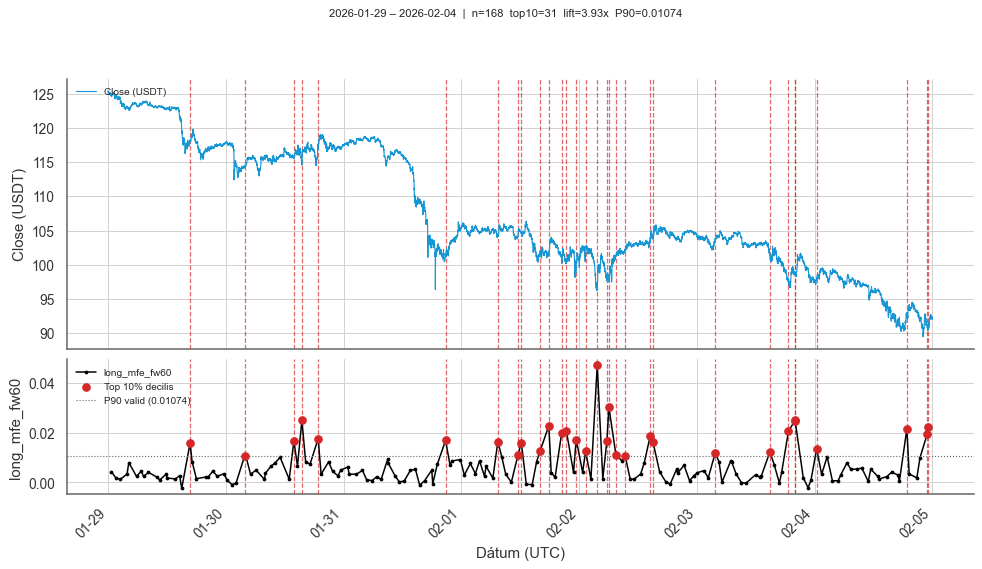



## 02-12–02-18


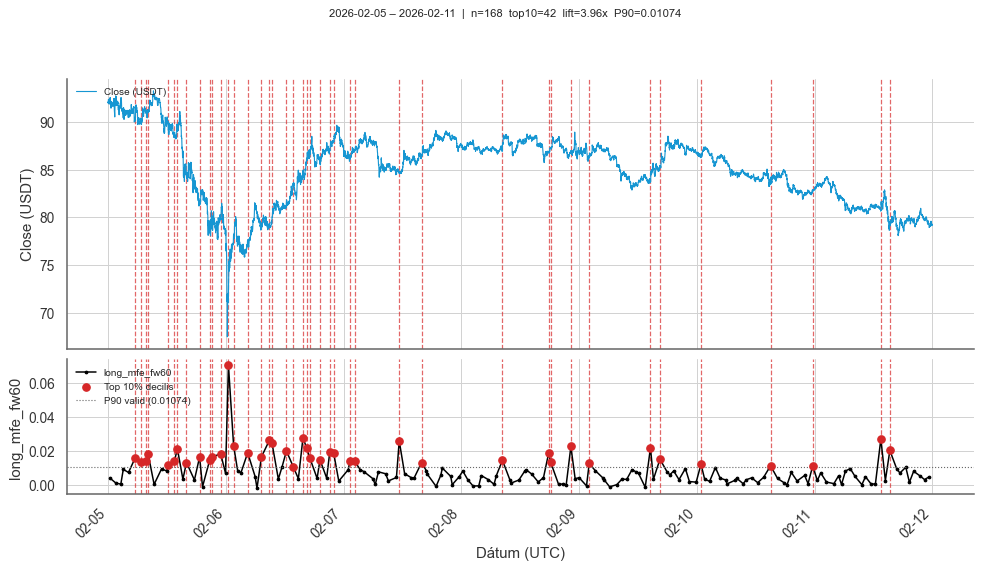



## 02-19–02-25


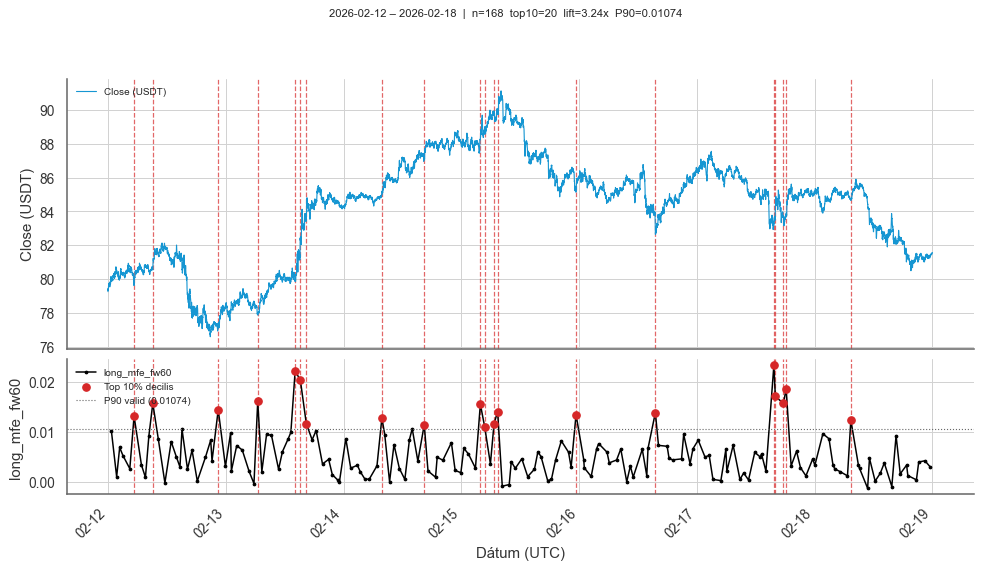



## 02-26–03-04


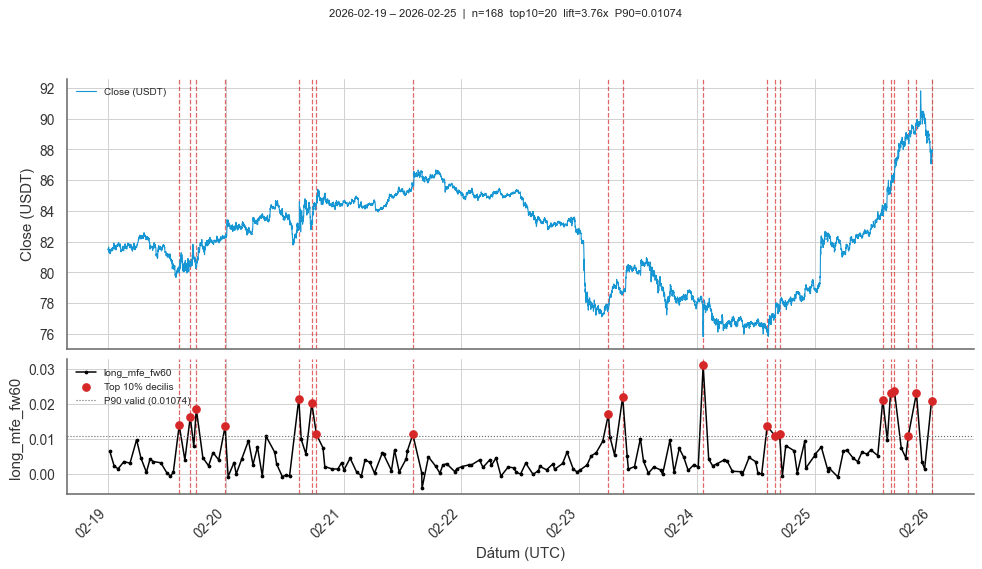



:::


#### Mar 2026

::: {.panel-tabset}

## 03-05–03-11


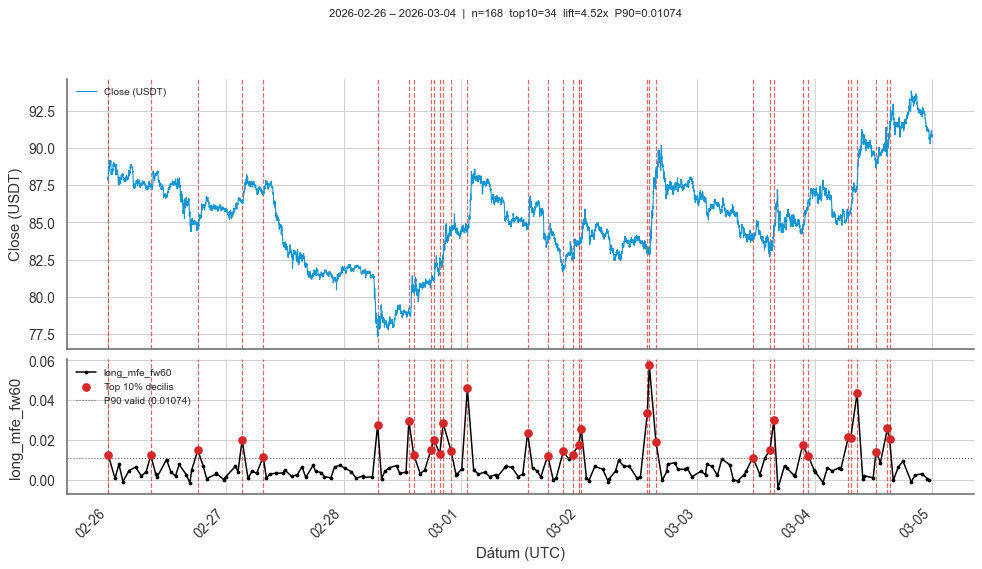



## 03-12–03-18


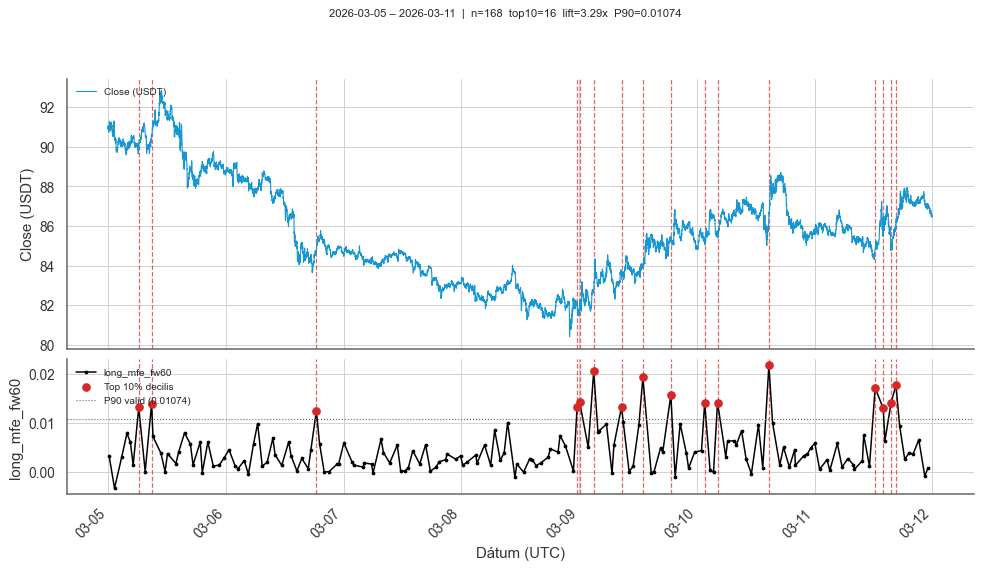



## 03-19–03-25


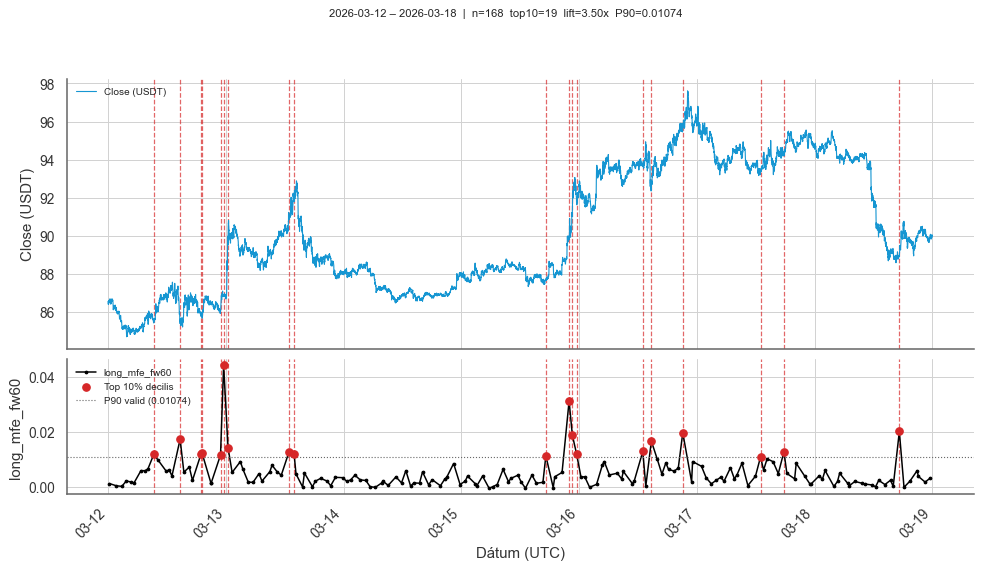



## 03-26–04-01


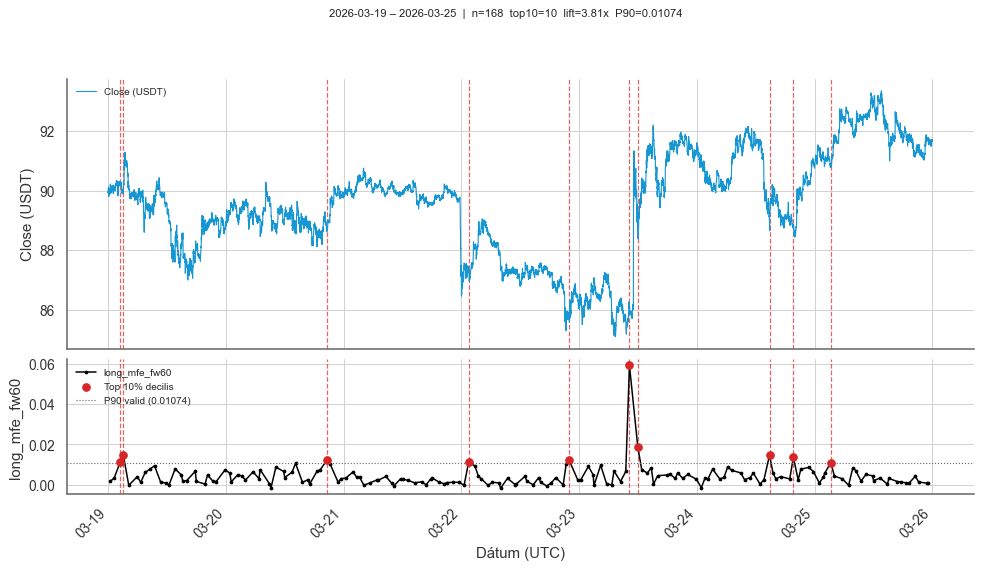



:::


#### Apr 2026

::: {.panel-tabset}

## 04-02–04-08


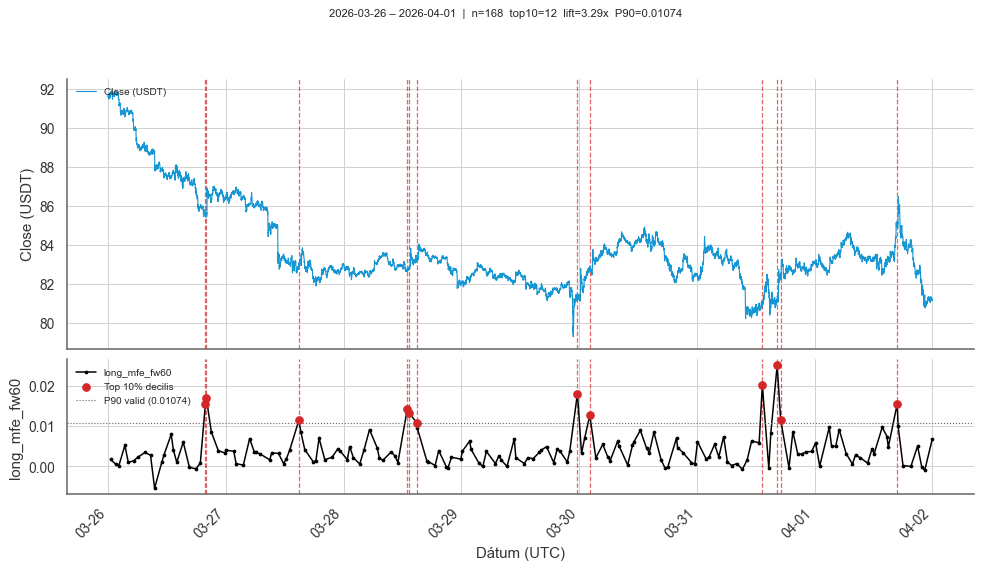



## 04-09–04-15


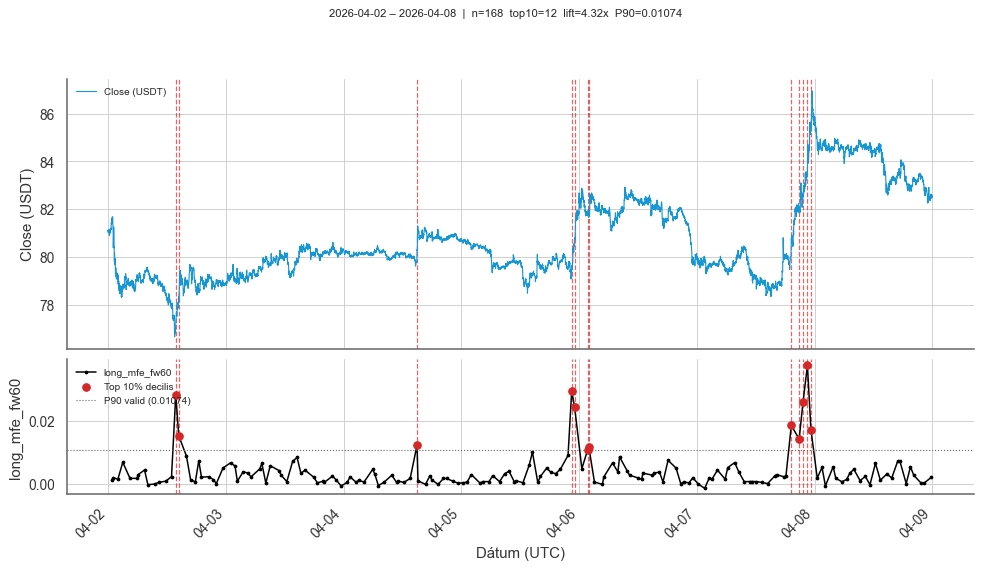



## 04-16–04-22


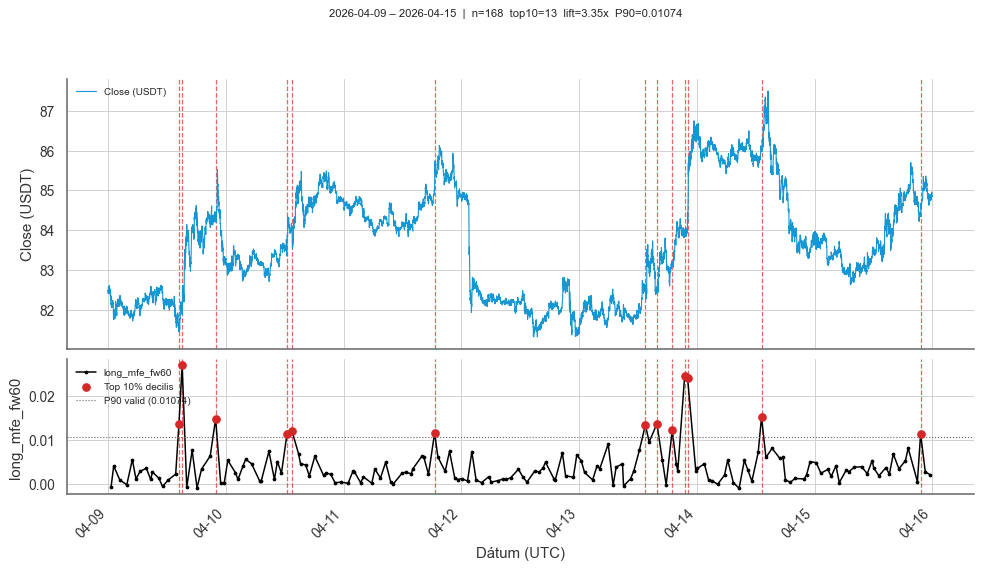



## 04-23–04-29


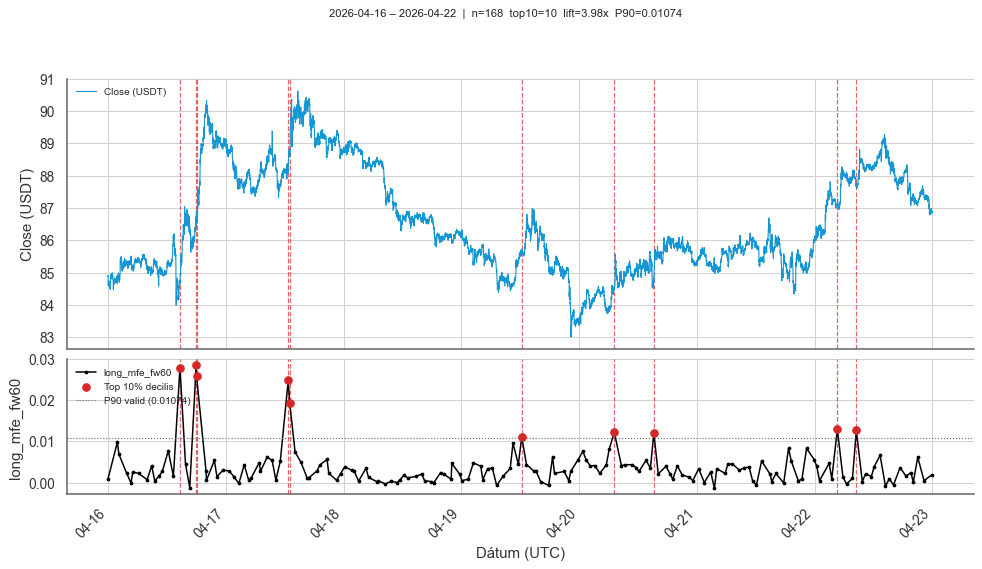



## 04-30–05-06


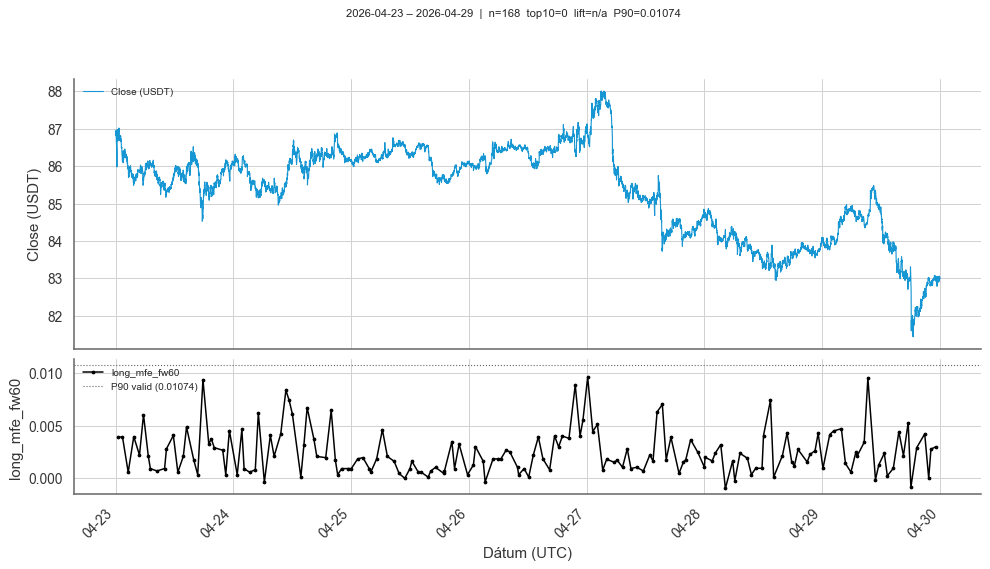



:::


#### May 2026

::: {.panel-tabset}

## 05-07–05-13


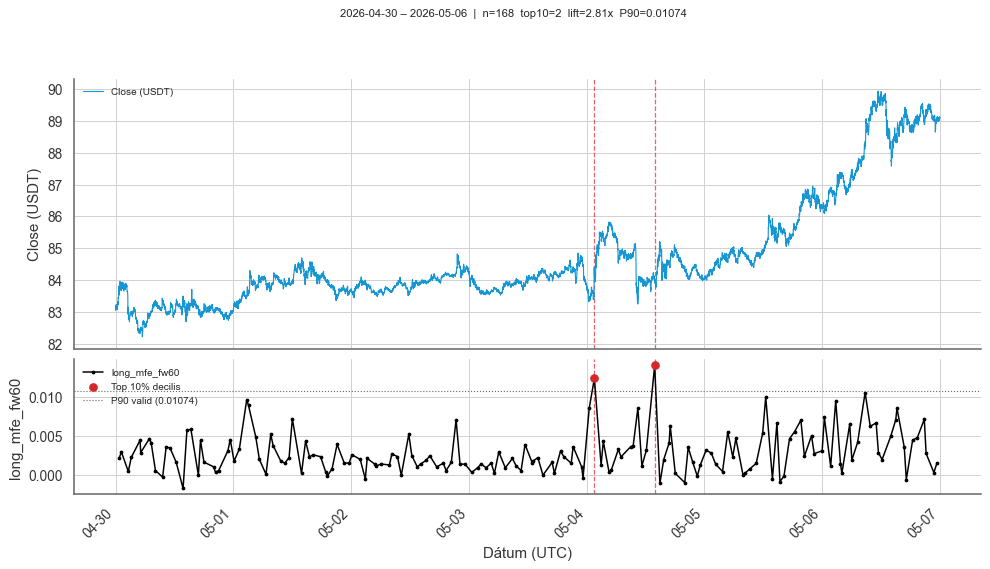



## 05-14–05-20


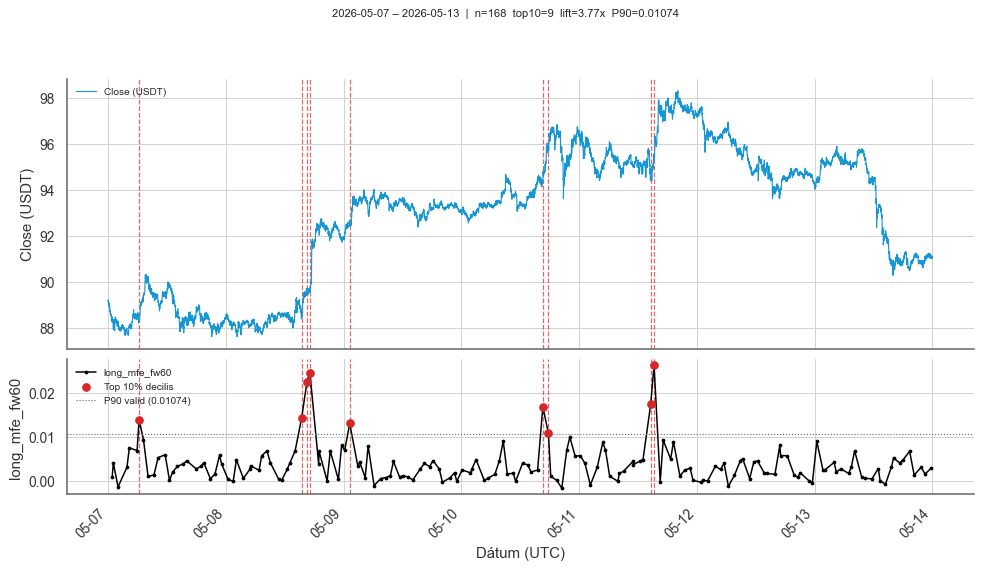



## 05-21–05-27


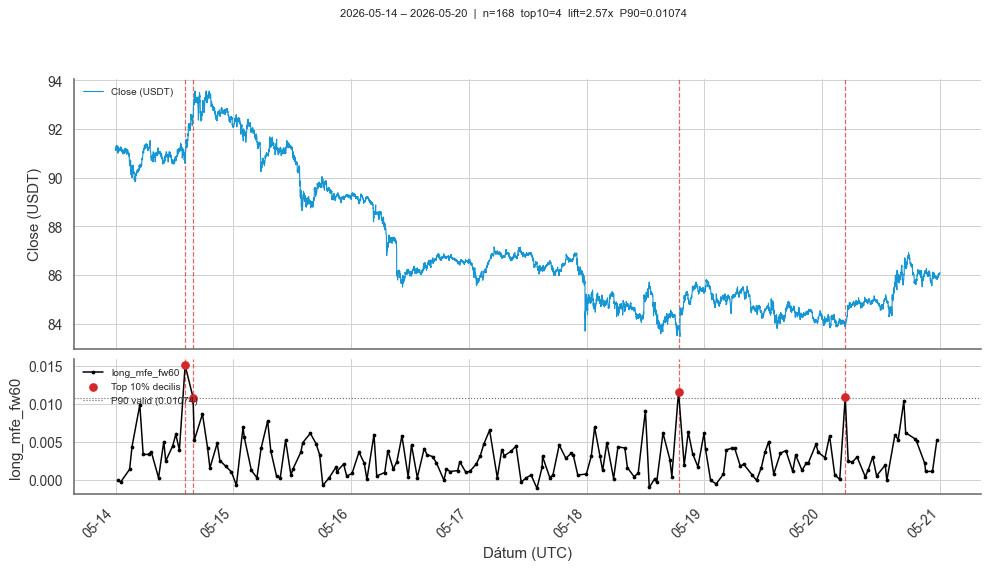



## 05-28–06-03


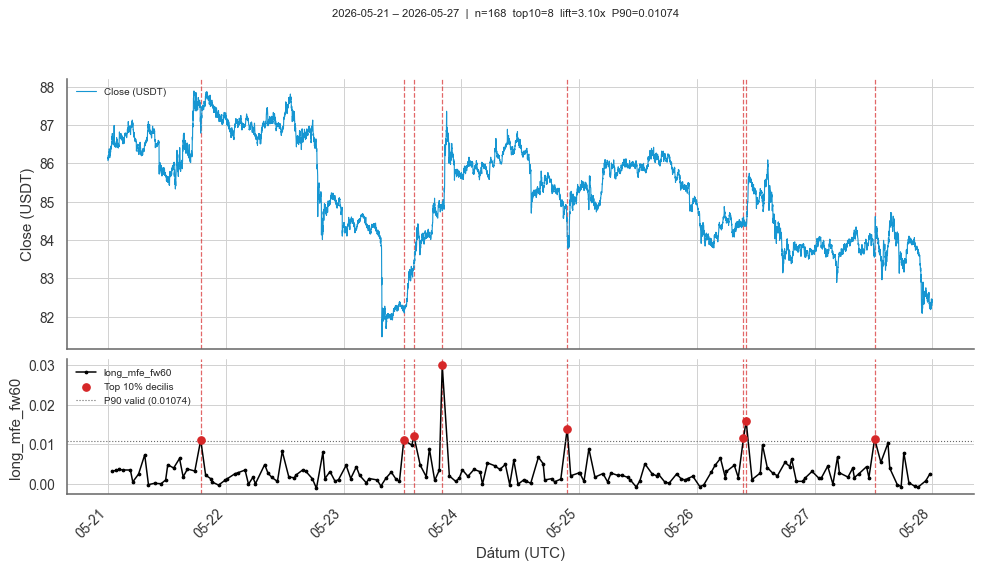



:::


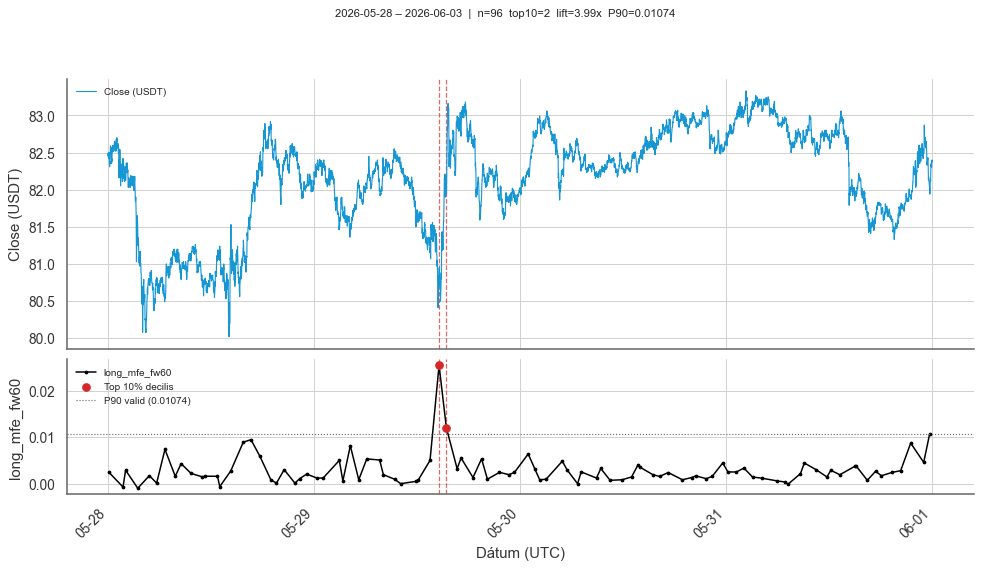

In [10]:
#| label: fig-valid-monthly-tabsets
#| output: asis
#| warning: false
#| echo: false

import base64, io, calendar

TOP_DECILE_COLOR = "#d62728"
TABSET_OPEN  = "::: {.panel-tabset}"
TABSET_CLOSE = ":::"

valid_full  = valid_df.copy()
p90_global  = p90_valid
valid_start = valid_df["open_time"].min().normalize()
valid_end   = valid_df["open_time"].max().normalize() + pd.Timedelta(days=1)
week_starts = pd.date_range(start=valid_start, end=valid_end, freq="7D")

LIVE_DB = str(_root / "database" / "solusdt" / "solusdt.duckdb")
con_live = duckdb.connect(LIVE_DB, read_only=True)
ohlcv_valid = con_live.execute(
    f"SELECT open_time, close FROM ohlcv "
    f"WHERE open_time >= '{valid_start}' AND open_time < '{valid_end}' "
    f"ORDER BY open_time"
).fetchdf()
con_live.close()
ohlcv_valid["open_time"] = pd.to_datetime(ohlcv_valid["open_time"])

valid_full2 = valid_full.copy()
valid_full2["top_decile"] = valid_full2[TARGET] >= p90_global

weeks_by_month = {}
for ws in week_starts:
    we = ws + pd.Timedelta(days=7)
    sw = valid_full2[(valid_full2["open_time"] >= ws) & (valid_full2["open_time"] < we)]
    if len(sw) == 0:
        continue
    mk = ws.strftime("%Y-%m")
    weeks_by_month.setdefault(mk, []).append((ws, we))

for month_str, week_list in weeks_by_month.items():
    y, m = int(month_str[:4]), int(month_str[5:])
    month_name = f"{calendar.month_abbr[m]} {y}"
    print(f"\n#### {month_name}\n")
    print(TABSET_OPEN + "\n")

    for ws, we in week_list:
        ohlcv_w  = ohlcv_valid[(ohlcv_valid["open_time"] >= ws) & (ohlcv_valid["open_time"] < we)]
        sample_w = valid_full2[(valid_full2["open_time"] >= ws) & (valid_full2["open_time"] < we)].copy()
        top_rows  = sample_w[sample_w["top_decile"]]
        top_times = top_rows["open_time"].tolist()

        tab_label = f"{ws.strftime('%m-%d')}–{(we - pd.Timedelta(days=1)).strftime('%m-%d')}"
        print(f"## {tab_label}\n")

        fig, (ax1, ax2) = plt.subplots(
            2, 1, sharex=True, figsize=(13, 6),
            gridspec_kw={"height_ratios": [2, 1], "hspace": 0.05}
        )

        for t in top_times:
            ax1.axvline(t, color=TOP_DECILE_COLOR, linewidth=1.0, linestyle="--", alpha=0.7, zorder=1)
            ax2.axvline(t, color=TOP_DECILE_COLOR, linewidth=1.0, linestyle="--", alpha=0.7, zorder=1)

        if len(ohlcv_w):
            ax1.plot(ohlcv_w["open_time"], ohlcv_w["close"],
                     color=CQ_COLORS["blue"], linewidth=0.9, label="Close (USDT)", zorder=2)
        ax1.set_ylabel("Close (USDT)")
        ax1.tick_params(axis="x", labelbottom=False)
        ax1.legend(loc="upper left", fontsize=8)

        if len(sample_w):
            ax2.plot(sample_w["open_time"], sample_w[TARGET],
                     color=CQ_COLORS["black"], linewidth=1.2, marker="o", markersize=2,
                     label="long_mfe_fw60", zorder=3)
        if len(top_rows):
            ax2.scatter(top_rows["open_time"], top_rows[TARGET],
                        color=TOP_DECILE_COLOR, s=35, zorder=4, label="Top 10% decilis")
        ax2.axhline(p90_global, color=CQ_COLORS["gray"], linewidth=0.9, linestyle=":",
                    label=f"P90 valid ({p90_global:.5f})", zorder=3)
        ax2.set_ylabel("long_mfe_fw60")
        ax2.set_xlabel("Dátum (UTC)")
        ax2.legend(loc="upper left", fontsize=8)

        ax2.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
        ax2.xaxis.set_major_locator(mdates.DayLocator(interval=1))
        plt.setp(ax2.get_xticklabels(), rotation=45, ha="right")

        top10_avg_w = top_rows[TARGET].mean() if len(top_rows) else float("nan")
        lift_w = top10_avg_w / global_avg if (len(top_rows) and global_avg > 0) else float("nan")
        lift_str = f"lift={lift_w:.2f}x" if not np.isnan(lift_w) else "lift=n/a"
        fig.suptitle(
            f"{ws.strftime('%Y-%m-%d')} – {(we - pd.Timedelta(days=1)).strftime('%Y-%m-%d')}"
            f"  |  n={len(sample_w)}  top10={len(top_rows)}  {lift_str}  P90={p90_global:.5f}",
            fontsize=9, y=1.01
        )
        plt.tight_layout()

        buf = io.BytesIO()
        fig.savefig(buf, format="png", dpi=90, bbox_inches="tight")
        buf.seek(0)
        img_b64 = base64.b64encode(buf.read()).decode()
        plt.close(fig)

        print(f"![](data:image/png;base64,{img_b64})\n")

    print(TABSET_CLOSE + "\n")